In [135]:
import warnings
warnings.filterwarnings('ignore')

from IPython.display import display
from IPython.display import HTML
import IPython.core.display as di # Example: di.display_html('<h3>%s:</h3>' % str, raw=True)

# This line will hide code by default when the notebook is exported as HTML
di.display_html('<script>jQuery(function() {if (jQuery("body.notebook_app").length == 0) { jQuery(".input_area").toggle(); jQuery(".prompt").toggle();}});</script>', raw=True)

# This line will add a button to toggle visibility of code blocks, for use with the HTML export version
di.display_html('''<button onclick="jQuery('.input_area').toggle(); jQuery('.prompt').toggle();">Toggle code</button>''', raw=True)

Toggle code

In [136]:
dataset_name = "W19_comb"
df_list = [ "BES_Panel", "BES_reduced_with_na"]

%matplotlib inline

import numpy as np, pandas as pd, matplotlib.pyplot as plt, seaborn as sns
import pickle, os, gc, re

sns.set();
sns.set_palette("colorblind")

from IPython.display import display, display_html, HTML
from IPython.core.debugger import set_trace
# plt.rcParams["axes.grid"] = False

import Jupyter_module_loader
from utility import *
import gaussian_kde

import warnings
warnings.filterwarnings('ignore')

import holoviews as hv
from holoviews import opts

encoding = "ISO-8859-1"

# you should clone this git to a subdirectory called 'BES_analysis_code' (in some directory - I call it BES_analysis - doesn't matter though)
# %matplotlib inline
(BES_code_folder, BES_small_data_files, BES_data_folder,
 BES_output_folder, BES_file_manifest, BES_R_data_files) = setup_directories()

global BES_Panel, BES_numeric, BES_reduced, BES_reduced_with_na, BES_non_numeric
data_subfolder = BES_data_folder + dataset_name + os.sep

(manifest, dataset_filename, dataset_description, dataset_citation,
 dataset_start, dataset_stop, dataset_wave) = get_manifest(dataset_name, BES_file_manifest)

for df in df_list:
    if df=="BES_Panel":
        globals()[df]  = pd.read_pickle(data_subfolder + dataset_filename.replace('.dta','.zip'),compression='zip')
    else:
        globals()[df]  = pd.read_pickle(data_subfolder + df + '.zip',compression='zip' )
        globals()[df].replace(-1,np.nan,inplace=True)
  
(var_type, cat_dictionary, new_old_col_names, old_new_col_names) = get_small_files(data_subfolder, encoding)

# get full set of inferred "cross wave" auth-lib/left-right values and ages
pan_dataset_allr_values = pd.read_csv(BES_small_data_files + "pan_dataset_allr_values"+".csv")
pan_dataset_ages = pd.read_csv( BES_small_data_files + "pan_dataset_ages"+".csv" )

var_type (7911, 14)


In [7]:
BES_reduced_with_na["al_scaleW17__Authoritarian"].astype('float32').corr(
    BES_reduced_with_na["trustCourtsW17__10.0"].astype('float32') )

-0.2993025491147275

In [5]:
search(BES_reduced_with_na,"al_Scale")

al_scaleW1W2W3W4W5__Authoritarian    37890
al_scaleW6__Authoritarian            27288
al_scaleW7W8W9__Authoritarian        35873
al_scaleW10W11W12__Authoritarian     30088
al_scaleW13__Authoritarian           27253
al_scaleW14W15__Authoritarian        31629
al_scaleW16__Authoritarian           32671
al_scaleW17__Authoritarian           29773
dtype: int64

In [4]:
search(BES_reduced_with_na,"trustCourts")

trustCourtsW17__10.0    32586
dtype: int64

In [7]:
%%time
pattern = "likeStarmerW19__Strongly like"
name = pattern
corr_type = "spearman"
corr_df,corr_type = make_corr_summary(BES_reduced_with_na.astype('float32'), name, corr_type, pattern=pattern)
display_corr(corr_df, name, corr_type, text_wrap_length=50)

,r,p,N
likeMoranW19__Strongly like,0.690000,0.00,6399
likeRaynerW19__Strongly like,0.660000,0.00,10680
bestPMW18_Jeremy Corbyn,0.650000,0.00,2390
remainVnodealW17_Remain in the EU,0.640000,0.00,2700
brexitSelfW16__Remain in the EU,0.640000,0.00,2764
dealVremainW18_Remain in the EU,0.640000,0.00,12599
likeLabW18__Strongly like,0.630000,0.00,14163
euRefDoOverW17_Yes,0.630000,0.00,11373
customsUnionW16__Strongly support,0.630000,0.00,10165
likePhillipsW19__Strongly like,0.620000,0.00,12124


Wall time: 4min 45s


In [56]:
def lazy_weighted_indices(weights):
    x = weights.apply(lambda x: np.floor(x) if (np.random.rand() > x%1) else np.ceil(x)).astype('int')
    return flatten( [[weights.index[ind]]*x.values[ind] for ind in range(weights.shape[0])] )

def weighted_value_counts(x, wts, *args, **kwargs):
    normalize = kwargs.get('normalize', False)
    perc = kwargs.get('perc', False)
    decimal_places = kwargs.get('decimal_places', 2)
    suppress_raw_samplesize = kwargs.get('suppress_raw_samplesize', False)
    
    ascending = kwargs.get('ascending', True)
    c0 = x.name 
    c1 = wts.name
    df = pd.concat([x,wts],axis=1)
    xtmp = df.groupby(c0).agg({c1:'sum'}).sort_values(c1,ascending=False)
    s = pd.Series(index=xtmp.index, data=xtmp[c1], name=c0)
    s.name = "weighted_sample_size"
    if normalize:
        s = s / df[c1].sum()
        s.name = "weighted_sample_fraction"
    if normalize and perc:
        s = s*100
        s.name = "weighted_sample_percentage"
    s = s.round(decimal_places)
    if decimal_places==0:
        s=s.astype('int')
        
    if not suppress_raw_samplesize:
        output = pd.DataFrame([s,x[wts.notnull()].value_counts()]).T
        output.columns = [s.name,"raw_sample_size"]
        output.index.name = x.name
        output.sort_values(by=s.name,inplace=True, ascending=ascending)
    else:
        output = s
    return output

In [78]:
df = pd.DataFrame()
pol_list = ["Starmer","LongBailey","Phillips","Rayner","Boris","Corbyn","Swinson"]
for pol in pol_list:
    df[pol] = weighted_value_counts(BES_Panel["like"+pol+"W19"],BES_Panel["wt_new_W19_result"],normalize=True,perc=True,decimal_places=2).sort_index()["weighted_sample_percentage"]
df = df.stack().reset_index()
df.columns = ["How much do you like this politician?","Politician","Percentage"]

In [85]:
df["Politician"] = df["Politician"].astype('category').cat.reorder_categories(["LongBailey", "Rayner", "Phillips", "Starmer", 
                                                            "Swinson","Boris", "Corbyn", ])

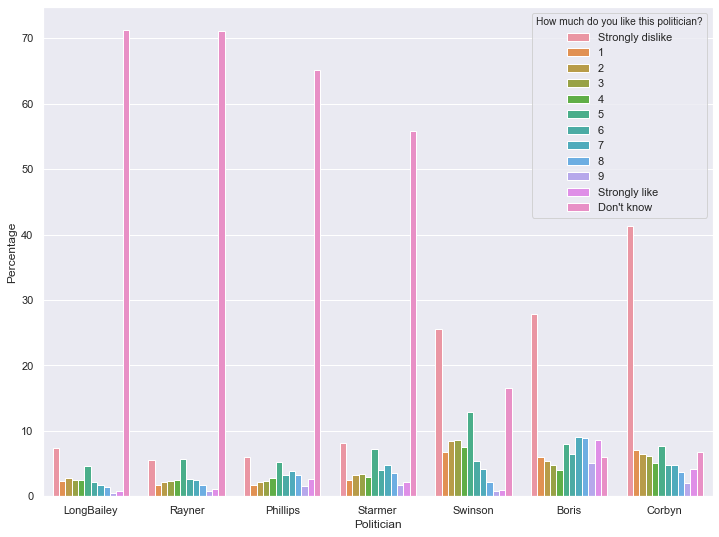

In [91]:
plt.figure(figsize=(12,9))
sns.barplot(data=df,hue=df.columns[0],y=df.columns[2],x=df.columns[1]);
plt.title("Post GE2019")

In [46]:

       
# transform a column of data until it's as approximately normally distributed as can be
# because most Machine Learning/Statistical methods assume data is ~normally distributed
# basically, what people normally do randomly logging/square-rooting data, only automatically

from scipy import stats
def box_cox_normalise(ser, offset = 3, bw='scott'):
    
    
    # box cox lr_scale
    fig = plt.figure()
    ax1 = fig.add_subplot(311)
    x = ser.values +ser.values.min()+offset
    prob = stats.probplot(x, dist=stats.norm, plot=ax1)
    ax1.set_xlabel('')
    ax1.set_title('Probplot against normal distribution')
    ax2 = fig.add_subplot(312)
    xt, _ = stats.boxcox(x)
    prob = stats.probplot(xt, dist=stats.norm, plot=ax2)
    ax2.set_title('Probplot after Box-Cox transformation')
    ax3 = fig.add_subplot(313)
    xt_std = (xt-xt.mean())/xt.std()
    sns.kdeplot(xt_std, ax=ax3, bw=bw, cut=0);
    sns.kdeplot(np.random.normal(size=len(xt_std)), ax=ax3, cut=0);
    plt.suptitle(ser.name)
    return xt_std
    

def corrank(X):
    import itertools
    df = pd.DataFrame([[(i,j),X.loc[i,j]] for i,j in list(itertools.combinations(X.corr(), 2))],columns=['pairs','corr'])    
    print(df.sort_values(by='corr',ascending=False).dropna())
    
    
# messy but time saver
    
   
import shap
import xgboost as xgb
# from sklearn.preprocessing import Imputer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_val_score, GridSearchCV, train_test_split
from sklearn.linear_model import ElasticNet
from xgboost import XGBClassifier, XGBRegressor
from sklearn.metrics import accuracy_score, mean_squared_error, mean_absolute_error, explained_variance_score, r2_score

def shap_outputs(shap_values, train, target_var, output_subfolder,
                 dependence_plots = False, threshold = .1, min_features = 30,
                 title=None):

    #################################
#     threshold = .1
#     min_features = 30
    global_shap_vals = np.abs(shap_values).mean(0)#[::-1]
    n_top_features = max( sum(global_shap_vals[np.argsort(global_shap_vals)]>=threshold),
                          min_features )
#     if n_top_features <min_features:
#         n_top_features = min_features

    ##########################

    inds = np.argsort(global_shap_vals)[-n_top_features:]

    y_pos = np.arange(n_top_features)
    plt.figure(figsize=(16,10))
    plt.title(target_var);
    plt.barh(y_pos, global_shap_vals[inds], color="#1E88E5")
    plt.yticks(y_pos, train.columns[inds])
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines['top'].set_visible(False)
    plt.xlabel("mean SHAP value magnitude (change in log odds)")
    plt.gcf().set_size_inches(6, 4.5)

    plt.savefig( output_subfolder + "mean_impact" + ".png", bbox_inches='tight' )

    plt.show()

    ####################
    
    fig = plt.figure()
    if title is None:
        fig.suptitle(target_var);
    else:
        fig.suptitle(title);
        
    shap.summary_plot( shap_values, train, max_display=n_top_features, plot_type='dot' );
    shap_problem = np.isnan(np.abs(shap_values).mean(0)).any()
    if shap_problem:
        summary_text = "summary_plot(approx)"
    else:
        summary_text = "summary_plot"
    
    fig.savefig( output_subfolder + summary_text + ".png", bbox_inches='tight' )
    
        ##################
    if dependence_plots:
        count = 0
        for name in train.columns[inds[::-1]]:
            fig = plt.figure(figsize = (16,10))
            fig.suptitle(target_var);
            shap.dependence_plot(name, shap_values, train)
            clean_filename(name)
            fig.savefig(output_subfolder + "featureNo "+str(count) + " " + clean_filename(name) + ".png", bbox_inches='tight')
            count = count + 1
            
def get_non_overfit_settings( train, target, alg, seed, early_stoppping_fraction, test_size, eval_metric, verbose = True,
                              sample_weights = None ):

    if sample_weights is not None:

        X_train, X_test, y_train, y_test = train_test_split( pd.concat( [train,sample_weights], axis=1 ),
                                                             target, test_size=test_size,
                                                             random_state=seed, stratify=pd.qcut( pd.Series( target ),
                                                                                                  q=10,
                                                                                                  duplicates = 'drop',
                                                                                                ).cat.codes )

        eval_set = [(X_test, y_test)]

        sample_weight = X_train[weight_var].values
        sample_weight_eval_set = X_test[weight_var].values
        X_train.drop(weight_var, axis=1, inplace=True)
        X_test.drop(weight_var, axis=1, inplace=True)

        alg.fit(X_train, y_train, eval_metric=eval_metric, 
                early_stopping_rounds = alg.get_params()['n_estimators']*early_stoppping_fraction,
                eval_set=eval_set, verbose=True, sample_weight = sample_weight)
        
    else:
        X_train, X_test, y_train, y_test = train_test_split( train,
                                                             target, test_size=test_size,
                                                             random_state=seed, stratify=pd.qcut( pd.Series( target ),
                                                                                                  q=10,
                                                                                                  duplicates = 'drop',
                                                                                                ).cat.codes )
          
            

        eval_set = [(X_test, y_test)]

        alg.fit(X_train, y_train, eval_metric=eval_metric, 
                early_stopping_rounds = alg.get_params()['n_estimators']*early_stoppping_fraction,
                eval_set=eval_set, verbose=True )        
        

    # make predictions for test data
    predictions = alg.predict(X_test)

    # evaluate predictions
    MSE = mean_squared_error(y_test, predictions)
    MAE = mean_absolute_error(y_test, predictions)
    EV = explained_variance_score(y_test, predictions)
    R2 = r2_score(y_test, predictions)

    print("MSE: %.2f, MAE: %.2f, EV: %.2f, R2: %.2f" % (MSE, MAE, EV, R2) )
    alg.set_params(n_estimators=alg.best_iteration)            
    
global var_list, mask
def xgboost_run(title, subdir=None, min_features=30, dependence_plots=False , output_folder=".."+os.sep+"Output"+os.sep,Treatment="default"):
    # for target_var,base_var in zip(var_list,base_list):
    treatment_subfolder = create_subdir(output_folder,Treatment)

    for target_var in var_list:
        if sample_wts:
            wave_no = get_wave_no( target_var )
            weight_var = num_to_weight[wave_no]    
            print( target_var, wave_no )

        target = create_target(target_var)
        mask   = target.notnull()
        if optional_mask & sample_wts:
            mask = mask&optional_mask_fn(wave_no)
        else:
            mask = mask&optional_mask_fn()
        target = target[mask]

        if sum(mask) < minimum_sample:
            continue

        train = create_train(drop_other_waves, mask)

        if subdir is None:
            output_subfolder = create_subdir(treatment_subfolder,target_var)
        else:
            output_subfolder = create_subdir(treatment_subfolder,subdir)

        if sample_wts:
            sample_weights = weights[weight_var][mask]
            print("missing vals in sample weights: "+ str( sample_weights.isnull().sum() ) )
            sample_weights = sample_weights.fillna(sample_weights.median())
        else:
            sample_weights = None
    #         get_non_overfit_settings( train, target, alg, seed, early_stoppping_fraction, test_size, sample_weights )
    #         # fit to full dataset at non-overfitting level
    #         alg.fit(train, target, verbose = True, sample_weight = sample_weights)        
    #     else:

        get_non_overfit_settings( train, target, alg, seed, early_stoppping_fraction, test_size, eval_metric, verbose = True,
                                  sample_weights=sample_weights )
        # fit to full dataset at non-overfitting level
        alg.fit(train, target, verbose = True, sample_weight = sample_weights)


    #################

        explainer = shap.TreeExplainer(alg)
        shap_values = explainer.shap_values(train)
        
#         shap_values = shap.TreeExplainer(alg).shap_values(train);

        shap_problem = np.isnan(np.abs(shap_values).mean(0)).any()
        if shap_problem:
            print("hit problem!")
            shap_values = shap.TreeExplainer(alg).shap_values(train, approximate=True);

        shap_outputs(shap_values, train, target_var, output_subfolder, threshold = .1,
                     min_features = min_features, title=title,
                     dependence_plots=dependence_plots)
        
    return (explainer, shap_values, train.columns)







############################ BASIC SETTINGS

from sklearn import datasets
from sklearn.decomposition import PCA, IncrementalPCA, NMF, TruncatedSVD, FastICA, FactorAnalysis, SparsePCA
from sklearn.preprocessing import StandardScaler
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
    
optional_mask = False
sample_wts = False
drop_other_waves = False


# Leavers only
def optional_mask_fn(wave=[]):
#     return BES_Panel["generalElectionVoteW19"].notnull()
    return 1



def create_train(drop_other_waves,mask):
    keep_list = df.columns
    
    if drop_other_waves:
        # drop variables from other waves
        other_waves = get_other_wave_pattern(wave_no, max_wave, num_to_wave)
        keep_list = [x for x in keep_list if not re.search( other_waves, x )]
        
    # drop key variables
    keep_list = [x for x in keep_list if not any([var_stub in x for var_stub in var_stub_list])] 
    
    return df[keep_list][mask].astype('float32')


def create_target(target_var):
    
    return df[target_var].astype('float32')

objective = 'reg:linear'
eval_metric = 'rmse'

seed = 27
test_size = 0.33
minimum_sample = 100
early_stoppping_fraction = .1

alg = XGBRegressor(
 learning_rate =0.03,
 n_estimators= 600,
 max_depth=6,
 min_child_weight=8,
 gamma=0,
 subsample=0.75,
 colsample_bytree=0.6,
 colsample_bylevel=.85,
 objective= objective,
 scale_pos_weight=1.0,
 reg_alpha=0,
 reg_lambda=1,
 njobs=3,
 seed=seed**2)

def add_pairs(wave_pair):
    pair1_cols = [x for x in search(df,wave_pair[0]).index if x.replace(wave_pair[0],wave_pair[1]) in df.columns]
    pair2_cols = [x.replace(wave_pair[0],wave_pair[1]) for x in pair1_cols]

    prefix = "D"+"_".join([x.replace("W","") for x in wave_pair])
    delta_df = pd.DataFrame(df[pair2_cols].values - df[pair1_cols].values,
                            columns = [prefix+x.replace(wave_pair[0],"") for x in pair1_cols])

    biggest_dtype = df[pair1_cols].dtypes.value_counts().index[-1].name
    biggest_dtype = "Int64" # nino_df screws this up by introducing floats!
    delta_df = delta_df.astype(biggest_dtype).astype('float32')
    df[delta_df.columns] = delta_df
    
def shap_array(shap_values, train_columns, threshold = .1, min_features = 50):

    global_shap_vals = np.abs(shap_values).mean(0)#[::-1]
    n_top_features = max( sum(global_shap_vals[np.argsort(global_shap_vals)]>=threshold),
                          min_features )

    inds = np.argsort(global_shap_vals)[-n_top_features:]

    return pd.Series(global_shap_vals[inds][::-1],index = train_columns[inds][::-1])    

def hash_df(sourcedf,destinationdf,*column):
    columnName = ''
    destinationdf['hash_'+columnName.join(column)] = pd.DataFrame(sourcedf[list(column)].values.sum(axis=1))[0].str.encode('utf-8').apply(lambda x: (hashlib.sha512(x).hexdigest().upper()))
# hash_df(df,df,'ID','Salt')

def drop_duplicate_columns(df):
    return df.loc[:,~df.columns.duplicated()]

In [11]:
Treatment = "likeStarmer"
var_stub = "likeStarmer"

var_list = ["likeStarmerW19__Strongly like"]
var_stub_list = [var_stub]

df = BES_reduced_with_na.copy()


# def optional_mask_fn(wave=[]):
#     return BES_Panel["generalElectionVoteW19"]=="Conservative"

[14:11:19] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:4.92125
Will train until validation_0-rmse hasn't improved in 60.0 rounds.
[1]	validation_0-rmse:4.80007
[2]	validation_0-rmse:4.6836
[3]	validation_0-rmse:4.57075
[4]	validation_0-rmse:4.46183
[5]	validation_0-rmse:4.35611
[6]	validation_0-rmse:4.25469
[7]	validation_0-rmse:4.15761
[8]	validation_0-rmse:4.06263
[9]	validation_0-rmse:3.97255
[10]	validation_0-rmse:3.88381
[11]	validation_0-rmse:3.79855
[12]	validation_0-rmse:3.71602
[13]	validation_0-rmse:3.63691
[14]	validation_0-rmse:3.56064
[15]	validation_0-rmse:3.48681
[16]	validation_0-rmse:3.41617
[17]	validation_0-rmse:3.34735
[18]	validation_0-rmse:3.28131
[19]	validation_0-rmse:3.21848
[20]	validation_0-rmse:3.15918
[21]	validation_0-rmse:3.10129
[22]	validation_0-rmse:3.04576
[23]	validation_0-rmse:2.99287
[24]	validation_0-rmse:2.94164
[25]	validation_0-rmse:2.89242
[26]	validation_0-rmse

[255]	validation_0-rmse:1.8375
[256]	validation_0-rmse:1.8375
[257]	validation_0-rmse:1.83753
[258]	validation_0-rmse:1.8376
[259]	validation_0-rmse:1.83752
[260]	validation_0-rmse:1.83748
[261]	validation_0-rmse:1.83746
[262]	validation_0-rmse:1.83737
[263]	validation_0-rmse:1.83728
[264]	validation_0-rmse:1.83732
[265]	validation_0-rmse:1.83727
[266]	validation_0-rmse:1.83724
[267]	validation_0-rmse:1.83721
[268]	validation_0-rmse:1.83711
[269]	validation_0-rmse:1.83703
[270]	validation_0-rmse:1.83682
[271]	validation_0-rmse:1.83681
[272]	validation_0-rmse:1.83686
[273]	validation_0-rmse:1.83691
[274]	validation_0-rmse:1.8368
[275]	validation_0-rmse:1.8369
[276]	validation_0-rmse:1.83719
[277]	validation_0-rmse:1.83709
[278]	validation_0-rmse:1.83716
[279]	validation_0-rmse:1.83717
[280]	validation_0-rmse:1.83715
[281]	validation_0-rmse:1.83708
[282]	validation_0-rmse:1.83715
[283]	validation_0-rmse:1.83713
[284]	validation_0-rmse:1.8369
[285]	validation_0-rmse:1.837
[286]	validation

MSE: 3.36, MAE: 1.39, EV: 0.66, R2: 0.66
[14:31:13] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


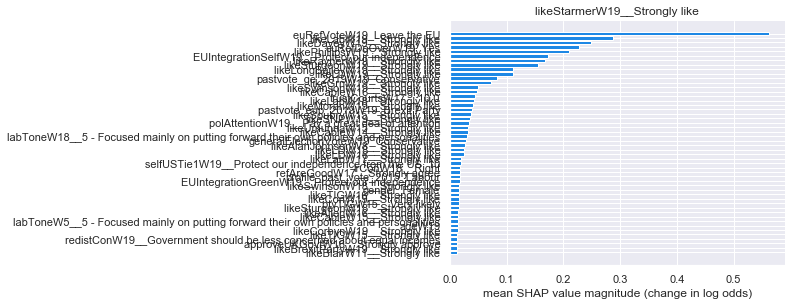

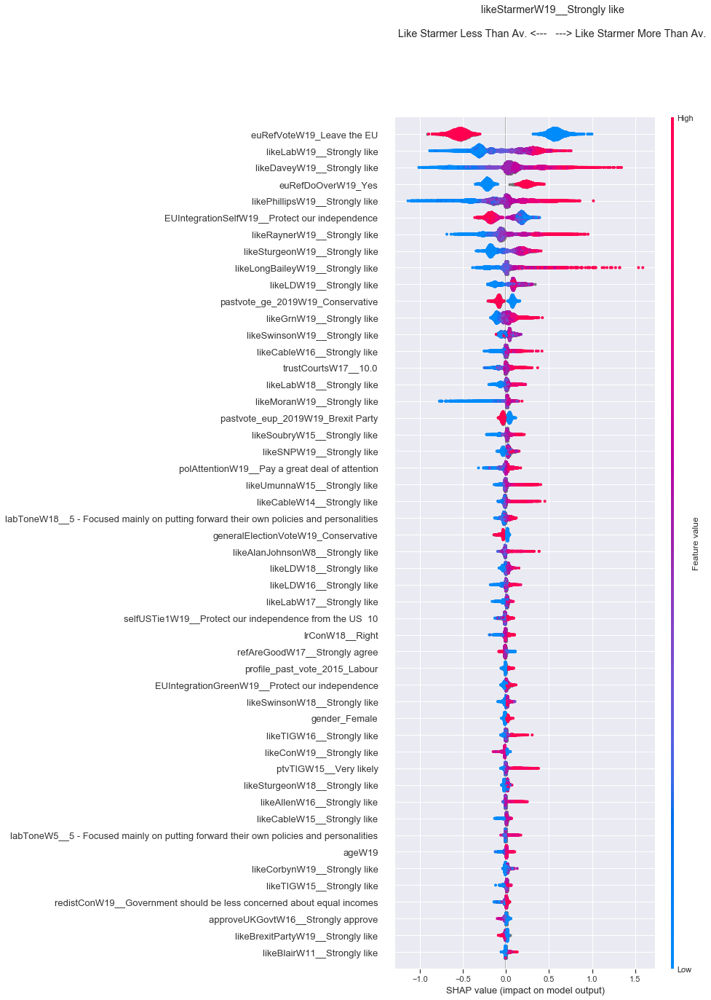

Wall time: 50min 16s


(<shap.explainers.tree.TreeExplainer at 0x36872548>,
 array([[ 0.0000000e+00,  0.0000000e+00,  6.5555789e-05, ...,
          7.9612350e-05,  0.0000000e+00,  3.5314897e-05],
        [ 0.0000000e+00,  0.0000000e+00,  6.5555789e-05, ...,
          1.2475549e-04,  0.0000000e+00,  9.7678734e-05],
        [ 0.0000000e+00,  0.0000000e+00, -3.1813845e-05, ...,
          8.0058016e-05,  0.0000000e+00,  3.9305369e-04],
        ...,
        [ 0.0000000e+00,  0.0000000e+00, -3.1813845e-05, ...,
          5.4051714e-05,  0.0000000e+00,  1.5701227e-04],
        [ 0.0000000e+00,  0.0000000e+00, -3.1813845e-05, ...,
          5.2087678e-05,  0.0000000e+00,  5.0714396e-05],
        [ 0.0000000e+00,  0.0000000e+00, -3.1813845e-05, ...,
          4.0030965e-05,  0.0000000e+00,  4.3042190e-05]], dtype=float32),
 Index(['turnoutUKGeneralW1__Very likely that I will vote',
        'turnoutUKGeneralW2__Very likely that I will vote',
        'turnoutUKGeneralW3__Very likely that I will vote',
        'turnoutU

In [12]:
%%time
colname = "likeStarmerW19__Strongly like"
# BES_cens = BES_cens_base[fertility_columns+age_columns+["leaveHanretty"]+["c11Degree"]]
xgboost_run(subdir=colname,min_features = min(BES_reduced_with_na.shape[1]-1,50),
           title = colname+"\n\nLike Starmer Less Than Av. <---   ---> Like Starmer More Than Av.")

In [18]:
Treatment = "likeStarmerLAB2005"
var_stub = "likeStarmer"

var_list = ["likeStarmerW19__Strongly like"]
var_stub_list = [var_stub,"likeLab","profile_past_vote_2005"]

mask = (BES_Panel["profile_past_vote_2005"]=="Labour") & (BES_Panel["likeStarmerW19"].notnull())
df = BES_reduced_with_na[mask].copy()


# def optional_mask_fn(wave=[]):
#     return BES_Panel["generalElectionVoteW19"]=="Conservative"

[15:08:49] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:5.11032
Will train until validation_0-rmse hasn't improved in 45.0 rounds.
[1]	validation_0-rmse:4.98031
[2]	validation_0-rmse:4.85361
[3]	validation_0-rmse:4.73093
[4]	validation_0-rmse:4.61474
[5]	validation_0-rmse:4.50044
[6]	validation_0-rmse:4.39112
[7]	validation_0-rmse:4.28318
[8]	validation_0-rmse:4.18064
[9]	validation_0-rmse:4.0824
[10]	validation_0-rmse:3.98835
[11]	validation_0-rmse:3.89807
[12]	validation_0-rmse:3.80603
[13]	validation_0-rmse:3.72127
[14]	validation_0-rmse:3.63993
[15]	validation_0-rmse:3.56127
[16]	validation_0-rmse:3.48462
[17]	validation_0-rmse:3.41193
[18]	validation_0-rmse:3.34354
[19]	validation_0-rmse:3.27552
[20]	validation_0-rmse:3.20904
[21]	validation_0-rmse:3.14502
[22]	validation_0-rmse:3.08449
[23]	validation_0-rmse:3.02717
[24]	validation_0-rmse:2.97157
[25]	validation_0-rmse:2.91673
[26]	validation_0-rmse

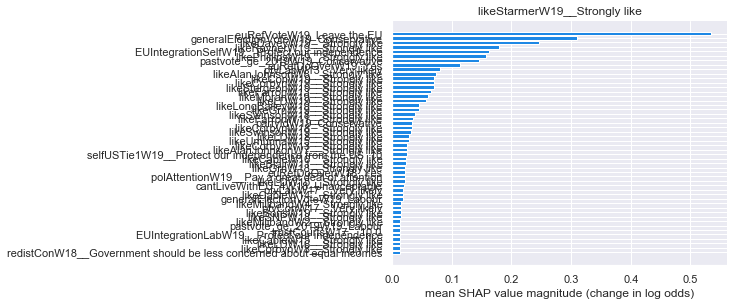

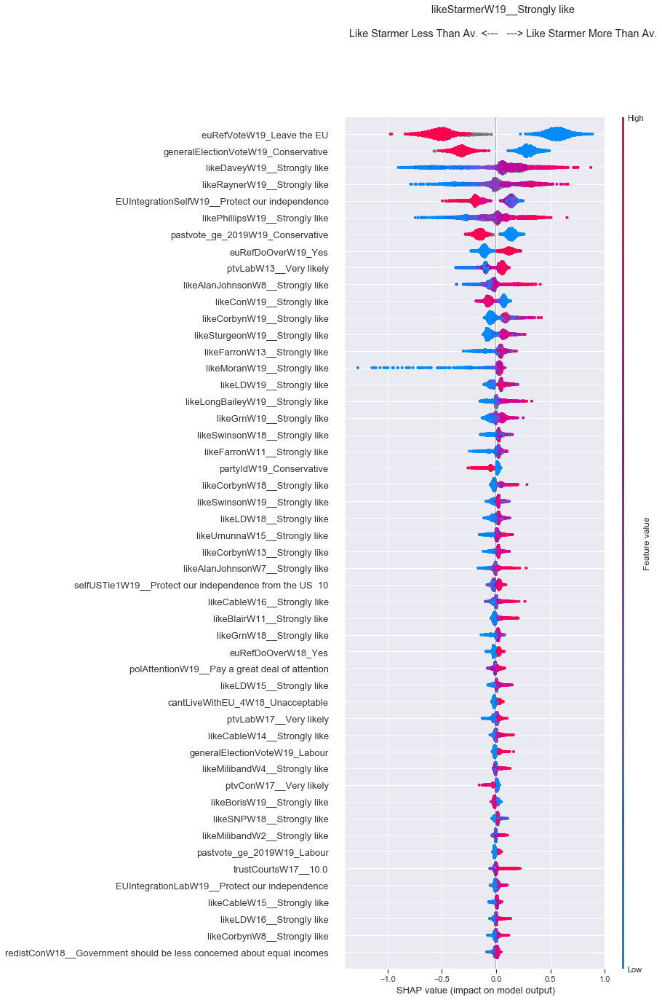

Wall time: 4min 31s


(<shap.explainers.tree.TreeExplainer at 0x4125cec8>,
 array([[0.0000000e+00, 1.6577868e-04, 0.0000000e+00, ..., 0.0000000e+00,
         0.0000000e+00, 0.0000000e+00],
        [0.0000000e+00, 9.7707598e-05, 0.0000000e+00, ..., 0.0000000e+00,
         0.0000000e+00, 0.0000000e+00],
        [0.0000000e+00, 1.6577868e-04, 0.0000000e+00, ..., 0.0000000e+00,
         0.0000000e+00, 0.0000000e+00],
        ...,
        [0.0000000e+00, 9.7707598e-05, 0.0000000e+00, ..., 0.0000000e+00,
         0.0000000e+00, 0.0000000e+00],
        [0.0000000e+00, 9.7707598e-05, 0.0000000e+00, ..., 0.0000000e+00,
         0.0000000e+00, 0.0000000e+00],
        [0.0000000e+00, 9.7707598e-05, 0.0000000e+00, ..., 0.0000000e+00,
         0.0000000e+00, 0.0000000e+00]], dtype=float32),
 Index(['turnoutUKGeneralW1__Very likely that I will vote',
        'turnoutUKGeneralW2__Very likely that I will vote',
        'turnoutUKGeneralW3__Very likely that I will vote',
        'turnoutUKGeneralW4__Very likely that I will 

In [19]:
%%time
colname = "likeStarmerW19__Strongly like"
# BES_cens = BES_cens_base[fertility_columns+age_columns+["leaveHanretty"]+["c11Degree"]]
xgboost_run(subdir=colname,min_features = min(BES_reduced_with_na.shape[1]-1,50),
           title = colname+"\n\nLike Starmer Less Than Av. <---   ---> Like Starmer More Than Av.")

In [93]:
(BES_Panel["partyMemberNowW17"]=="Labour").sum()

825

In [25]:
Treatment = "likeStarmer2019LabMembers"
var_stub = "likeStarmer"

var_list = ["likeStarmerW19__Strongly like"]
var_stub_list = [var_stub,]

mask = (BES_Panel["partyMemberNowW17"]=="Labour") & (BES_Panel["likeStarmerW19"].notnull())
df = BES_reduced_with_na[mask].copy()


# def optional_mask_fn(wave=[]):
#     return BES_Panel["generalElectionVoteW19"]=="Conservative"

[15:45:00] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:6.75901
Will train until validation_0-rmse hasn't improved in 14.8 rounds.
[1]	validation_0-rmse:6.58543
[2]	validation_0-rmse:6.42158
[3]	validation_0-rmse:6.24762
[4]	validation_0-rmse:6.08366
[5]	validation_0-rmse:5.93277
[6]	validation_0-rmse:5.79509
[7]	validation_0-rmse:5.65705
[8]	validation_0-rmse:5.51783
[9]	validation_0-rmse:5.38709
[10]	validation_0-rmse:5.25046
[11]	validation_0-rmse:5.12396
[12]	validation_0-rmse:4.99994
[13]	validation_0-rmse:4.89248
[14]	validation_0-rmse:4.7838
[15]	validation_0-rmse:4.67036
[16]	validation_0-rmse:4.56674
[17]	validation_0-rmse:4.46796
[18]	validation_0-rmse:4.36558
[19]	validation_0-rmse:4.27011
[20]	validation_0-rmse:4.1769
[21]	validation_0-rmse:4.09017
[22]	validation_0-rmse:4.00361
[23]	validation_0-rmse:3.92648
[24]	validation_0-rmse:3.84392
[25]	validation_0-rmse:3.76589
[26]	validation_0-rmse:

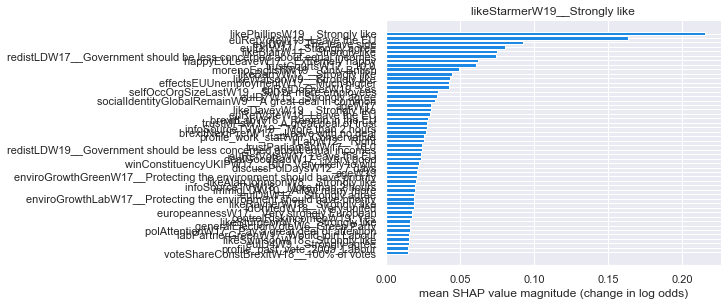

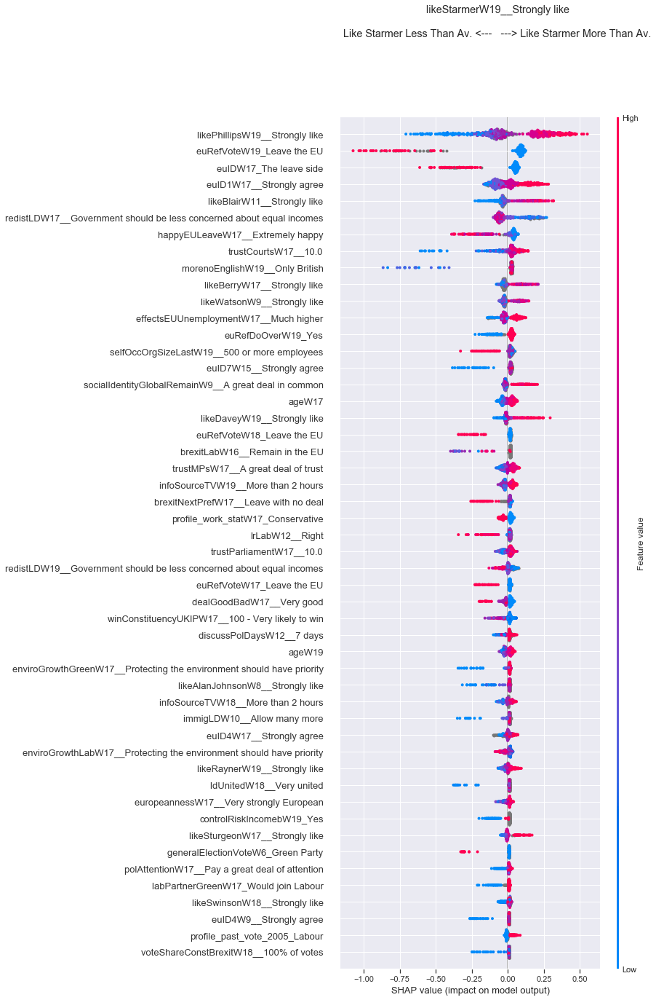

Wall time: 46.7 s


(<shap.explainers.tree.TreeExplainer at 0x326f07c8>,
 array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]], dtype=float32),
 Index(['turnoutUKGeneralW1__Very likely that I will vote',
        'turnoutUKGeneralW2__Very likely that I will vote',
        'turnoutUKGeneralW3__Very likely that I will vote',
        'turnoutUKGeneralW4__Very likely that I will vote',
        'turnoutUKGeneralW5__Very likely that I will vote',
        'turnoutUKGeneralW7__Very likely that I will vote',
        'turnoutUKGeneralW8__Very likely that I will vote',
        'turnoutUKGeneralW9__Very likely that I will vote',
        'turnoutUKGeneralW10__Very likely that I will vote',
        'turnoutUKGeneralW11__Very likely that I will vote',
        ...
        'conPriorities2_schoolW4_Yes', 'conPriorities2_nhsW4_Yes',
  

In [26]:
%%time
colname = "likeStarmerW19__Strongly like"
# BES_cens = BES_cens_base[fertility_columns+age_columns+["leaveHanretty"]+["c11Degree"]]
xgboost_run(subdir=colname,min_features = min(BES_reduced_with_na.shape[1]-1,50),
           title = colname+"\n\nLike Starmer Less Than Av. <---   ---> Like Starmer More Than Av.")

[15:53:40] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:5.65044
Will train until validation_0-rmse hasn't improved in 14.4 rounds.
[1]	validation_0-rmse:5.52924
[2]	validation_0-rmse:5.40602
[3]	validation_0-rmse:5.28608
[4]	validation_0-rmse:5.17624
[5]	validation_0-rmse:5.06017
[6]	validation_0-rmse:4.95554
[7]	validation_0-rmse:4.86097
[8]	validation_0-rmse:4.76487
[9]	validation_0-rmse:4.67009
[10]	validation_0-rmse:4.58524
[11]	validation_0-rmse:4.50398
[12]	validation_0-rmse:4.42156
[13]	validation_0-rmse:4.33177
[14]	validation_0-rmse:4.25138
[15]	validation_0-rmse:4.18647
[16]	validation_0-rmse:4.11259
[17]	validation_0-rmse:4.04892
[18]	validation_0-rmse:3.98489
[19]	validation_0-rmse:3.92012
[20]	validation_0-rmse:3.8616
[21]	validation_0-rmse:3.79581
[22]	validation_0-rmse:3.74107
[23]	validation_0-rmse:3.6915
[24]	validation_0-rmse:3.64159
[25]	validation_0-rmse:3.59497
[26]	validation_0-rmse:

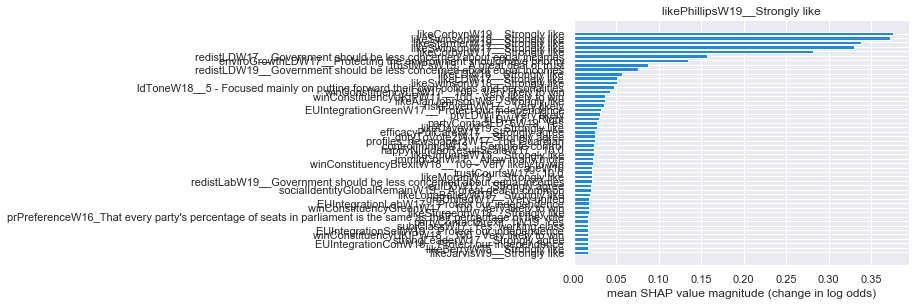

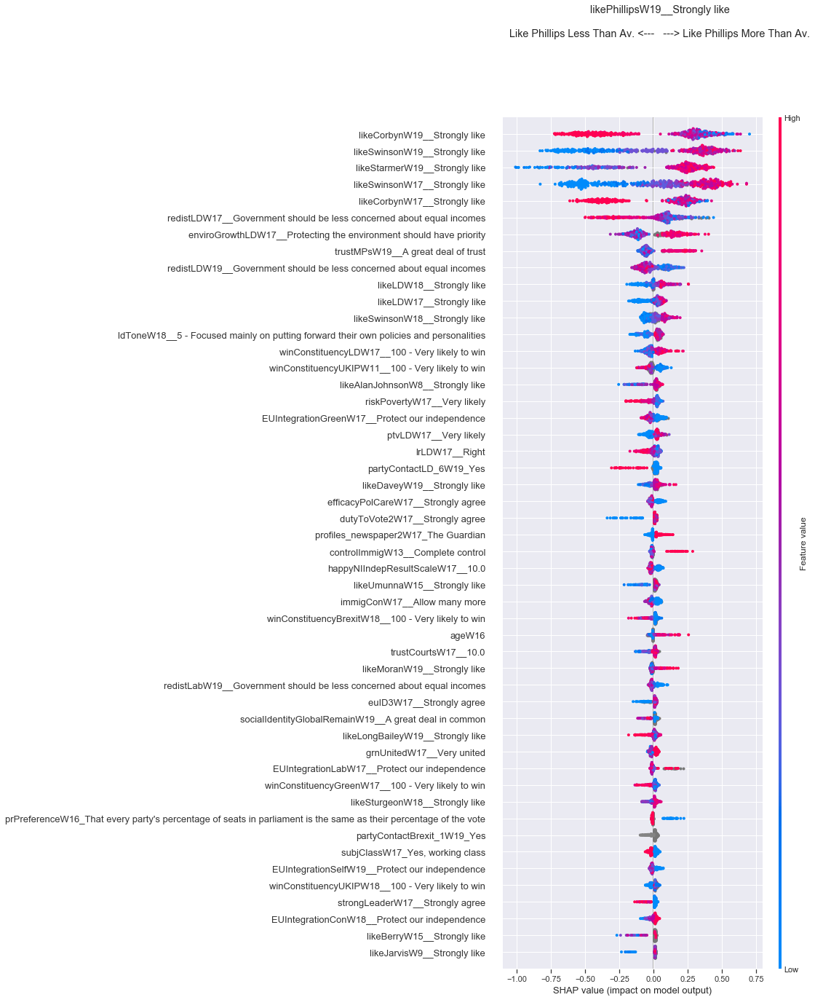

(<shap.explainers.tree.TreeExplainer at 0x2b62fbc8>,
 array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]], dtype=float32),
 Index(['turnoutUKGeneralW1__Very likely that I will vote',
        'turnoutUKGeneralW2__Very likely that I will vote',
        'turnoutUKGeneralW3__Very likely that I will vote',
        'turnoutUKGeneralW4__Very likely that I will vote',
        'turnoutUKGeneralW5__Very likely that I will vote',
        'turnoutUKGeneralW7__Very likely that I will vote',
        'turnoutUKGeneralW8__Very likely that I will vote',
        'turnoutUKGeneralW9__Very likely that I will vote',
        'turnoutUKGeneralW10__Very likely that I will vote',
        'turnoutUKGeneralW11__Very likely that I will vote',
        ...
        'conPriorities2_schoolW4_Yes', 'conPriorities2_nhsW4_Yes',
  

In [33]:
Treatment = "likePhillips2019LabMembers"
var_stub = "likePhillips"

var_list = ["likePhillipsW19__Strongly like"]
var_stub_list = [var_stub,]

mask = (BES_Panel["partyMemberNowW17"]=="Labour") & (BES_Panel["likePhillipsW19"].notnull())
df = BES_reduced_with_na[mask].copy()

colname = "likePhillipsW19__Strongly like"
# BES_cens = BES_cens_base[fertility_columns+age_columns+["leaveHanretty"]+["c11Degree"]]
xgboost_run(subdir=colname,min_features = min(BES_reduced_with_na.shape[1]-1,50),
           title = colname+"\n\nLike Phillips Less Than Av. <---   ---> Like Phillips More Than Av.")

[15:55:36] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:6.25023
Will train until validation_0-rmse hasn't improved in 14.3 rounds.
[1]	validation_0-rmse:6.09768
[2]	validation_0-rmse:5.94784
[3]	validation_0-rmse:5.79884
[4]	validation_0-rmse:5.65585
[5]	validation_0-rmse:5.51517
[6]	validation_0-rmse:5.39041
[7]	validation_0-rmse:5.25891
[8]	validation_0-rmse:5.12913
[9]	validation_0-rmse:5.00954
[10]	validation_0-rmse:4.9001
[11]	validation_0-rmse:4.78887
[12]	validation_0-rmse:4.67331
[13]	validation_0-rmse:4.56569
[14]	validation_0-rmse:4.46429
[15]	validation_0-rmse:4.36465
[16]	validation_0-rmse:4.27337
[17]	validation_0-rmse:4.1836
[18]	validation_0-rmse:4.09374
[19]	validation_0-rmse:4.01157
[20]	validation_0-rmse:3.93872
[21]	validation_0-rmse:3.86312
[22]	validation_0-rmse:3.78728
[23]	validation_0-rmse:3.71208
[24]	validation_0-rmse:3.63725
[25]	validation_0-rmse:3.57505
[26]	validation_0-rmse:

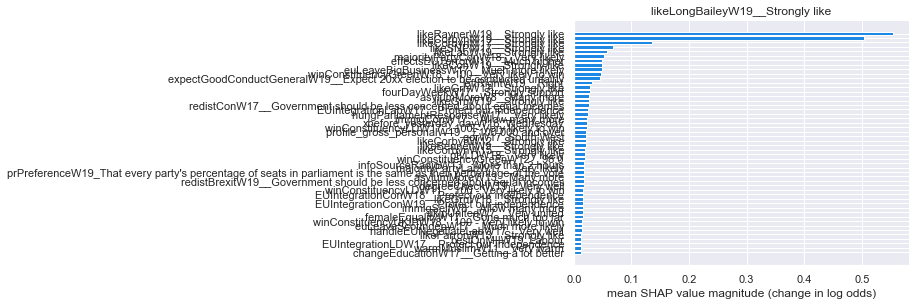

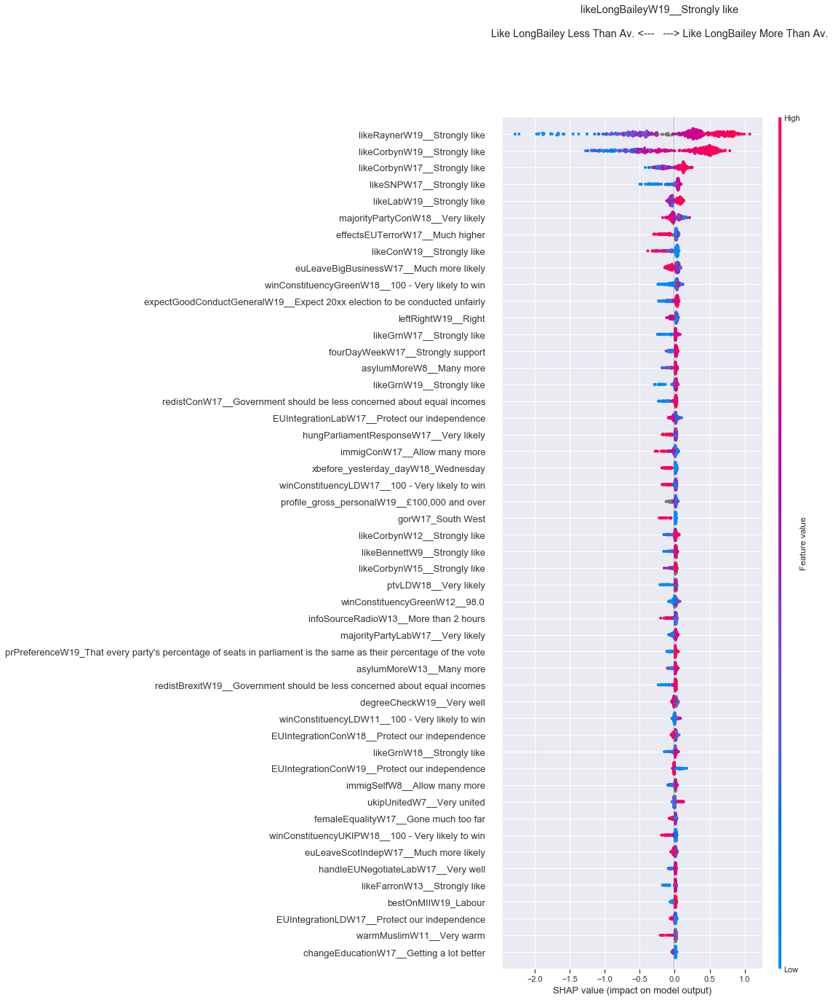

(<shap.explainers.tree.TreeExplainer at 0x63e66908>,
 array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]], dtype=float32),
 Index(['turnoutUKGeneralW1__Very likely that I will vote',
        'turnoutUKGeneralW2__Very likely that I will vote',
        'turnoutUKGeneralW3__Very likely that I will vote',
        'turnoutUKGeneralW4__Very likely that I will vote',
        'turnoutUKGeneralW5__Very likely that I will vote',
        'turnoutUKGeneralW7__Very likely that I will vote',
        'turnoutUKGeneralW8__Very likely that I will vote',
        'turnoutUKGeneralW9__Very likely that I will vote',
        'turnoutUKGeneralW10__Very likely that I will vote',
        'turnoutUKGeneralW11__Very likely that I will vote',
        ...
        'conPriorities2_schoolW4_Yes', 'conPriorities2_nhsW4_Yes',
  

In [34]:
Treatment = "likeLongBailey2019LabMembers"
var_stub = "likeLongBailey"

var_list = ["likeLongBaileyW19__Strongly like"]
var_stub_list = [var_stub,]

mask = (BES_Panel["partyMemberNowW17"]=="Labour") & (BES_Panel["likeLongBaileyW19"].notnull())
df = BES_reduced_with_na[mask].copy()

colname = "likeLongBaileyW19__Strongly like"
# BES_cens = BES_cens_base[fertility_columns+age_columns+["leaveHanretty"]+["c11Degree"]]
xgboost_run(subdir=colname,min_features = min(BES_reduced_with_na.shape[1]-1,50),
           title = colname+"\n\nLike LongBailey Less Than Av. <---   ---> Like LongBailey More Than Av.")

[16:00:39] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:6.5177
Will train until validation_0-rmse hasn't improved in 14.200000000000001 rounds.
[1]	validation_0-rmse:6.34305
[2]	validation_0-rmse:6.17145
[3]	validation_0-rmse:6.00717
[4]	validation_0-rmse:5.8488
[5]	validation_0-rmse:5.69706
[6]	validation_0-rmse:5.54688
[7]	validation_0-rmse:5.4027
[8]	validation_0-rmse:5.26492
[9]	validation_0-rmse:5.13112
[10]	validation_0-rmse:5.00073
[11]	validation_0-rmse:4.87677
[12]	validation_0-rmse:4.75786
[13]	validation_0-rmse:4.63999
[14]	validation_0-rmse:4.52752
[15]	validation_0-rmse:4.41797
[16]	validation_0-rmse:4.31383
[17]	validation_0-rmse:4.21125
[18]	validation_0-rmse:4.1147
[19]	validation_0-rmse:4.02106
[20]	validation_0-rmse:3.92923
[21]	validation_0-rmse:3.84103
[22]	validation_0-rmse:3.75639
[23]	validation_0-rmse:3.67429
[24]	validation_0-rmse:3.59506
[25]	validation_0-rmse:3.52037
[26]	valida

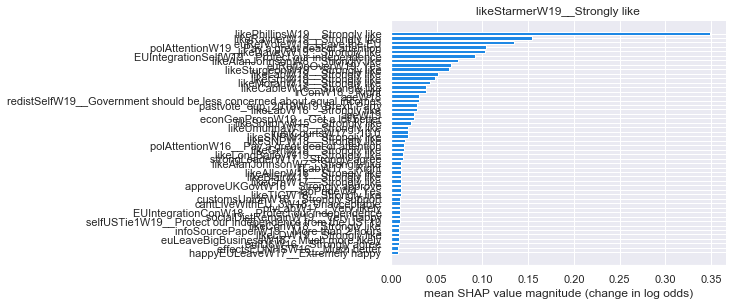

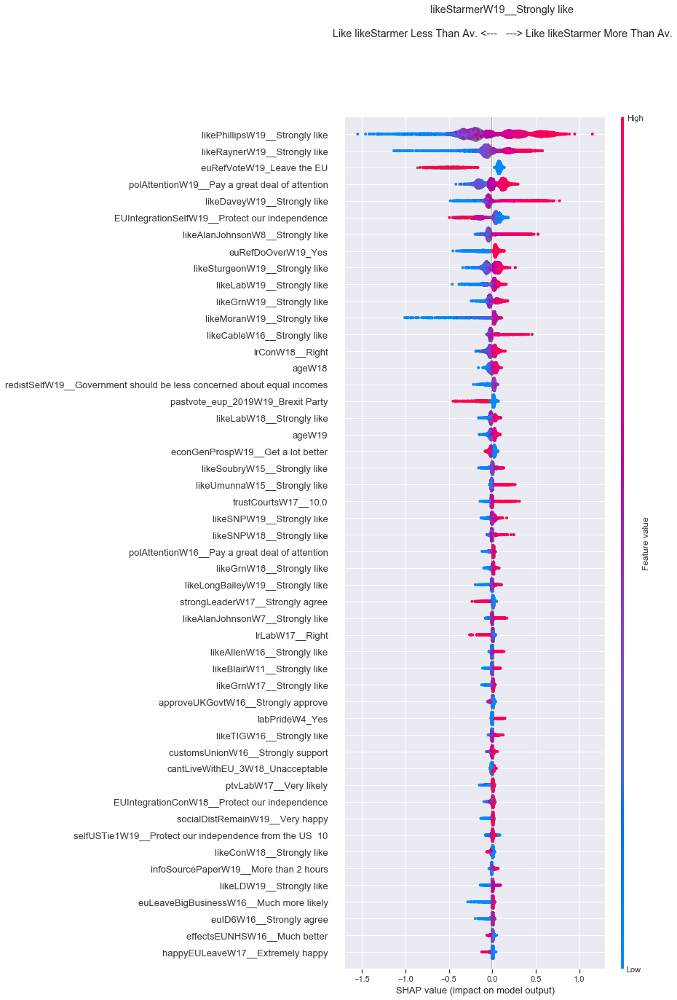

Wall time: 4min 30s


(<shap.explainers.tree.TreeExplainer at 0x63dfb288>,
 array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]], dtype=float32),
 Index(['turnoutUKGeneralW1__Very likely that I will vote',
        'turnoutUKGeneralW2__Very likely that I will vote',
        'turnoutUKGeneralW3__Very likely that I will vote',
        'turnoutUKGeneralW4__Very likely that I will vote',
        'turnoutUKGeneralW5__Very likely that I will vote',
        'turnoutUKGeneralW7__Very likely that I will vote',
        'turnoutUKGeneralW8__Very likely that I will vote',
        'turnoutUKGeneralW9__Very likely that I will vote',
        'turnoutUKGeneralW10__Very likely that I will vote',
        'turnoutUKGeneralW11__Very likely that I will vote',
        ...
        'conPriorities2_schoolW4_Yes', 'conPriorities2_nhsW4_Yes',
  

In [38]:
%%time
Treatment = "likeStarmer2019LabVoters"
var_stub = "likeStarmer"

var_list = ["likeStarmerW19__Strongly like"]
var_stub_list = [var_stub,]

mask = (BES_Panel["pastvote_ge_2019W19"]=="Labour") & (BES_Panel["likeStarmerW19"].notnull())
df = BES_reduced_with_na[mask].copy()

colname = "likeStarmerW19__Strongly like"
# BES_cens = BES_cens_base[fertility_columns+age_columns+["leaveHanretty"]+["c11Degree"]]
xgboost_run(subdir=colname,min_features = min(BES_reduced_with_na.shape[1]-1,50),
           title = colname+"\n\nLike likeStarmer Less Than Av. <---   ---> Like likeStarmer More Than Av.")

[16:11:08] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:2.9218
Will train until validation_0-rmse hasn't improved in 14.100000000000001 rounds.
[1]	validation_0-rmse:2.89945
[2]	validation_0-rmse:2.87738
[3]	validation_0-rmse:2.85547
[4]	validation_0-rmse:2.83452
[5]	validation_0-rmse:2.81435
[6]	validation_0-rmse:2.79608
[7]	validation_0-rmse:2.77739
[8]	validation_0-rmse:2.75939
[9]	validation_0-rmse:2.74231
[10]	validation_0-rmse:2.72851
[11]	validation_0-rmse:2.71397
[12]	validation_0-rmse:2.69996
[13]	validation_0-rmse:2.68538
[14]	validation_0-rmse:2.67475
[15]	validation_0-rmse:2.6642
[16]	validation_0-rmse:2.65298
[17]	validation_0-rmse:2.64124
[18]	validation_0-rmse:2.62973
[19]	validation_0-rmse:2.61922
[20]	validation_0-rmse:2.60839
[21]	validation_0-rmse:2.59953
[22]	validation_0-rmse:2.58939
[23]	validation_0-rmse:2.58138
[24]	validation_0-rmse:2.57284
[25]	validation_0-rmse:2.56499
[26]	vali

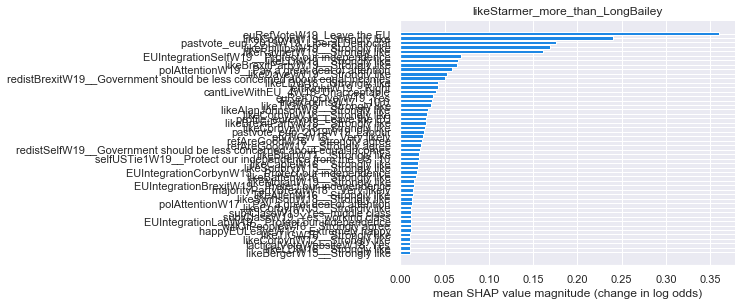

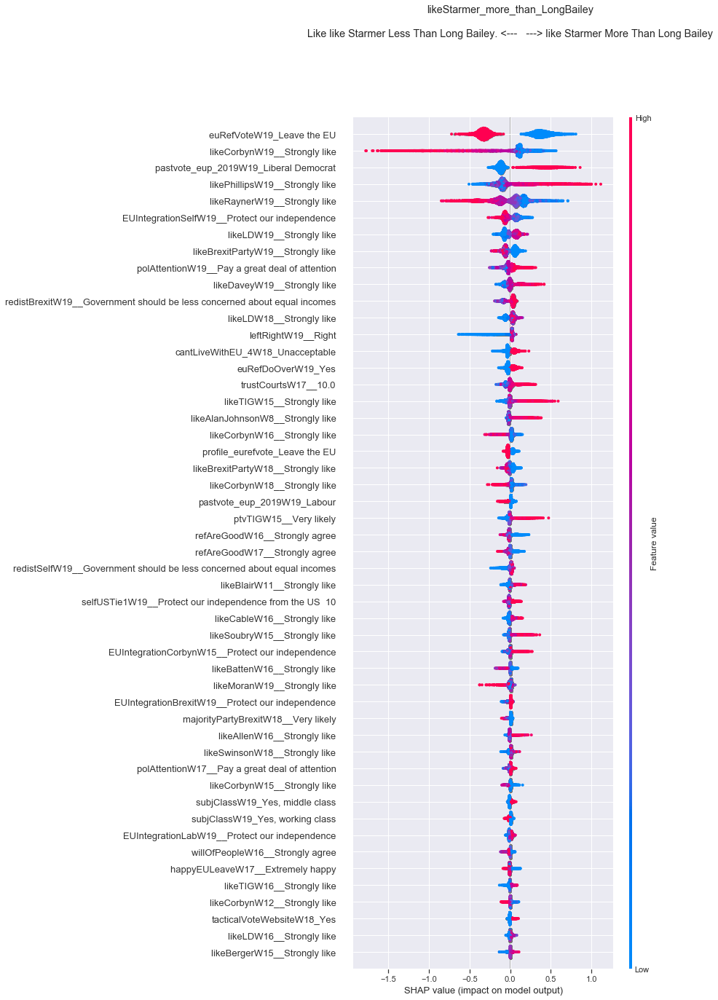

Wall time: 10min 51s


(<shap.explainers.tree.TreeExplainer at 0x3692c808>,
 array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]], dtype=float32),
 Index(['turnoutUKGeneralW1__Very likely that I will vote',
        'turnoutUKGeneralW2__Very likely that I will vote',
        'turnoutUKGeneralW3__Very likely that I will vote',
        'turnoutUKGeneralW4__Very likely that I will vote',
        'turnoutUKGeneralW5__Very likely that I will vote',
        'turnoutUKGeneralW7__Very likely that I will vote',
        'turnoutUKGeneralW8__Very likely that I will vote',
        'turnoutUKGeneralW9__Very likely that I will vote',
        'turnoutUKGeneralW10__Very likely that I will vote',
        'turnoutUKGeneralW11__Very likely that I will vote',
        ...
        'conPriorities2_schoolW4_Yes', 'conPriorities2_nhsW4_Yes',
  

In [40]:
%%time
Treatment = "likeStarmer_more_than_LongBailey"
var_stub = "likeStarmer_more_than_LongBailey"

var_list = ["likeStarmer_more_than_LongBailey"]
var_stub_list = [var_stub,"likeStarmer","likeLongBailey"]

mask = (BES_Panel["likeLongBaileyW19"].notnull()) & (BES_Panel["likeStarmerW19"].notnull())
df = BES_reduced_with_na[mask].copy()

df["likeStarmer_more_than_LongBailey"] = BES_reduced_with_na["likeStarmerW19__Strongly like"] -\
                                         BES_reduced_with_na["likeLongBaileyW19__Strongly like"]

colname = "likeStarmer_more_than_LongBailey"
# BES_cens = BES_cens_base[fertility_columns+age_columns+["leaveHanretty"]+["c11Degree"]]
xgboost_run(subdir=colname,min_features = min(BES_reduced_with_na.shape[1]-1,50),
           title = colname+"\n\nLike like Starmer Less Than Long Bailey. <---   ---> like Starmer More Than Long Bailey")

[16:32:16] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:2.84174
Will train until validation_0-rmse hasn't improved in 14.0 rounds.
[1]	validation_0-rmse:2.82874
[2]	validation_0-rmse:2.81563
[3]	validation_0-rmse:2.80238
[4]	validation_0-rmse:2.7911
[5]	validation_0-rmse:2.78117
[6]	validation_0-rmse:2.77211
[7]	validation_0-rmse:2.76335
[8]	validation_0-rmse:2.75259
[9]	validation_0-rmse:2.74477
[10]	validation_0-rmse:2.73683
[11]	validation_0-rmse:2.72981
[12]	validation_0-rmse:2.72211
[13]	validation_0-rmse:2.71502
[14]	validation_0-rmse:2.70839
[15]	validation_0-rmse:2.70241
[16]	validation_0-rmse:2.69725
[17]	validation_0-rmse:2.69066
[18]	validation_0-rmse:2.68498
[19]	validation_0-rmse:2.67985
[20]	validation_0-rmse:2.67594
[21]	validation_0-rmse:2.67141
[22]	validation_0-rmse:2.66601
[23]	validation_0-rmse:2.66144
[24]	validation_0-rmse:2.65713
[25]	validation_0-rmse:2.65326
[26]	validation_0-rmse

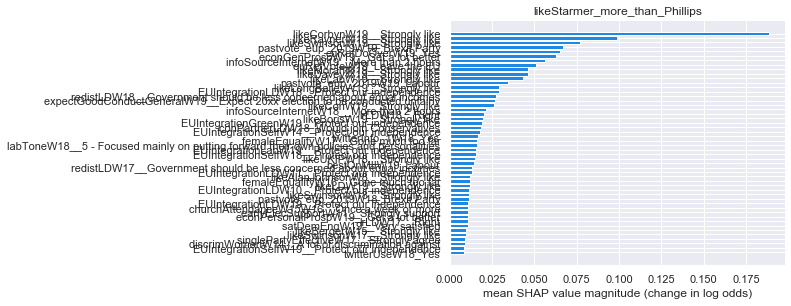

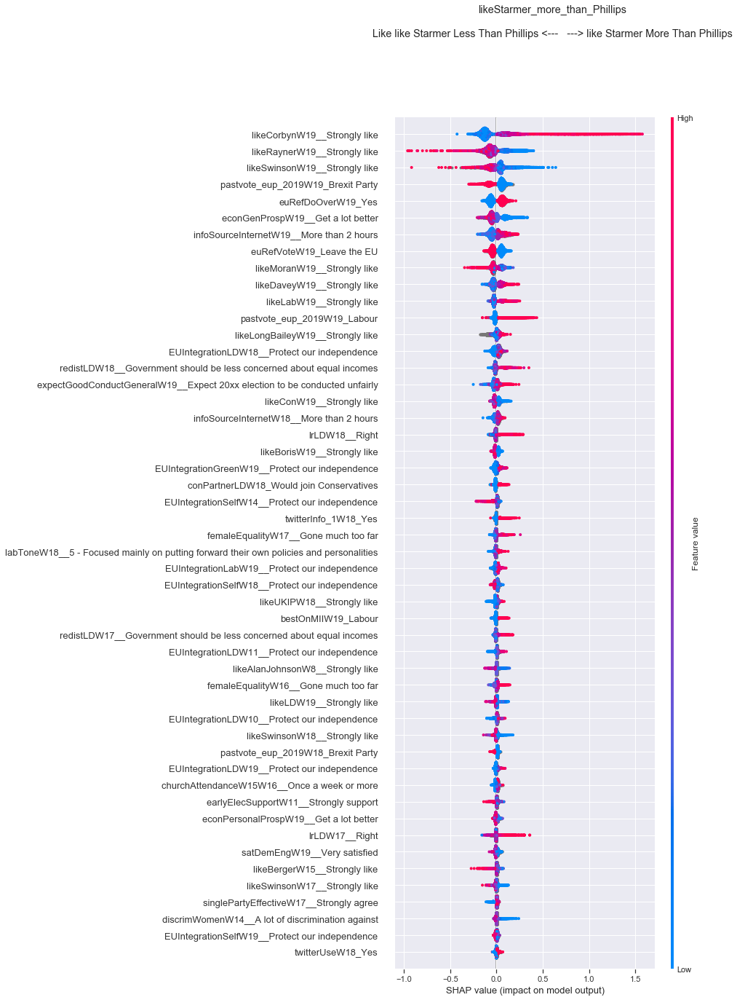

Wall time: 11min 17s


(<shap.explainers.tree.TreeExplainer at 0x3690c408>,
 array([[ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.00017852],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.00017852],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.00017852],
        ...,
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.00049695],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        , -0.00377053],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.00017852]], dtype=float32),
 Index(['turnoutUKGeneralW1__Very likely that I will vote',
        'turnoutUKGeneralW2__Very likely that I will vote',
        'turnoutUKGeneralW3__Very likely that I will vote',
        'turnoutUKGeneralW4__Very likely that I will vote',
        'turnoutUKGeneralW5__Very likely that I will vote',
     

In [41]:
%%time
Treatment = "likeStarmer_more_than_Phillips"
var_stub = "likeStarmer_more_than_Phillips"

var_list = ["likeStarmer_more_than_Phillips"]
var_stub_list = [var_stub,"likeStarmer","likePhillips"]

mask = (BES_Panel["likePhillipsW19"].notnull()) & (BES_Panel["likeStarmerW19"].notnull())
df = BES_reduced_with_na[mask].copy()

df["likeStarmer_more_than_Phillips"] = BES_reduced_with_na["likeStarmerW19__Strongly like"] -\
                                       BES_reduced_with_na["likePhillipsW19__Strongly like"]

colname = "likeStarmer_more_than_Phillips"
# BES_cens = BES_cens_base[fertility_columns+age_columns+["leaveHanretty"]+["c11Degree"]]
xgboost_run(subdir=colname,min_features = min(BES_reduced_with_na.shape[1]-1,50),
           title = colname+"\n\nLike like Starmer Less Than Phillips <---   ---> like Starmer More Than Phillips")

[16:43:18] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:3.71505
Will train until validation_0-rmse hasn't improved in 12.9 rounds.
[1]	validation_0-rmse:3.67296
[2]	validation_0-rmse:3.62925
[3]	validation_0-rmse:3.58974
[4]	validation_0-rmse:3.55191
[5]	validation_0-rmse:3.51863
[6]	validation_0-rmse:3.48166
[7]	validation_0-rmse:3.44486
[8]	validation_0-rmse:3.41174
[9]	validation_0-rmse:3.37902
[10]	validation_0-rmse:3.34844
[11]	validation_0-rmse:3.32047
[12]	validation_0-rmse:3.29116
[13]	validation_0-rmse:3.26745
[14]	validation_0-rmse:3.2435
[15]	validation_0-rmse:3.22097
[16]	validation_0-rmse:3.1951
[17]	validation_0-rmse:3.17248
[18]	validation_0-rmse:3.15248
[19]	validation_0-rmse:3.13091
[20]	validation_0-rmse:3.11151
[21]	validation_0-rmse:3.09322
[22]	validation_0-rmse:3.07639
[23]	validation_0-rmse:3.05718
[24]	validation_0-rmse:3.0401
[25]	validation_0-rmse:3.02518
[26]	validation_0-rmse:3

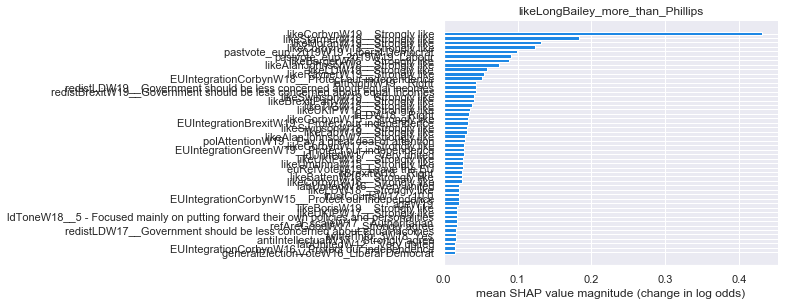

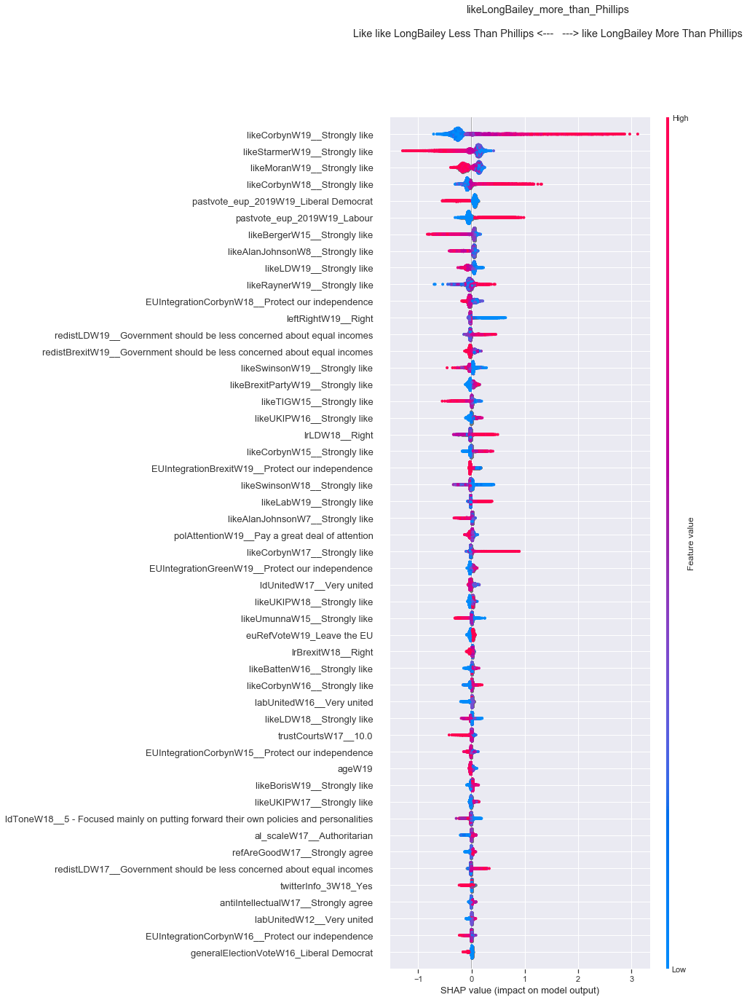

Wall time: 8min 38s


(<shap.explainers.tree.TreeExplainer at 0x63f04c88>,
 array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]], dtype=float32),
 Index(['turnoutUKGeneralW1__Very likely that I will vote',
        'turnoutUKGeneralW2__Very likely that I will vote',
        'turnoutUKGeneralW3__Very likely that I will vote',
        'turnoutUKGeneralW4__Very likely that I will vote',
        'turnoutUKGeneralW5__Very likely that I will vote',
        'turnoutUKGeneralW7__Very likely that I will vote',
        'turnoutUKGeneralW8__Very likely that I will vote',
        'turnoutUKGeneralW9__Very likely that I will vote',
        'turnoutUKGeneralW10__Very likely that I will vote',
        'turnoutUKGeneralW11__Very likely that I will vote',
        ...
        'conPriorities2_schoolW4_Yes', 'conPriorities2_nhsW4_Yes',
  

In [42]:
%%time
Treatment = "likeLongBailey_more_than_Phillips"
var_stub = "likeLongBailey_more_than_Phillips"

var_list = ["likeLongBailey_more_than_Phillips"]
var_stub_list = [var_stub,"likeLongBailey","likePhillips"]

mask = (BES_Panel["likePhillipsW19"].notnull()) & (BES_Panel["likeLongBaileyW19"].notnull())
df = BES_reduced_with_na[mask].copy()

df["likeLongBailey_more_than_Phillips"] = BES_reduced_with_na["likeLongBaileyW19__Strongly like"] -\
                                       BES_reduced_with_na["likePhillipsW19__Strongly like"]

colname = "likeLongBailey_more_than_Phillips"
# BES_cens = BES_cens_base[fertility_columns+age_columns+["leaveHanretty"]+["c11Degree"]]
xgboost_run(subdir=colname,min_features = min(BES_reduced_with_na.shape[1]-1,50),
           title = colname+"\n\nLike like LongBailey Less Than Phillips <---   ---> like LongBailey More Than Phillips")

[20:10:34] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:3.43361
Will train until validation_0-rmse hasn't improved in 12.4 rounds.
[1]	validation_0-rmse:3.39383
[2]	validation_0-rmse:3.35478
[3]	validation_0-rmse:3.31512
[4]	validation_0-rmse:3.28027
[5]	validation_0-rmse:3.2472
[6]	validation_0-rmse:3.21544
[7]	validation_0-rmse:3.18436
[8]	validation_0-rmse:3.15394
[9]	validation_0-rmse:3.12294
[10]	validation_0-rmse:3.09577
[11]	validation_0-rmse:3.06998
[12]	validation_0-rmse:3.04354
[13]	validation_0-rmse:3.01794
[14]	validation_0-rmse:2.99522
[15]	validation_0-rmse:2.971
[16]	validation_0-rmse:2.94848
[17]	validation_0-rmse:2.92618
[18]	validation_0-rmse:2.90477
[19]	validation_0-rmse:2.88461
[20]	validation_0-rmse:2.86404
[21]	validation_0-rmse:2.84589
[22]	validation_0-rmse:2.82823
[23]	validation_0-rmse:2.81177
[24]	validation_0-rmse:2.79606
[25]	validation_0-rmse:2.78081
[26]	validation_0-rmse:2

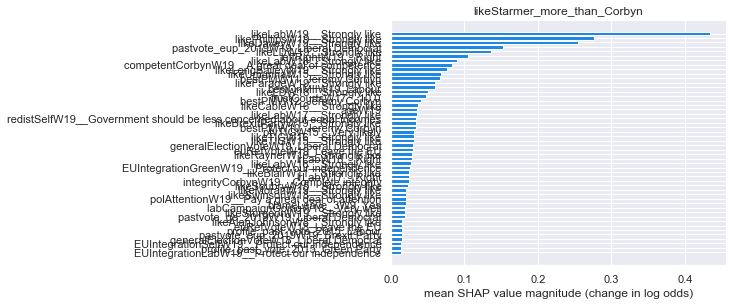

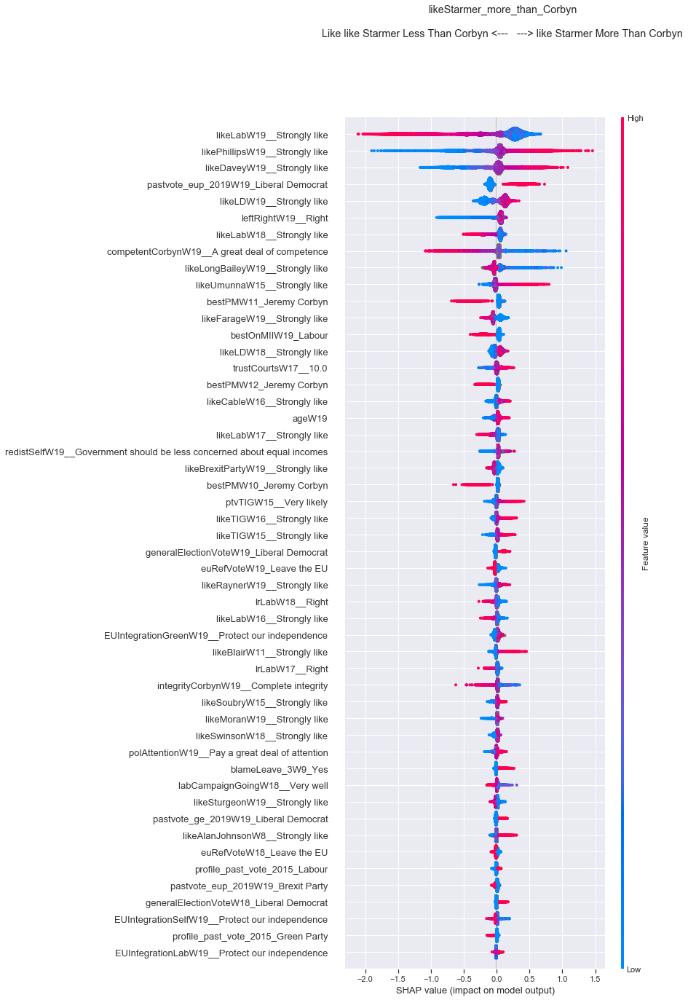

Wall time: 15min 55s


(<shap.explainers.tree.TreeExplainer at 0x20382988>,
 array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]], dtype=float32),
 Index(['turnoutUKGeneralW1__Very likely that I will vote',
        'turnoutUKGeneralW2__Very likely that I will vote',
        'turnoutUKGeneralW3__Very likely that I will vote',
        'turnoutUKGeneralW4__Very likely that I will vote',
        'turnoutUKGeneralW5__Very likely that I will vote',
        'turnoutUKGeneralW7__Very likely that I will vote',
        'turnoutUKGeneralW8__Very likely that I will vote',
        'turnoutUKGeneralW9__Very likely that I will vote',
        'turnoutUKGeneralW10__Very likely that I will vote',
        'turnoutUKGeneralW11__Very likely that I will vote',
        ...
        'conPriorities2_schoolW4_Yes', 'conPriorities2_nhsW4_Yes',
  

In [48]:
%%time

pol1 = "Starmer"
pol2 = "Corbyn"

Treatment = "like"+pol1+"_more_than_"+pol2
var_stub = "like"+pol1+"_more_than_"+pol2

var_list = ["like"+pol1+"_more_than_"+pol2]
var_stub_list = [var_stub,"like"+pol1,"like"+pol2]

mask = (BES_Panel["like"+pol2+"W19"].notnull()) & (BES_Panel["like"+pol1+"W19"].notnull())
df = BES_reduced_with_na[mask].copy()

df["like"+pol1+"_more_than_"+pol2] = BES_reduced_with_na["like"+pol1+"W19__Strongly like"] -\
                                       BES_reduced_with_na["like"+pol2+"W19__Strongly like"]

colname = "like"+pol1+"_more_than_"+pol2
# BES_cens = BES_cens_base[fertility_columns+age_columns+["leaveHanretty"]+["c11Degree"]]
xgboost_run(subdir=colname,min_features = min(BES_reduced_with_na.shape[1]-1,50),
           title = colname+"\n\nLike like "+pol1+" Less Than "+pol2+" <---   ---> like "+pol1+" More Than "+pol2)

[20:26:10] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:6.03213
Will train until validation_0-rmse hasn't improved in 12.3 rounds.
[1]	validation_0-rmse:5.88908
[2]	validation_0-rmse:5.74811
[3]	validation_0-rmse:5.61628
[4]	validation_0-rmse:5.48391
[5]	validation_0-rmse:5.35602
[6]	validation_0-rmse:5.23567
[7]	validation_0-rmse:5.11965
[8]	validation_0-rmse:5.00343
[9]	validation_0-rmse:4.89292
[10]	validation_0-rmse:4.78521
[11]	validation_0-rmse:4.68399
[12]	validation_0-rmse:4.58406
[13]	validation_0-rmse:4.49028
[14]	validation_0-rmse:4.39855
[15]	validation_0-rmse:4.31116
[16]	validation_0-rmse:4.22651
[17]	validation_0-rmse:4.14557
[18]	validation_0-rmse:4.06561
[19]	validation_0-rmse:3.98922
[20]	validation_0-rmse:3.91366
[21]	validation_0-rmse:3.84392
[22]	validation_0-rmse:3.7764
[23]	validation_0-rmse:3.70981
[24]	validation_0-rmse:3.6479
[25]	validation_0-rmse:3.58626
[26]	validation_0-rmse:

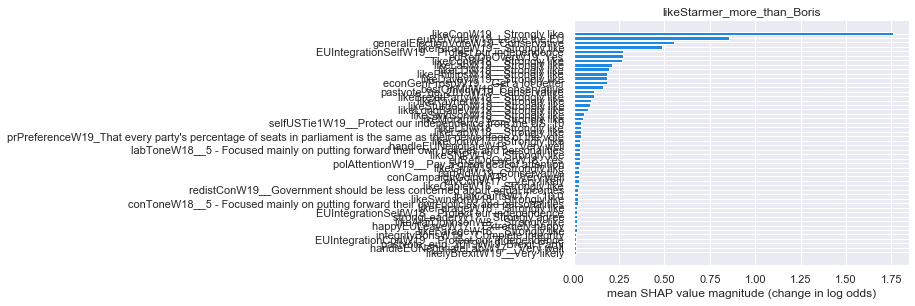

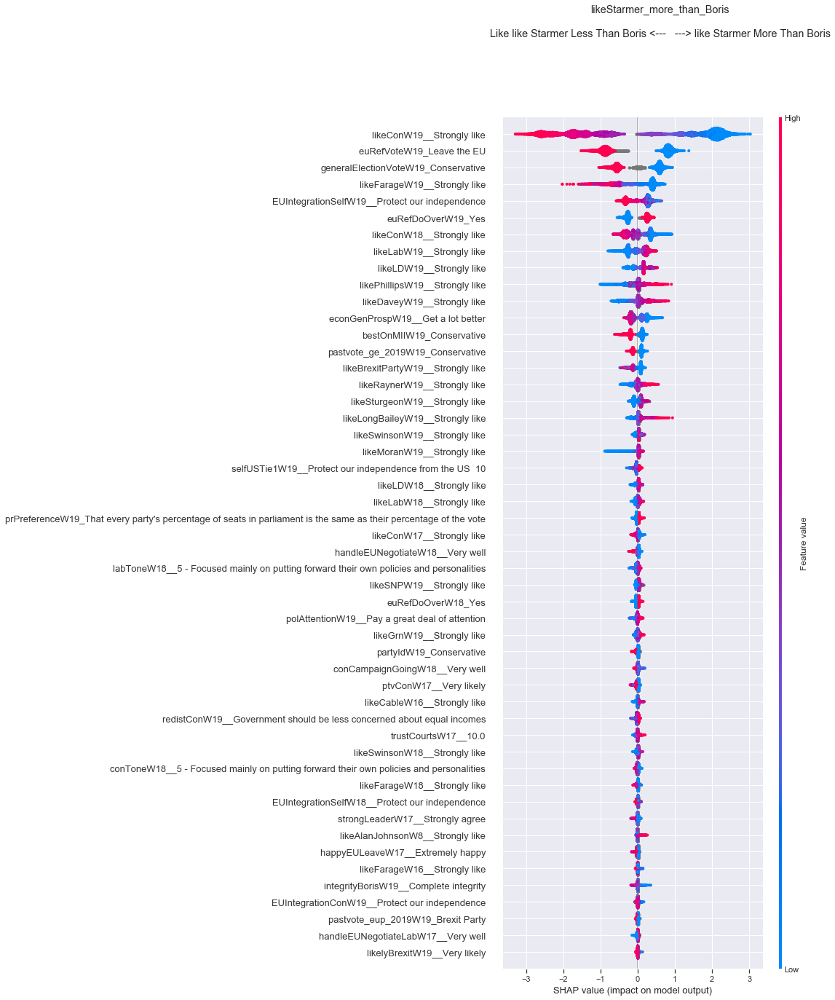

Wall time: 15min 41s


(<shap.explainers.tree.TreeExplainer at 0xbb28048>,
 array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]], dtype=float32),
 Index(['turnoutUKGeneralW1__Very likely that I will vote',
        'turnoutUKGeneralW2__Very likely that I will vote',
        'turnoutUKGeneralW3__Very likely that I will vote',
        'turnoutUKGeneralW4__Very likely that I will vote',
        'turnoutUKGeneralW5__Very likely that I will vote',
        'turnoutUKGeneralW7__Very likely that I will vote',
        'turnoutUKGeneralW8__Very likely that I will vote',
        'turnoutUKGeneralW9__Very likely that I will vote',
        'turnoutUKGeneralW10__Very likely that I will vote',
        'turnoutUKGeneralW11__Very likely that I will vote',
        ...
        'conPriorities2_schoolW4_Yes', 'conPriorities2_nhsW4_Yes',
   

In [49]:
%%time

pol1 = "Starmer"
pol2 = "Boris"

Treatment = "like"+pol1+"_more_than_"+pol2
var_stub = "like"+pol1+"_more_than_"+pol2

var_list = ["like"+pol1+"_more_than_"+pol2]
var_stub_list = [var_stub,"like"+pol1,"like"+pol2]

mask = (BES_Panel["like"+pol2+"W19"].notnull()) & (BES_Panel["like"+pol1+"W19"].notnull())
df = BES_reduced_with_na[mask].copy()

df["like"+pol1+"_more_than_"+pol2] = BES_reduced_with_na["like"+pol1+"W19__Strongly like"] -\
                                       BES_reduced_with_na["like"+pol2+"W19__Strongly like"]

colname = "like"+pol1+"_more_than_"+pol2
# BES_cens = BES_cens_base[fertility_columns+age_columns+["leaveHanretty"]+["c11Degree"]]
xgboost_run(subdir=colname,min_features = min(BES_reduced_with_na.shape[1]-1,50),
           title = colname+"\n\nLike like "+pol1+" Less Than "+pol2+" <---   ---> like "+pol1+" More Than "+pol2)

[21:24:09] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:3.23721
Will train until validation_0-rmse hasn't improved in 12.100000000000001 rounds.
[1]	validation_0-rmse:3.20376
[2]	validation_0-rmse:3.16777
[3]	validation_0-rmse:3.13323
[4]	validation_0-rmse:3.10541
[5]	validation_0-rmse:3.07641
[6]	validation_0-rmse:3.0463
[7]	validation_0-rmse:3.0209
[8]	validation_0-rmse:2.99305
[9]	validation_0-rmse:2.96753
[10]	validation_0-rmse:2.94252
[11]	validation_0-rmse:2.92008
[12]	validation_0-rmse:2.89996
[13]	validation_0-rmse:2.87697
[14]	validation_0-rmse:2.85916
[15]	validation_0-rmse:2.83876
[16]	validation_0-rmse:2.8198
[17]	validation_0-rmse:2.80399
[18]	validation_0-rmse:2.78611
[19]	validation_0-rmse:2.77202
[20]	validation_0-rmse:2.7561
[21]	validation_0-rmse:2.74329
[22]	validation_0-rmse:2.73101
[23]	validation_0-rmse:2.71664
[24]	validation_0-rmse:2.7057
[25]	validation_0-rmse:2.69252
[26]	validat

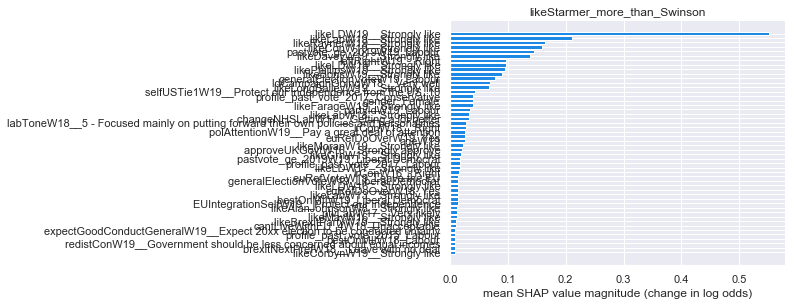

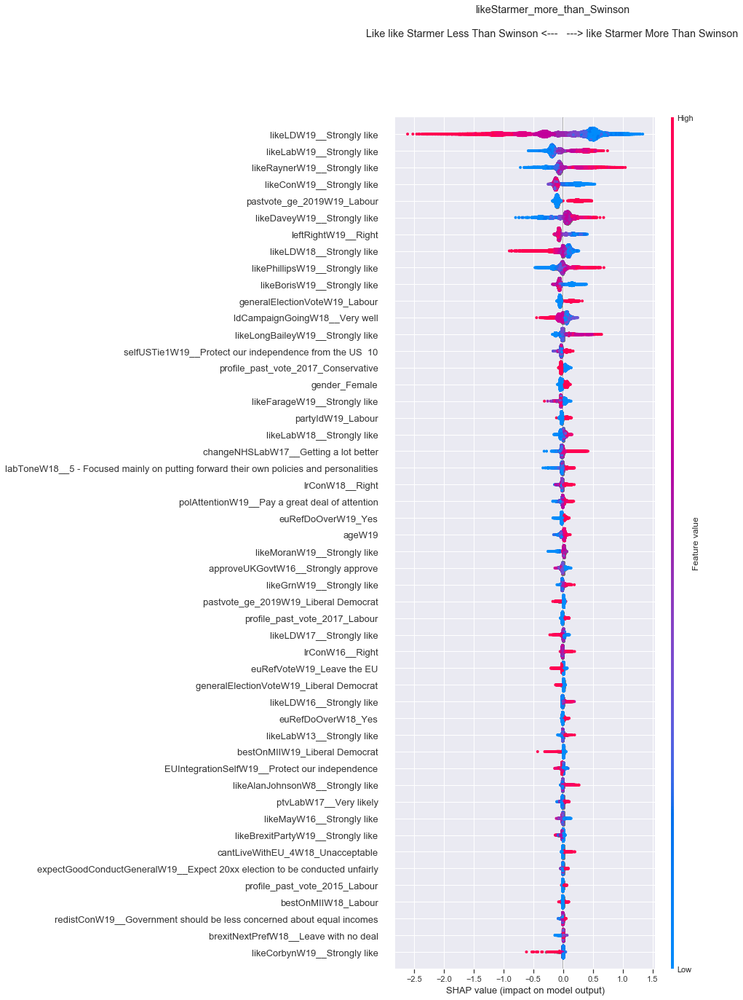

Wall time: 14min 39s


(<shap.explainers.tree.TreeExplainer at 0x29596b08>,
 array([[ 0.0000000e+00,  4.0245586e-04,  0.0000000e+00, ...,
          0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
        [ 0.0000000e+00,  6.6016940e-04,  0.0000000e+00, ...,
          0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
        [ 0.0000000e+00, -9.2725400e-05,  0.0000000e+00, ...,
          0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
        ...,
        [ 0.0000000e+00, -9.2725400e-05,  0.0000000e+00, ...,
          0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
        [ 0.0000000e+00, -9.2725400e-05,  0.0000000e+00, ...,
          0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
        [ 0.0000000e+00, -9.2725400e-05,  0.0000000e+00, ...,
          0.0000000e+00,  0.0000000e+00,  0.0000000e+00]], dtype=float32),
 Index(['turnoutUKGeneralW1__Very likely that I will vote',
        'turnoutUKGeneralW2__Very likely that I will vote',
        'turnoutUKGeneralW3__Very likely that I will vote',
        'turnoutU

In [51]:
%%time

pol1 = "Starmer"
pol2 = "Swinson"

Treatment = "like"+pol1+"_more_than_"+pol2
var_stub = "like"+pol1+"_more_than_"+pol2

var_list = ["like"+pol1+"_more_than_"+pol2]
var_stub_list = [var_stub,"like"+pol1,"like"+pol2]

mask = (BES_Panel["like"+pol2+"W19"].notnull()) & (BES_Panel["like"+pol1+"W19"].notnull())
df = BES_reduced_with_na[mask].copy()

df["like"+pol1+"_more_than_"+pol2] = BES_reduced_with_na["like"+pol1+"W19__Strongly like"] -\
                                       BES_reduced_with_na["like"+pol2+"W19__Strongly like"]

colname = "like"+pol1+"_more_than_"+pol2
# BES_cens = BES_cens_base[fertility_columns+age_columns+["leaveHanretty"]+["c11Degree"]]
xgboost_run(subdir=colname,min_features = min(BES_reduced_with_na.shape[1]-1,50),
           title = colname+"\n\nLike like "+pol1+" Less Than "+pol2+" <---   ---> like "+pol1+" More Than "+pol2)

[16:51:23] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:4.92677
Will train until validation_0-rmse hasn't improved in 12.8 rounds.
[1]	validation_0-rmse:4.8101
[2]	validation_0-rmse:4.69751
[3]	validation_0-rmse:4.58934
[4]	validation_0-rmse:4.4849
[5]	validation_0-rmse:4.38371
[6]	validation_0-rmse:4.28668
[7]	validation_0-rmse:4.19261
[8]	validation_0-rmse:4.10305
[9]	validation_0-rmse:4.01579
[10]	validation_0-rmse:3.93189
[11]	validation_0-rmse:3.85102
[12]	validation_0-rmse:3.77362
[13]	validation_0-rmse:3.69925
[14]	validation_0-rmse:3.62779
[15]	validation_0-rmse:3.55763
[16]	validation_0-rmse:3.49004
[17]	validation_0-rmse:3.42592
[18]	validation_0-rmse:3.3643
[19]	validation_0-rmse:3.3057
[20]	validation_0-rmse:3.24933
[21]	validation_0-rmse:3.19539
[22]	validation_0-rmse:3.14374
[23]	validation_0-rmse:3.09494
[24]	validation_0-rmse:3.04718
[25]	validation_0-rmse:3.0019
[26]	validation_0-rmse:2.9

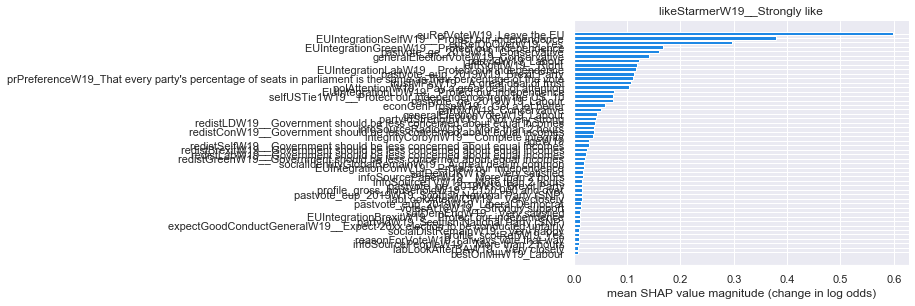

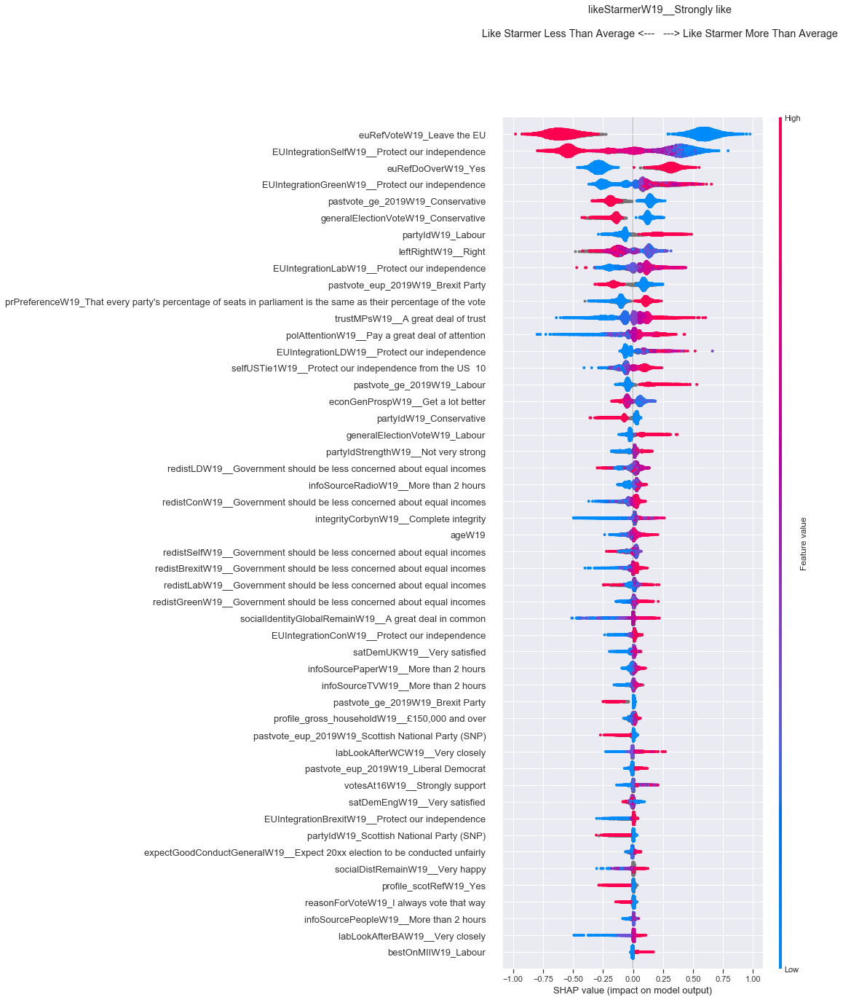

(<shap.explainers.tree.TreeExplainer at 0x6f96c1c8>,
 array([[ 2.2397470e-02,  9.7465870e-04,  3.7036838e-03, ...,
          1.3195809e-04,  7.8711228e-04, -1.2592931e-04],
        [-5.9360527e-02,  2.1770550e-03,  7.6825026e-04, ...,
          8.5840169e-05,  1.4218981e-04, -1.2592928e-04],
        [-1.3963006e-01, -6.3084000e-05,  3.7594026e-04, ...,
          7.0019130e-05,  1.0467118e-04, -1.2592931e-04],
        ...,
        [-5.7771705e-02,  6.5934332e-04,  7.5527671e-04, ...,
          5.3448442e-05,  1.2920324e-04, -4.2866173e-05],
        [ 2.9246248e-02, -3.0120229e-04,  7.4563536e-04, ...,
          7.5813674e-05,  7.2282113e-05, -1.2592931e-04],
        [ 1.1398370e-02,  1.8031416e-03,  1.6287279e-03, ...,
          6.6564229e-05,  2.0893272e-04, -1.2592928e-04]], dtype=float32),
 Index(['partyIdStrengthW19__Not very strong',
        'voteMethodaW19__Someone else voted for me (proxy voting)',
        'brexitNextPrefW19__Leave with no deal',
        'polAttentionW19__Pay a g

In [43]:
Treatment = "likeStarmer_W19only_nolikes"
var_stub = "likeStarmer"

var_list = ["likeStarmerW19__Strongly like"]
var_stub_list = [var_stub,"like"]

df = BES_reduced_with_na[search(BES_reduced_with_na,"W19").index].copy()

colname = "likeStarmerW19__Strongly like"
# BES_cens = BES_cens_base[fertility_columns+age_columns+["leaveHanretty"]+["c11Degree"]]
xgboost_run(subdir=colname,min_features = min(BES_reduced_with_na.shape[1]-1,50),
           title = colname+"\n\nLike Starmer Less Than Average <---   ---> Like Starmer More Than Average")

[20:47:18] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:0.492727
Will train until validation_0-rmse hasn't improved in 60.0 rounds.
[1]	validation_0-rmse:0.484953
[2]	validation_0-rmse:0.476863
[3]	validation_0-rmse:0.469543
[4]	validation_0-rmse:0.462379
[5]	validation_0-rmse:0.455373
[6]	validation_0-rmse:0.448286
[7]	validation_0-rmse:0.442696
[8]	validation_0-rmse:0.436694
[9]	validation_0-rmse:0.432329
[10]	validation_0-rmse:0.426597
[11]	validation_0-rmse:0.421353
[12]	validation_0-rmse:0.415991
[13]	validation_0-rmse:0.410828
[14]	validation_0-rmse:0.405908
[15]	validation_0-rmse:0.401286
[16]	validation_0-rmse:0.396779
[17]	validation_0-rmse:0.393612
[18]	validation_0-rmse:0.389115
[19]	validation_0-rmse:0.384811
[20]	validation_0-rmse:0.380707
[21]	validation_0-rmse:0.377394
[22]	validation_0-rmse:0.373703
[23]	validation_0-rmse:0.370284
[24]	validation_0-rmse:0.367437
[25]	validation_0-rmse:0.36

[247]	validation_0-rmse:0.298812
[248]	validation_0-rmse:0.298816
[249]	validation_0-rmse:0.2988
[250]	validation_0-rmse:0.298793
[251]	validation_0-rmse:0.298806
[252]	validation_0-rmse:0.298813
[253]	validation_0-rmse:0.298804
[254]	validation_0-rmse:0.29881
[255]	validation_0-rmse:0.298803
[256]	validation_0-rmse:0.298792
[257]	validation_0-rmse:0.29878
[258]	validation_0-rmse:0.298772
[259]	validation_0-rmse:0.298745
[260]	validation_0-rmse:0.298753
[261]	validation_0-rmse:0.298731
[262]	validation_0-rmse:0.298743
[263]	validation_0-rmse:0.298747
[264]	validation_0-rmse:0.298754
[265]	validation_0-rmse:0.29877
[266]	validation_0-rmse:0.298756
[267]	validation_0-rmse:0.298741
[268]	validation_0-rmse:0.298737
[269]	validation_0-rmse:0.298733
[270]	validation_0-rmse:0.298729
[271]	validation_0-rmse:0.298732
[272]	validation_0-rmse:0.298714
[273]	validation_0-rmse:0.298725
[274]	validation_0-rmse:0.298707
[275]	validation_0-rmse:0.298673
[276]	validation_0-rmse:0.29866
[277]	validation

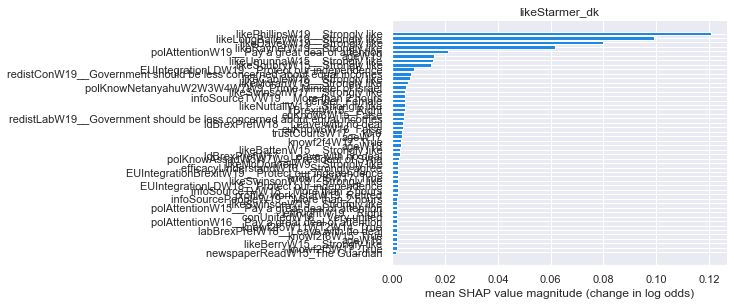

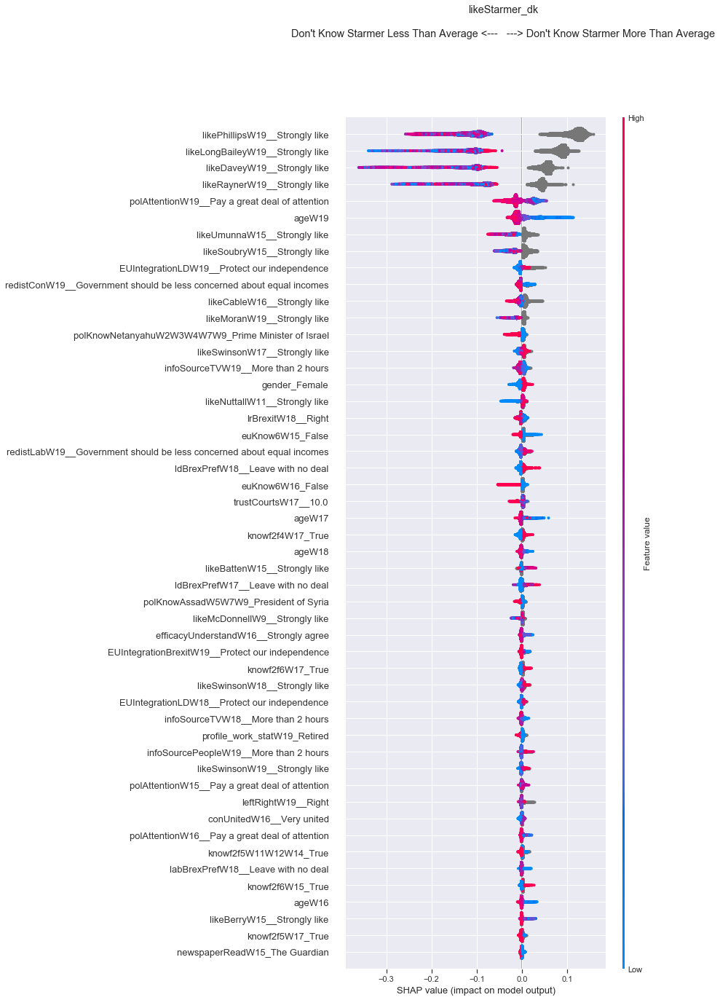

(<shap.explainers.tree.TreeExplainer at 0x41451e48>,
 array([[-6.0944546e-07,  1.8833722e-06,  0.0000000e+00, ...,
          0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
        [-2.5087838e-06,  1.2844675e-06,  0.0000000e+00, ...,
          0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
        [-4.5732583e-07,  1.8330599e-06,  0.0000000e+00, ...,
          0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
        ...,
        [-4.6973295e-07,  1.8833722e-06,  0.0000000e+00, ...,
          0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
        [-5.1405405e-06,  9.2289247e-06,  0.0000000e+00, ...,
          0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
        [-9.5643031e-07,  1.8833722e-06,  0.0000000e+00, ...,
          0.0000000e+00,  0.0000000e+00,  0.0000000e+00]], dtype=float32),
 Index(['turnoutUKGeneralW1__Very likely that I will vote',
        'turnoutUKGeneralW2__Very likely that I will vote',
        'turnoutUKGeneralW3__Very likely that I will vote',
        'turnoutU

In [4]:
%%time
Treatment = "likeStarmer_W19_dk"
var_stub = "likeStarmer"

var_list = ["likeStarmer_dk"]
var_stub_list = [var_stub]

df = BES_reduced_with_na.copy()
df["likeStarmer_dk"] = (BES_Panel["likeStarmerW19"]=="Don't know")
df["likeStarmer_dk"][BES_Panel["likeStarmerW19"].isnull()] = np.nan
df = df[df["likeStarmer_dk"].notnull()]

colname = "likeStarmer_dk"
# BES_cens = BES_cens_base[fertility_columns+age_columns+["leaveHanretty"]+["c11Degree"]]
xgboost_run(subdir=colname,min_features = min(BES_reduced_with_na.shape[1]-1,50),Treatment=Treatment,
           title = colname+"\n\nDon't Know Starmer Less Than Average <---   ---> Don't Know Starmer More Than Average")

[22:49:18] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:0.495148
Will train until validation_0-rmse hasn't improved in 31.6 rounds.
[1]	validation_0-rmse:0.490839
[2]	validation_0-rmse:0.486502
[3]	validation_0-rmse:0.482404
[4]	validation_0-rmse:0.478463
[5]	validation_0-rmse:0.474741
[6]	validation_0-rmse:0.47101
[7]	validation_0-rmse:0.467427
[8]	validation_0-rmse:0.464198
[9]	validation_0-rmse:0.461002
[10]	validation_0-rmse:0.457952
[11]	validation_0-rmse:0.455001
[12]	validation_0-rmse:0.452227
[13]	validation_0-rmse:0.449513
[14]	validation_0-rmse:0.446999
[15]	validation_0-rmse:0.444487
[16]	validation_0-rmse:0.442031
[17]	validation_0-rmse:0.439648
[18]	validation_0-rmse:0.437442
[19]	validation_0-rmse:0.435305
[20]	validation_0-rmse:0.433225
[21]	validation_0-rmse:0.431288
[22]	validation_0-rmse:0.42948
[23]	validation_0-rmse:0.427709
[24]	validation_0-rmse:0.425989
[25]	validation_0-rmse:0.4244

[247]	validation_0-rmse:0.374797
[248]	validation_0-rmse:0.374776
[249]	validation_0-rmse:0.37476
[250]	validation_0-rmse:0.374739
[251]	validation_0-rmse:0.374753
[252]	validation_0-rmse:0.374748
[253]	validation_0-rmse:0.374722
[254]	validation_0-rmse:0.374705
[255]	validation_0-rmse:0.374689
[256]	validation_0-rmse:0.374644
[257]	validation_0-rmse:0.374626
[258]	validation_0-rmse:0.374589
[259]	validation_0-rmse:0.374592
[260]	validation_0-rmse:0.374601
[261]	validation_0-rmse:0.374592
[262]	validation_0-rmse:0.374589
[263]	validation_0-rmse:0.374564
[264]	validation_0-rmse:0.374549
[265]	validation_0-rmse:0.37452
[266]	validation_0-rmse:0.374503
[267]	validation_0-rmse:0.374485
[268]	validation_0-rmse:0.374492
[269]	validation_0-rmse:0.374491
[270]	validation_0-rmse:0.374485
[271]	validation_0-rmse:0.374446
[272]	validation_0-rmse:0.374421
[273]	validation_0-rmse:0.374412
[274]	validation_0-rmse:0.37441
[275]	validation_0-rmse:0.37436
[276]	validation_0-rmse:0.374333
[277]	validati

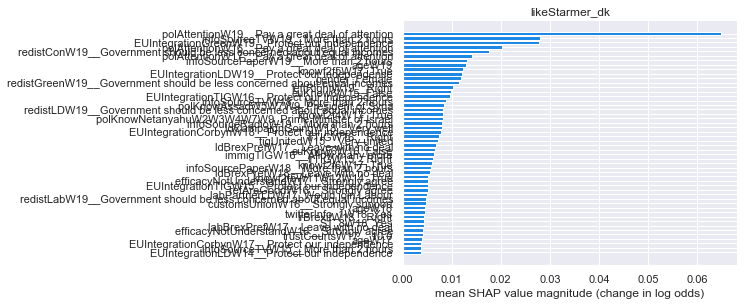

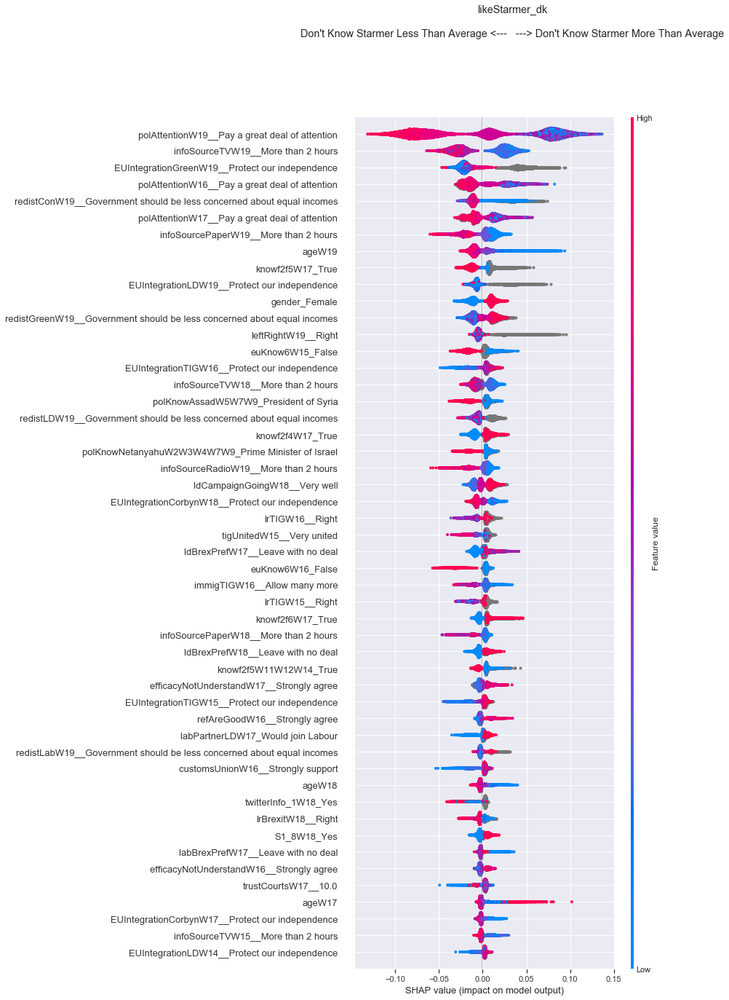

Wall time: 1h 4min 36s


(<shap.explainers.tree.TreeExplainer at 0x27743d08>,
 array([[-7.0725241e-06,  4.9449509e-06,  9.2369537e-06, ...,
          0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
        [ 6.6701941e-06, -2.8321365e-06,  5.1278794e-06, ...,
          0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
        [-5.0284198e-06,  4.9449509e-06,  2.2105218e-05, ...,
          0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
        ...,
        [-3.9402544e-06,  4.3472623e-06, -4.5013636e-05, ...,
          0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
        [-5.0284198e-06,  6.2411887e-06,  2.9412322e-06, ...,
          0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
        [-5.0284198e-06,  6.8770228e-06,  2.9412322e-06, ...,
          0.0000000e+00,  0.0000000e+00,  0.0000000e+00]], dtype=float32),
 Index(['generalElectionCertaintyW1__Completely certain',
        'generalElectionCertaintyW2__Completely certain',
        'generalElectionCertaintyW3__Completely certain',
        'generalElectio

In [5]:
%%time
Treatment = "likeStarmer_W19_dk_minus_like_vars"
var_stub = "likeStarmer"

var_list = ["likeStarmer_dk"]
var_stub_list = [var_stub,"like"]

df = BES_reduced_with_na.copy()
df["likeStarmer_dk"] = (BES_Panel["likeStarmerW19"]=="Don't know")
df["likeStarmer_dk"][BES_Panel["likeStarmerW19"].isnull()] = np.nan
df = df[df["likeStarmer_dk"].notnull()]

colname = "likeStarmer_dk"
# BES_cens = BES_cens_base[fertility_columns+age_columns+["leaveHanretty"]+["c11Degree"]]
xgboost_run(subdir=colname,min_features = min(BES_reduced_with_na.shape[1]-1,50),Treatment=Treatment,
           title = colname+"\n\nDon't Know Starmer Less Than Average <---   ---> Don't Know Starmer More Than Average")

[16:58:36] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:2.82904
Will train until validation_0-rmse hasn't improved in 60.0 rounds.
[1]	validation_0-rmse:2.80841
[2]	validation_0-rmse:2.78318
[3]	validation_0-rmse:2.75911
[4]	validation_0-rmse:2.73743
[5]	validation_0-rmse:2.71658
[6]	validation_0-rmse:2.69856
[7]	validation_0-rmse:2.68243
[8]	validation_0-rmse:2.66564
[9]	validation_0-rmse:2.6497
[10]	validation_0-rmse:2.63427
[11]	validation_0-rmse:2.61696
[12]	validation_0-rmse:2.60134
[13]	validation_0-rmse:2.5867
[14]	validation_0-rmse:2.57295
[15]	validation_0-rmse:2.55738
[16]	validation_0-rmse:2.54348
[17]	validation_0-rmse:2.52988
[18]	validation_0-rmse:2.51795
[19]	validation_0-rmse:2.50597
[20]	validation_0-rmse:2.4951
[21]	validation_0-rmse:2.48317
[22]	validation_0-rmse:2.47294
[23]	validation_0-rmse:2.46438
[24]	validation_0-rmse:2.45394
[25]	validation_0-rmse:2.44371
[26]	validation_0-rmse:2

[255]	validation_0-rmse:2.16311
[256]	validation_0-rmse:2.1631
[257]	validation_0-rmse:2.16306
[258]	validation_0-rmse:2.1631
[259]	validation_0-rmse:2.1629
[260]	validation_0-rmse:2.16259
[261]	validation_0-rmse:2.16259
[262]	validation_0-rmse:2.16234
[263]	validation_0-rmse:2.16248
[264]	validation_0-rmse:2.16222
[265]	validation_0-rmse:2.16188
[266]	validation_0-rmse:2.16169
[267]	validation_0-rmse:2.16158
[268]	validation_0-rmse:2.16182
[269]	validation_0-rmse:2.16199
[270]	validation_0-rmse:2.16189
[271]	validation_0-rmse:2.16159
[272]	validation_0-rmse:2.16164
[273]	validation_0-rmse:2.16144
[274]	validation_0-rmse:2.16158
[275]	validation_0-rmse:2.16127
[276]	validation_0-rmse:2.16146
[277]	validation_0-rmse:2.16127
[278]	validation_0-rmse:2.16123
[279]	validation_0-rmse:2.16135
[280]	validation_0-rmse:2.16136
[281]	validation_0-rmse:2.16136
[282]	validation_0-rmse:2.16141
[283]	validation_0-rmse:2.16143
[284]	validation_0-rmse:2.16153
[285]	validation_0-rmse:2.16145
[286]	valid

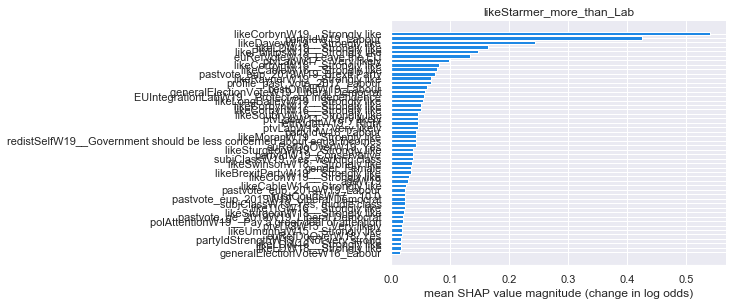

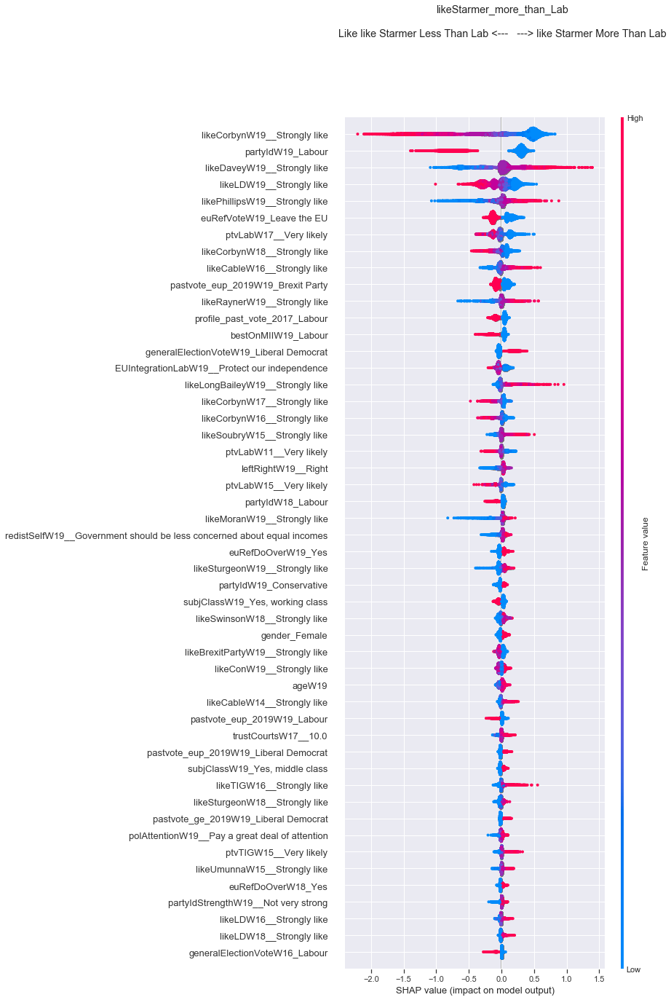

Wall time: 46min 51s


(<shap.explainers.tree.TreeExplainer at 0x308b3748>,
 array([[ 4.1947693e-05, -5.4280902e-04,  0.0000000e+00, ...,
          0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
        [-7.3703764e-06, -5.6055043e-05,  0.0000000e+00, ...,
          0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
        [-7.3703764e-06,  4.4844033e-05,  0.0000000e+00, ...,
          0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
        ...,
        [-9.5290989e-06,  4.4844033e-05,  0.0000000e+00, ...,
          0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
        [-1.6391459e-05,  1.5242338e-05,  0.0000000e+00, ...,
          0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
        [-9.5290989e-06,  1.5242338e-05,  0.0000000e+00, ...,
          0.0000000e+00,  0.0000000e+00,  0.0000000e+00]], dtype=float32),
 Index(['turnoutUKGeneralW1__Very likely that I will vote',
        'turnoutUKGeneralW2__Very likely that I will vote',
        'turnoutUKGeneralW3__Very likely that I will vote',
        'turnoutU

In [47]:
%%time
Treatment = "likeStarmer_vs_likeLab"
pol1 = "Starmer"
pol2 = "Lab"

Treatment = "like"+pol1+"_more_than_"+pol2
var_stub = "like"+pol1+"_more_than_"+pol2

var_list = ["like"+pol1+"_more_than_"+pol2]
var_stub_list = [var_stub,"like"+pol1,"like"+pol2]

mask = (BES_Panel["like"+pol2+"W19"].notnull()) & (BES_Panel["like"+pol1+"W19"].notnull())
df = BES_reduced_with_na[mask].copy()

df["like"+pol1+"_more_than_"+pol2] = BES_reduced_with_na["like"+pol1+"W19__Strongly like"] -\
                                       BES_reduced_with_na["like"+pol2+"W19__Strongly like"]

colname = "like"+pol1+"_more_than_"+pol2
# BES_cens = BES_cens_base[fertility_columns+age_columns+["leaveHanretty"]+["c11Degree"]]
xgboost_run(subdir=colname,min_features = min(BES_reduced_with_na.shape[1]-1,50),
           title = colname+"\n\nLike like "+pol1+" Less Than "+pol2+" <---   ---> like "+pol1+" More Than "+pol2)

In [484]:
df["likeStarmer_dk"].value_counts()

0.0    17424
1.0    14753
Name: likeStarmer_dk, dtype: int64

In [95]:
match(BES_Panel,"ns")

ns_secW16W17W18              38586
ns_sec_analyticW16W17W18     38586
ns_secW19                    26107
ns_sec_analyticW19           26107
ns_secW1W2W3W4W5             26183
ns_sec_analyticW1W2W3W4W5    26391
ns_secW6W7W8W9               40099
ns_sec_analyticW6W7W8W9      40099
dtype: int64

In [104]:
BES_reduced_with_na[match(BES_reduced_with_na,"ns_secW19").index].astype('float32').corrwith(BES_reduced_with_na["likeStarmerW19__Strongly like"].astype('float32')).sort_values()

ns_secW19_L11.1 Lower technical craft occupations                                       -0.055558
ns_secW19_L8.1 Employers in small establishments in industry, commerce, services etc.   -0.047043
ns_secW19_L13.3 Routine technical occupations                                           -0.044312
ns_secW19_Lower supervisory occupations                                                 -0.042283
ns_secW19_L12.3 Semi-routine technical occupations                                      -0.031674
ns_secW19_Lower managerial and administrative occupations                               -0.030899
ns_secW19_L13.4 Routine operative occupations                                           -0.029687
ns_secW19_Higher managerial and administrative occupations                              -0.025376
ns_secW19_Higher supervisory occupations                                                -0.024018
ns_secW19_L9.1 Own account workers (non-professional)                                   -0.020447
ns_secW19_L12.2 Semi

In [27]:
search(BES_Panel,"profile_work_stat")

profile_work_statW7        30895
profile_work_statW11       30956
profile_work_statW12       34394
profile_work_statW13       31136
profile_work_statW14       31063
profile_work_statW17       34363
profile_work_statW18       37825
profile_work_statW19       32177
profile_work_statW1_W10     9962
dtype: int64

In [31]:
BES_Panel["profile_work_statW14"].value_counts()

Working full time (30 or more hours per week)    11174
Retired                                           9688
Working part time (8-29 hours a week)             4108
Not working                                       2641
Full time student                                 1119
Unemployed                                         901
Other                                              850
Working part time (Less than 8 hours a week)       582
Name: profile_work_statW14, dtype: int64

In [29]:
BES_Panel["profile_work_statW17"].value_counts()

## bug!

Conservative                                13089
Plaid Cymru                                 10396
Labour                                       4554
Green Party                                  2737
United Kingdom Independence Party (UKIP)     1102
Scottish National Party (SNP)                 990
British National Party (BNP)                  877
Liberal Democrat                              618
Name: profile_work_statW17, dtype: int64

In [32]:
BES_Panel["profile_work_statW19"].value_counts()

Retired                                          11663
Working full time (30 or more hours per week)    10977
Working part time (8-29 hours a week)             4110
Not working                                       2487
Unemployed                                         840
Other                                              789
Full time student                                  710
Working part time (Less than 8 hours a week)       601
Name: profile_work_statW19, dtype: int64

In [111]:
np.unique([re.sub("(W\d+)+","",x.replace("like","")) for x in list(match(BES_Panel, "like[A-Z]").index)])

array(['AlanJohnson', 'Allen', 'BNP', 'Bartley', 'Batten', 'Bennett',
       'Berger', 'Berry', 'Blair', 'Boris', 'BrexitParty', 'Cable',
       'Cameron', 'CandA', 'CandB', 'Clegg', 'Con', 'Corbyn', 'DUP',
       'Davey', 'Davidson', 'Davis', 'Farage', 'Farron', 'Gove', 'Grn',
       'Harvie', 'Hunt', 'Jarvis', 'Javid', 'LD', 'Lab', 'Leonard',
       'LongBailey', 'Lucas', 'May', 'McDonnell', 'Miliband', 'Mogg',
       'Moran', 'Nuttall', 'Osborne', 'PC', 'Phillips', 'Price', 'Rayner',
       'Rennie', 'Rudd', 'SEvans', 'SNP', 'SNPExtra', 'Salmond', 'Soubry',
       'Starmer', 'Sturgeon', 'Swinson', 'TIG', 'UKIP', 'Umunna',
       'Watson', 'Wood'], dtype='<U11')

In [112]:
pol_gender_dict = {}
pol_gender_dict["AlanJohnson"] = "M"
pol_gender_dict["Allen"] = "F"
pol_gender_dict["Bartley"] = "M"
pol_gender_dict["Batten"] = "M"
pol_gender_dict["Bennett"] = "F"
pol_gender_dict["Berger"] = "F"
pol_gender_dict["Berry"] = "F"
pol_gender_dict["Blair"] = "M"
pol_gender_dict["Boris"] = "M"
pol_gender_dict["Cable"] = "M"
pol_gender_dict["Cameron"] = "M"
pol_gender_dict["Clegg"] = "M"
pol_gender_dict["Corbyn"] = "M"
pol_gender_dict["Davey"] = "M"
pol_gender_dict["Davidson"] = "F"
pol_gender_dict["Davis"] = "M"
pol_gender_dict["Farage"] = "M"
pol_gender_dict["Farron"] = "M"
pol_gender_dict["Gove"] = "M"
pol_gender_dict["Harvie"] = "M"
pol_gender_dict["Hunt"] = "M"
pol_gender_dict["Jarvis"] = "M"
pol_gender_dict["Javid"] = "M"
pol_gender_dict["Leonard"] = "M"
pol_gender_dict["LongBailey"] = "F"
pol_gender_dict["Lucas"] = "F"
pol_gender_dict["May"] = "F"
pol_gender_dict["McDonnell"] = "M"
pol_gender_dict["Miliband"] = "M"
pol_gender_dict["Mogg"] = "M"
pol_gender_dict["Moran"] = "F"
pol_gender_dict["Nuttall"] = "M"
pol_gender_dict["Osborne"] = "M"
pol_gender_dict["Phillips"] = "F"
pol_gender_dict["Price"] = "M"
pol_gender_dict["Rayner"] = "F"
pol_gender_dict["Rennie"] = "M"
pol_gender_dict["Rudd"] = "F"
pol_gender_dict["SEvans"] = "F"
pol_gender_dict["Salmond"] = "M"
pol_gender_dict["Soubry"] = "F"
pol_gender_dict["Starmer"] = "M"
pol_gender_dict["Sturgeon"] = "F"
pol_gender_dict["Swinson"] = "F"
pol_gender_dict["Umunna"] = "M"
pol_gender_dict["Watson"] = "M"
pol_gender_dict["Wood"] = "F"



In [115]:
pol_gender_dict

{'AlanJohnson': 'M',
 'Allen': 'F',
 'Bartley': 'M',
 'Batten': 'M',
 'Bennett': 'F',
 'Berger': 'F',
 'Berry': 'F',
 'Blair': 'M',
 'Boris': 'M',
 'Cable': 'M',
 'Cameron': 'M',
 'Clegg': 'M',
 'Corbyn': 'M',
 'Davey': 'M',
 'Davidson': 'F',
 'Davis': 'M',
 'Farage': 'M',
 'Farron': 'M',
 'Gove': 'M',
 'Harvie': 'M',
 'Hunt': 'M',
 'Jarvis': 'M',
 'Javid': 'M',
 'Leonard': 'M',
 'LongBailey': 'F',
 'Lucas': 'F',
 'May': 'F',
 'McDonnell': 'M',
 'Miliband': 'M',
 'Mogg': 'M',
 'Moran': 'F',
 'Nuttall': 'M',
 'Osborne': 'M',
 'Phillips': 'F',
 'Price': 'M',
 'Rayner': 'F',
 'Rennie': 'M',
 'Rudd': 'F',
 'SEvans': 'F',
 'Salmond': 'M',
 'Soubry': 'F',
 'Starmer': 'M',
 'Sturgeon': 'F',
 'Swinson': 'F',
 'Umunna': 'M',
 'Watson': 'M',
 'Wood': 'F'}

In [157]:
gender_ser = pd.Series(pol_gender_dict)

In [158]:
likePol = BES_reduced_with_na[ match(BES_reduced_with_na,"|".join(["like"+x for x in gender_ser.index])).index ].mean(axis=1)
likeMalePol = BES_reduced_with_na[ match(BES_reduced_with_na,"|".join(["like"+x for x in gender_ser[gender_ser=="M"].index])).index ].mean(axis=1)
likeFemalePol = BES_reduced_with_na[ match(BES_reduced_with_na,"|".join(["like"+x for x in gender_ser[gender_ser=="F"].index])).index ].mean(axis=1)

In [128]:
BES_reduced_with_na["likePol"] = likePol
BES_reduced_with_na["likeMalePol"] = likeMalePol
BES_reduced_with_na["likeFemalePol"] = likeFemalePol

In [ ]:
likeNonStarmerCorbynMalePol = BES_reduced_with_na[ match(BES_reduced_with_na,"|".join( ["like"+x for x in df[df=="M"].index if x not in ["Starmer","Corbyn"]] ) ).index ].mean(axis=1)
BES_reduced_with_na["likeNonStarmerCorbynMalePol"] = likeNonStarmerCorbynMalePol

likeNonPhillipsFemalePol = BES_reduced_with_na[ match(BES_reduced_with_na,"|".join( ["like"+x for x in df[df=="F"].index if x not in ["Phillips"]] ) ).index ].mean(axis=1)
BES_reduced_with_na["likeNonPhillipsFemalePol"] = likeNonPhillipsFemalePol


In [136]:
BES_reduced_with_na["likePol"].notnull().sum()

94743

In [140]:
corr_likePol = BES_reduced_with_na.astype('float32').corrwith(BES_reduced_with_na["likePol"].astype('float32'))
corr_likeMalePol = BES_reduced_with_na.astype('float32').corrwith(BES_reduced_with_na["likeMalePol"].astype('float32'))
corr_likeFemalePol = BES_reduced_with_na.astype('float32').corrwith(BES_reduced_with_na["likeFemalePol"].astype('float32'))

In [144]:
corr_likePol.dropna().sort_values().head(50)

copelandSecondChoiceW16_Steve Gibbons (Labour)             -0.545451
middlesbroughSecondChoiceW16_Andy Preston (Independent)    -0.451106
mansfieldSecondChoiceW16_Andy Abrahams (Labour)            -0.398308
reasonNotRegistered_5W4_Yes                                -0.324518
partyContactOther_4W17_Yes                                 -0.321692
partyContactOther_7W17_Yes                                 -0.319870
reasonNotRegistered_5W6_Yes                                -0.305197
registeredSupporterNowW16_Brexit Party                     -0.290131
partyContactOther_5W8_Yes                                  -0.281232
ldAngryW4_Yes                                              -0.278825
partyContactPC_1W3_Yes                                     -0.277750
efficacyPolCareW1__Strongly agree                          -0.270177
efficacyPolCareW3__Strongly agree                          -0.267021
conAngryW4_Yes                                             -0.265942
efficacyPolCareW2__Strongly agree 

In [145]:
corr_likePol.dropna().sort_values().tail(50)

likeLDW3__Strongly like                                   0.471594
likeWoodW4__Strongly like                                 0.473257
copelandSecondChoiceW16_Chris Whiteside (Conservative)    0.475949
likeBerryW18__Strongly like                               0.476913
competentWoodW13__A great deal of competence              0.478778
likeWoodW7__Strongly like                                 0.480546
likeWoodW10__Strongly like                                0.480875
likeCameronW7__Strongly like                              0.484732
likeWoodW3__Strongly like                                 0.484799
likeWoodW12__Strongly like                                0.485618
likeLDW1__Strongly like                                   0.486561
likeWoodW11__Strongly like                                0.486776
likeWoodW13__Strongly like                                0.487154
likeOsborneW8__Strongly like                              0.488232
likeCameronW3__Strongly like                              0.49

In [146]:
corr_likeMalePol.dropna().sort_values().head(50)

copelandSecondChoiceW16_Steve Gibbons (Labour)            -0.576875
whichPartySignedW4_Scottish National Party (SNP)          -0.481830
whichPartySignedW5_Scottish National Party (SNP)          -0.480956
partyMemberNowW6_Scottish National Party (SNP)            -0.426148
whichPartiesHelped_4W6_Yes                                -0.407695
middlesbroughSecondChoiceW16_Andy Preston (Independent)   -0.404346
partySiteSNPW4_Yes                                        -0.399151
partySiteSNPW5_Yes                                        -0.387012
partyMemberNowW8_Scottish National Party (SNP)            -0.385844
scotIndepEconomyW3__Very likely                           -0.384977
bestPMW7_Jeremy Corbyn                                    -0.379804
mansfieldSecondChoiceW16_Andy Abrahams (Labour)           -0.379446
partyContactOther_7W17_Yes                                -0.377672
scotReferendumIntentionW6_Will vote 'Yes'                 -0.376236
partyMemberNowW11_Scottish National Party (SNP) 

In [147]:
corr_likeMalePol.dropna().sort_values().tail(50)

likeConW7__Strongly like                                  0.514151
likeCleggW5__Strongly like                                0.515647
likeBattenW14__Strongly like                              0.516039
likeOsborneW8__Strongly like                              0.517700
likeFarageW4__Strongly like                               0.518908
likeBorisW18__Strongly like                               0.519594
likeConW2__Strongly like                                  0.521313
likeBrexitPartyW18__Strongly like                         0.521819
likeHuntW14__Strongly like                                0.522169
likeFarageW1__Strongly like                               0.523183
likeGoveW9__Strongly like                                 0.524552
likeFarageW5__Strongly like                               0.525199
likeFarageW16__Strongly like                              0.525782
likeBrexitPartyW17__Strongly like                         0.526040
likeFarageW6__Strongly like                               0.52

In [150]:
likeMalePol.corr(likeFemalePol)

0.12178869460512844

In [148]:
corr_likeFemalePol.dropna().sort_values().head(50)

scotRefIDW11_The No side                                  -0.650293
scotRefIDW10_The No side                                  -0.649570
manipCheck3W2__Definitely be worse better off             -0.642846
happyScotIndepResultNoW2__Extremely happy                 -0.637929
scotRefIDW17_The No side                                  -0.619321
scotIndepEconomyW2__Very likely                           -0.611149
scotIndepMeBetterOffW3__Very likely                       -0.609307
scotIndepEconomyW1__Very likely                           -0.598426
devoResponsibleScotTaxW6_The UK Parliament                -0.580222
registeredSupporterNowW16_Brexit Party                    -0.576045
snpAngryW4_Yes                                            -0.572322
scotRefIDW15_The No side                                  -0.571883
scotIndepInequalityW3__Fairly likely                      -0.571564
registeredSupporterNowW17_Brexit Party                    -0.567235
scotIndepEconomyW11__Very likely                

In [149]:
corr_likeFemalePol.dropna().sort_values().tail(50)

likeSturgeonW17__Strongly like                      0.727600
likeSNPW14__Strongly like                           0.730466
ptvSNPW11__Very likely                              0.730769
likeSNPW3__Strongly like                            0.731839
ptvSNPW10__Very likely                              0.734165
ptvSNPW4__Very likely                               0.734499
ptvSNPW13__Very likely                              0.738394
ptvSNPW18__Very likely                              0.745734
ptvSNPW12__Very likely                              0.745955
approveScotGovtW9__Strongly approve                 0.746129
likeBerryW17__Strongly like                         0.748396
ptvSNPW6__Very likely                               0.749598
likeWoodW2__Strongly like                           0.750668
ptvSNPW5__Very likely                               0.752624
competentWoodW10__A great deal of competence        0.753689
ptvSNPW7__Very likely                               0.754925
likeSturgeonW14__Strongl

In [182]:
df = BES_reduced_with_na[["likePol","likeFemalePol","likeMalePol","gender_Female"]+list(search(BES_reduced_with_na,"femaleEquality|discrimWomen").index)].astype('float32').corr()
df[["likePol","likeFemalePol","likeMalePol"]].round(2)

,likePol,likeFemalePol,likeMalePol
likePol,1.00,0.58,0.87
likeFemalePol,0.58,1.00,0.12
likeMalePol,0.87,0.12,1.00
gender_Female,0.03,0.09,-0.01
discrimWomenW10__A lot of discrimination against,0.01,0.14,-0.07
discrimWomenW14__A lot of discrimination against,0.01,0.12,-0.05
femaleEqualityW15__Gone much too far,0.07,-0.11,0.18
femaleEqualityW16__Gone much too far,0.00,-0.18,0.14
femaleEqualityW17__Gone much too far,-0.02,-0.26,0.17
femaleEqualityW1W2W3W4W5__Gone much too far,0.07,-0.24,0.17


In [192]:
gender_ser

AlanJohnson    M
Allen          F
Bartley        M
Batten         M
Bennett        F
Berger         F
Berry          F
Blair          M
Boris          M
Cable          M
Cameron        M
Clegg          M
Corbyn         M
Davey          M
Davidson       F
Davis          M
Farage         M
Farron         M
Gove           M
Harvie         M
Hunt           M
Jarvis         M
Javid          M
Leonard        M
LongBailey     F
Lucas          F
May            F
McDonnell      M
Miliband       M
Mogg           M
Moran          F
Nuttall        M
Osborne        M
Phillips       F
Price          M
Rayner         F
Rennie         M
Rudd           F
SEvans         F
Salmond        M
Soubry         F
Starmer        M
Sturgeon       F
Swinson        F
Umunna         M
Watson         M
Wood           F
dtype: object

In [168]:
gender_ser.value_counts()

M    30
F    17
dtype: int64

In [184]:
17/47

0.3617021276595745

In [174]:
"|".join(["like"+x for x in  gender_ser[gender_ser=="M"].index ])

'likeAlanJohnson|likeBartley|likeBatten|likeBlair|likeBoris|likeCable|likeCameron|likeClegg|likeCorbyn|likeDavey|likeDavis|likeFarage|likeFarron|likeGove|likeHarvie|likeHunt|likeJarvis|likeJavid|likeLeonard|likeMcDonnell|likeMiliband|likeMogg|likeNuttall|likeOsborne|likePrice|likeRennie|likeSalmond|likeStarmer|likeUmunna|likeWatson'

In [178]:
male_non_null = search(BES_reduced_with_na,"|".join(["like"+x for x in  gender_ser[gender_ser=="M"].index ])).sum()
female_non_null = search(BES_reduced_with_na,"|".join(["like"+x for x in  gender_ser[gender_ser=="F"].index ])).sum()
female_non_null/(female_non_null+ male_non_null)

0.28034250518497844

In [191]:
male_non_null = search(BES_Panel,"|".join(["like"+x for x in  gender_ser[gender_ser=="M"].index ])).sum()
female_non_null = search(BES_Panel,"|".join(["like"+x for x in  gender_ser[gender_ser=="F"].index ])).sum()
female_non_null/(female_non_null+ male_non_null)

0.3121512162994254

In [189]:
(BES_Panel[search(BES_Panel,"|".join(["like"+x for x in  gender_ser[gender_ser=="M"].index ])).index]=="Don't know").sum().sum()/search(BES_Panel,"|".join(["like"+x for x in  gender_ser[gender_ser=="M"].index ])).sum()

0.16432063484565787

In [190]:
(BES_Panel[search(BES_Panel,"|".join(["like"+x for x in  gender_ser[gender_ser=="F"].index ])).index]=="Don't know").sum().sum()/search(BES_Panel,"|".join(["like"+x for x in  gender_ser[gender_ser=="F"].index ])).sum()

0.2826506353287453

[16:12:27] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:2.84018
Will train until validation_0-rmse hasn't improved in 11.600000000000001 rounds.
[1]	validation_0-rmse:2.82754
[2]	validation_0-rmse:2.8146
[3]	validation_0-rmse:2.80132
[4]	validation_0-rmse:2.79005
[5]	validation_0-rmse:2.77946
[6]	validation_0-rmse:2.76858
[7]	validation_0-rmse:2.75942
[8]	validation_0-rmse:2.7498
[9]	validation_0-rmse:2.74176
[10]	validation_0-rmse:2.73398
[11]	validation_0-rmse:2.72665
[12]	validation_0-rmse:2.71886
[13]	validation_0-rmse:2.71154
[14]	validation_0-rmse:2.70589
[15]	validation_0-rmse:2.7009
[16]	validation_0-rmse:2.69542
[17]	validation_0-rmse:2.68917
[18]	validation_0-rmse:2.68304
[19]	validation_0-rmse:2.67743
[20]	validation_0-rmse:2.67311
[21]	validation_0-rmse:2.668
[22]	validation_0-rmse:2.66389
[23]	validation_0-rmse:2.65959
[24]	validation_0-rmse:2.65606
[25]	validation_0-rmse:2.65236
[26]	validat

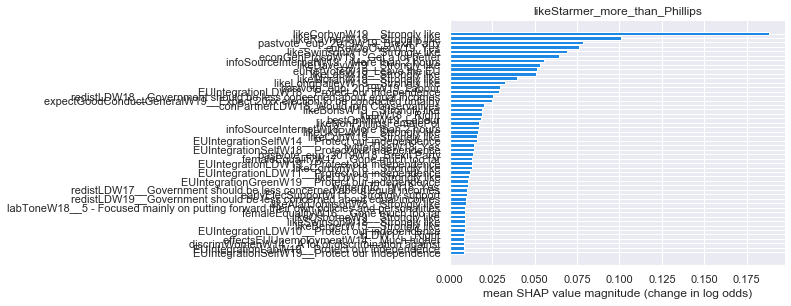

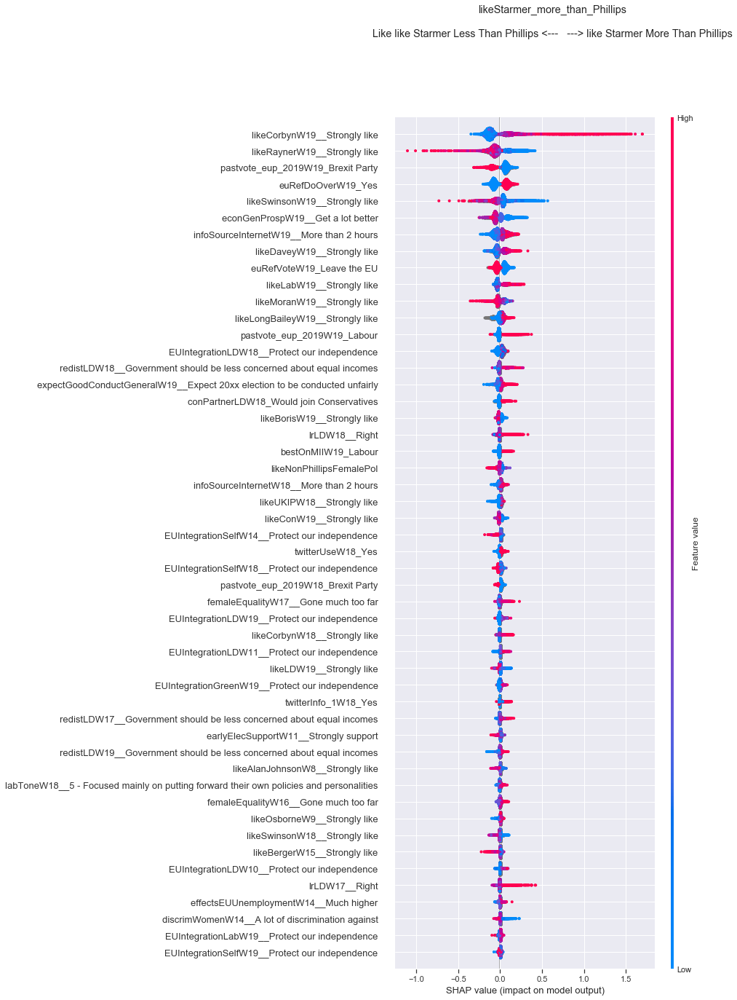

Wall time: 11min 13s


(<shap.explainers.tree.TreeExplainer at 0x2b730c908>,
 array([[-3.9327994e-04,  0.0000000e+00,  0.0000000e+00, ...,
          0.0000000e+00, -6.2513324e-03,  2.2212958e-02],
        [-2.7249091e-05,  0.0000000e+00,  0.0000000e+00, ...,
          0.0000000e+00, -1.5965906e-03, -8.8333003e-03],
        [-3.9937535e-05,  0.0000000e+00,  0.0000000e+00, ...,
          0.0000000e+00, -1.5216590e-03,  1.9458756e-02],
        ...,
        [-7.9137004e-05,  0.0000000e+00,  0.0000000e+00, ...,
          0.0000000e+00,  6.8201747e-04, -1.9090779e-03],
        [-3.8831440e-05,  0.0000000e+00,  0.0000000e+00, ...,
          0.0000000e+00, -8.4958854e-04,  1.8079169e-02],
        [-7.9137004e-05,  0.0000000e+00,  0.0000000e+00, ...,
          0.0000000e+00, -1.2097383e-03,  3.0076219e-02]], dtype=float32),
 Index(['turnoutUKGeneralW1__Very likely that I will vote',
        'turnoutUKGeneralW2__Very likely that I will vote',
        'turnoutUKGeneralW3__Very likely that I will vote',
        'turnout

In [163]:
%%time
Treatment = "likeStarmer_more_than_Phillips_extra_like_vars_excl_protagonists"
var_stub = "likeStarmer_more_than_Phillips"

var_list = ["likeStarmer_more_than_Phillips"]
var_stub_list = [var_stub,"likeStarmer","likePhillips","likeFemalePol","likeMalePol","likePol"]

mask = (BES_Panel["likePhillipsW19"].notnull()) & (BES_Panel["likeStarmerW19"].notnull())
df = BES_reduced_with_na[mask].copy()

likeNonStarmerCorbynMalePol = BES_reduced_with_na[ match(BES_reduced_with_na,"|".join( ["like"+x for x in gender_ser[gender_ser=="M"].index if x not in ["Starmer","Corbyn"]] ) ).index ].mean(axis=1)
df["likeNonStarmerCorbynMalePol"] = likeNonStarmerCorbynMalePol

likeNonPhillipsFemalePol = BES_reduced_with_na[ match(BES_reduced_with_na,"|".join( ["like"+x for x in gender_ser[gender_ser=="F"].index if x not in ["Phillips"]] ) ).index ].mean(axis=1)
df["likeNonPhillipsFemalePol"] = likeNonPhillipsFemalePol


df["likeStarmer_more_than_Phillips"] = BES_reduced_with_na["likeStarmerW19__Strongly like"] -\
                                       BES_reduced_with_na["likePhillipsW19__Strongly like"]

colname = "likeStarmer_more_than_Phillips"
# BES_cens = BES_cens_base[fertility_columns+age_columns+["leaveHanretty"]+["c11Degree"]]
xgboost_run(subdir=colname,min_features = min(BES_reduced_with_na.shape[1]-1,50),Treatment=Treatment,
           title = colname+"\n\nLike like Starmer Less Than Phillips <---   ---> like Starmer More Than Phillips")

In [160]:
# BES_reduced_with_na[ match(BES_reduced_with_na,"|".join( ["like"+x for x in df[df=="M"].index if x not in ["Starmer","Corbyn"]] ) ).index ].mean(axis=1)


In [161]:
# ["like"+x for x in df[df=="M"].index if x not in ["Starmer","Corbyn"]]

In [162]:
# match(BES_reduced_with_na,"|".join( ["like"+x for x in df[df=="M"].index if x not in ["Starmer","Corbyn"]] ) ).index

In [339]:
# match(BES_reduced_with_na,"likeStarmer|likeCorbyn|Age|age")

In [328]:
def weighted_mean(x, **kws):
    val, weight = map(np.asarray, zip(*x))
    val, weight = val[~np.isnan(val)],weight[~np.isnan(val)]
#     raise Exception
    return (val * weight).sum() / weight.sum()

In [ ]:
# Con/Lab/Starmer/Boris

In [364]:
pol_list = ["Starmer","Corbyn","Lab","Boris","Con"]
# ["Starmer","Corbyn","Phillips","Swinson","Rayner","LongBailey","Boris"]
pol_var_list = ['like'+x+'W19__Strongly like' for x in pol_list]

In [365]:
df = BES_reduced_with_na[["Age"]+pol_var_list].astype('float32')
df["wts"] = BES_Panel[ "wt_new_W19_result" ]
pol_dict = {x:'like'+x+'W19' for x in pol_list}
for col in pol_dict.keys():
    df[col+"_dk"] = (BES_Panel[pol_dict[col]]=="Don't know").astype('float32')*100
    df[col+"_dk"][BES_Panel[pol_dict[col]].isnull()]=np.nan

df = df.set_index(["Age","wts"]).stack().reset_index()
df.columns = ["Age","wts","Politician","Preference"]

In [366]:
replace_dict = dict(zip(pol_var_list,pol_list))

df["Politician"] = df["Politician"].replace(replace_dict)
df = df[df["Age"]<=80]

df["Preference"] = list(zip(df["Preference"],df["wts"]))

# for col in ['like'+x+'W19'+"_dk" for x in pol_list]:
#     df[col+"_dk"] = list(zip(df[col],df["wts"]))

In [ ]:
pol_list = ["Starmer","Corbyn","Lab","Boris","Con"]
# ["Starmer","Corbyn","Phillips","Swinson","Rayner","LongBailey","Boris"]
pol_var_list = ['like'+x+'W19__Strongly like' for x in pol_list]

df = BES_reduced_with_na[["Age"]+pol_var_list].astype('float32')
df["wts"] = BES_Panel[ "wt_new_W19_result" ]
pol_dict = {x:'like'+x+'W19' for x in pol_list}
for col in pol_dict.keys():
    df[col+"_dk"] = (BES_Panel[pol_dict[col]]=="Don't know").astype('float32')*100
    df[col+"_dk"][BES_Panel[pol_dict[col]].isnull()]=np.nan

df = df.set_index(["Age","wts"]).stack().reset_index()
df.columns = ["Age","wts","Politician","Preference"]

df["Age"] = (df["Age"]/2).apply(lambda x: np.ceil(x)*2)

%%time
plt.figure(figsize=(12,8))
sns.lineplot(data=df[ df["Politician"].apply(lambda x: x in pol_list) ],
             x="Age",y="Preference",hue="Politician",n_boot=1000,estimator=weighted_mean,);

plt.ylim([0,10]);
plt.yticks(list(range(0,11)),BES_Panel["likeStarmerW19"].cat.categories[0:11]);
plt.hlines(5, 16, 80, linestyles ='dotted');
plt.title("Mean Sentiment About Politicians By Age (Post 2019GE)")

In [367]:
df["Age"] = (df["Age"]/2).apply(lambda x: np.ceil(x)*2)

Wall time: 1min 2s


Text(0.5, 1.0, 'Mean Sentiment About Politicians By Age (Post 2019GE)')

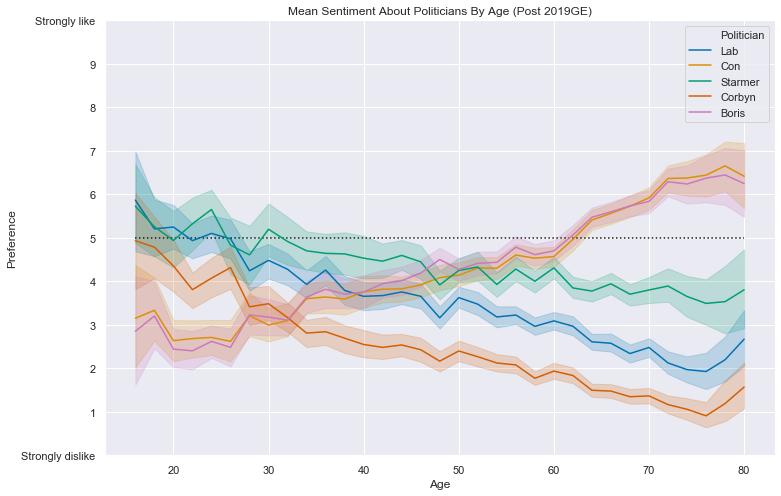

In [368]:
%%time
plt.figure(figsize=(12,8))
sns.lineplot(data=df[ df["Politician"].apply(lambda x: x in pol_list) ],
             x="Age",y="Preference",hue="Politician",n_boot=1000,estimator=weighted_mean,);

plt.ylim([0,10]);
plt.yticks(list(range(0,11)),BES_Panel["likeStarmerW19"].cat.categories[0:11]);
plt.hlines(5, 16, 80, linestyles ='dotted');
plt.title("Mean Sentiment About Politicians By Age (Post 2019GE)")

Wall time: 1min 26s


Text(0.5, 1.0, "Mean Sentiment About Politicians By Age (Don't Know%) (Post 2019GE)")

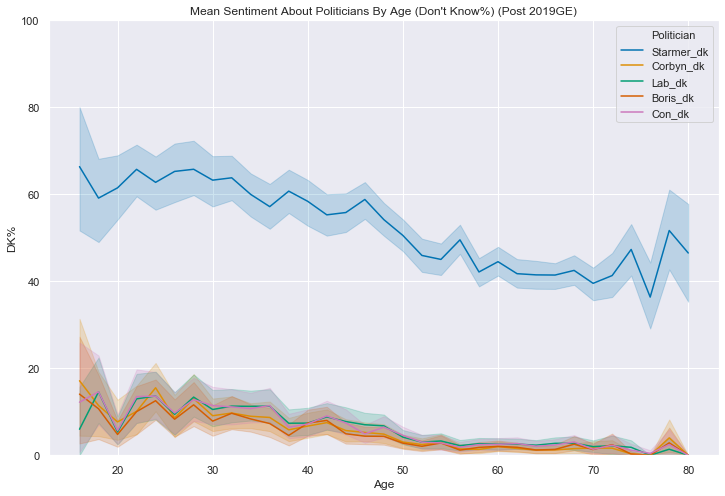

In [369]:
%%time
plt.figure(figsize=(12,8))
sns.lineplot(data=df[ df["Politician"].apply(lambda x: x in [x+"_dk" for x in pol_list]) ],
             x="Age",y="Preference",hue="Politician",n_boot=1000,estimator=weighted_mean,
             markers=True, dashes=True,);
plt.ylim([0,100]);
plt.ylabel("DK%");
plt.title("Mean Sentiment About Politicians By Age (Don't Know%) (Post 2019GE)");

In [371]:
search(BES_Panel,"wt_new_")

wt_new_W10           30237
wt_new_W11           30956
wt_new_W14           31063
wt_new_W15           30842
wt_new_W16           37959
wt_new_W1_W16         2427
wt_new_W18           37825
wt_new_W6W7          21081
wt_new_W2W6          23163
wt_new_W2W6W7        17076
wt_new_W9_W13        12562
wt_new_W12           34394
wt_new_W1_W11         6473
wt_new_W1_W12         5833
wt_new_W1_W13         5301
wt_new_W6_W11         9373
wt_new_W6_W12         8398
wt_new_W6_W13         7622
wt_new_W11_W13       21520
wt_new_W13W16        14647
wt_new_W13_result    31135
wt_new_W6W16          9587
wt_new_W2W16          8388
wt_new_W17           34366
wt_new_W13W17        15744
wt_new_W6W13W19       8743
wt_new_W9W19         13604
wt_new_W13_W19        5861
wt_new_W13W19        15811
wt_new_W16W19        21840
wt_new_W17W18W19     19000
wt_new_W19_result    32177
wt_new_W9            30036
wt_new_W8            33502
wt_new_W7            30895
wt_new_W6            30073
wt_new_W13W14        20393
w

In [370]:
search(BES_Panel,"edlevel")

edlevelW1_W6      35625
edlevelW7         28633
edlevelW8W9W10    40615
edlevelW11        28823
edlevelW12        32014
edlevelW13        29078
edlevelW14        28821
edlevelW15        28518
edlevelW16        34904
edlevelW17        29354
edlevelW18        31916
edlevelW19        29830
dtype: int64

In [444]:
map_dict = {'Strongly dislike':'Really Dislike', '1':'Really Dislike', '2':"Dislike", '3':"Dislike", '4':"Neither Like nor Dislike",
 '5':"Neither Like nor Dislike", '6':"Neither Like nor Dislike", '7':"Like", '8':"Like", '9':"Really Like",
       'Strongly like':"Really Like", "Don't know":"Don't know"}

recoded_order = ["Really Dislike","Dislike","Neither Like nor Dislike","Like","Really Like","Don't know"]
df = pd.crosstab(BES_Panel["edlevelW19"],BES_Panel["likeStarmerW19"].map(map_dict).astype('category').cat.reorder_categories(recoded_order),
                                values=BES_Panel["wt_new_W19_result"],aggfunc=sum,normalize='index')*100
df = df.stack().reset_index()
df.columns = ["Education","Feelings About Starmer","Percent"]

df.loc[df["Feelings About Starmer"]=="Don't know","Percent"] = df[df["Feelings About Starmer"]=="Don't know"]["Percent"]/3

In [422]:
df.loc[df["Feelings About Starmer"]=="Don't know","Percent"]

5     21.042643
11    20.265085
17    19.839705
23    20.093996
29    17.021603
35    13.622788
Name: Percent, dtype: float32

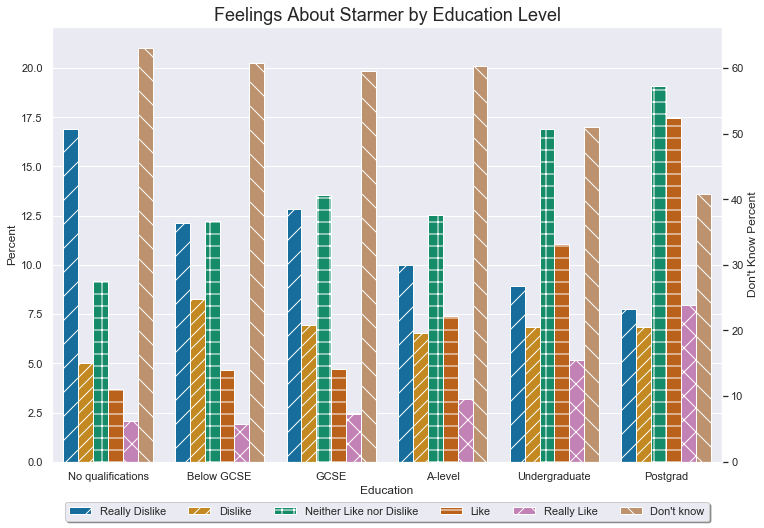

In [451]:
map_dict = {'Strongly dislike':'Really Dislike', '1':'Really Dislike', '2':"Dislike", '3':"Dislike", '4':"Neither Like nor Dislike",
 '5':"Neither Like nor Dislike", '6':"Neither Like nor Dislike", '7':"Like", '8':"Like", '9':"Really Like",
       'Strongly like':"Really Like", "Don't know":"Don't know"}

recoded_order = ["Really Dislike","Dislike","Neither Like nor Dislike","Like","Really Like","Don't know"]
df = pd.crosstab(BES_Panel["edlevelW19"],BES_Panel["likeStarmerW19"].map(map_dict).astype('category').cat.reorder_categories(recoded_order),
                                values=BES_Panel["wt_new_W19_result"],aggfunc=sum,normalize='index')*100
df = df.stack().reset_index()
df.columns = ["Education","Feelings About Starmer","Percent"]

df.loc[df["Feelings About Starmer"]=="Don't know","Percent"] = df[df["Feelings About Starmer"]=="Don't know"]["Percent"]/3


plt.figure(figsize=(12,8))
bar = sns.barplot(data=df,x="Education",y="Percent",hue="Feelings About Starmer");

import itertools
num_locations = len(recoded_order)
hatches = itertools.cycle(['/', '//', '+', '-', 'x', '\\', '*', 'o', 'O', '.'])
for i, bar in enumerate(plt.gca().patches):
    if i % num_locations == 0:
        hatch = next(hatches)
    bar.set_hatch(hatch)

secax = plt.gca().secondary_yaxis('right', functions=(lambda x: x*3,lambda x: x/3));
secax.set_ylabel("Don't Know Percent");
# Put the legend out of the figure
# plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.);
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.08), shadow=True, ncol=6);
plt.title("Feelings About "+subject+" by Education Level",fontsize=18);

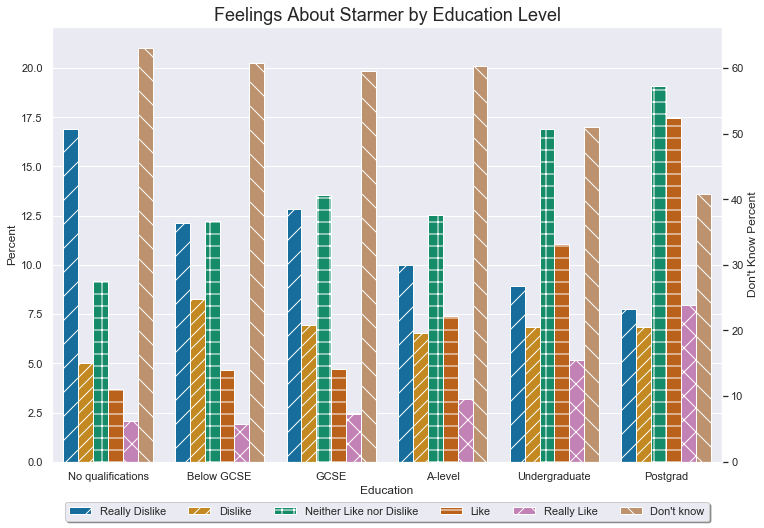

In [452]:
subject = "Starmer"

map_dict = {'Strongly dislike':'Really Dislike', '1':'Really Dislike', '2':"Dislike", '3':"Dislike", '4':"Neither Like nor Dislike",
 '5':"Neither Like nor Dislike", '6':"Neither Like nor Dislike", '7':"Like", '8':"Like", '9':"Really Like",
       'Strongly like':"Really Like", "Don't know":"Don't know"}

recoded_order = ["Really Dislike","Dislike","Neither Like nor Dislike","Like","Really Like","Don't know"]
df = pd.crosstab(BES_Panel["edlevelW19"],BES_Panel["like"+subject+"W19"].map(map_dict).astype('category').cat.reorder_categories(recoded_order),
                                values=BES_Panel["wt_new_W19_result"],aggfunc=sum,normalize='index')*100
df = df.stack().reset_index()
df.columns = ["Education","Feelings About "+subject,"Percent"]

df.loc[df["Feelings About "+subject]=="Don't know","Percent"] = df[df["Feelings About "+subject]=="Don't know"]["Percent"]/3


plt.figure(figsize=(12,8))
bar = sns.barplot(data=df,x="Education",y="Percent",hue="Feelings About "+subject);

import itertools
num_locations = len(recoded_order)
hatches = itertools.cycle(['/', '//', '+', '-', 'x', '\\', '*', 'o', 'O', '.'])
for i, bar in enumerate(plt.gca().patches):
    if i % num_locations == 0:
        hatch = next(hatches)
    bar.set_hatch(hatch)

secax = plt.gca().secondary_yaxis('right', functions=(lambda x: x*3,lambda x: x/3));
secax.set_ylabel("Don't Know Percent");
# Put the legend out of the figure
# plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.);
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.08), shadow=True, ncol=6);
plt.title("Feelings About "+subject+" by Education Level",fontsize=18);

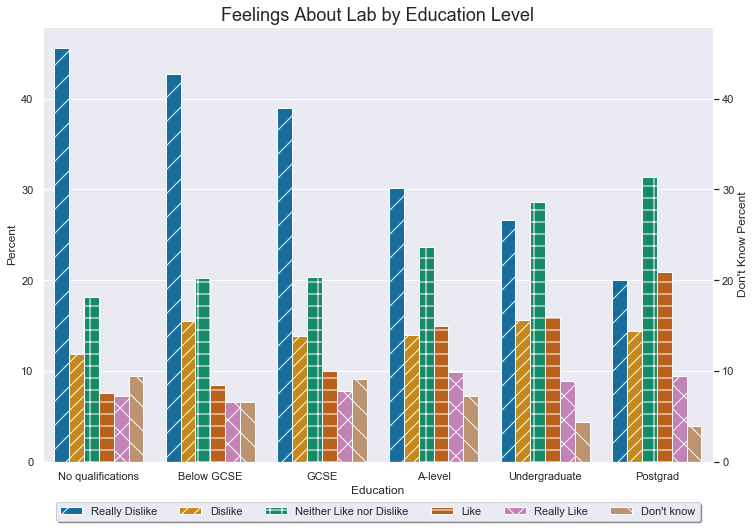

In [455]:
subject = "Lab"

map_dict = {'Strongly dislike':'Really Dislike', '1':'Really Dislike', '2':"Dislike", '3':"Dislike", '4':"Neither Like nor Dislike",
 '5':"Neither Like nor Dislike", '6':"Neither Like nor Dislike", '7':"Like", '8':"Like", '9':"Really Like",
       'Strongly like':"Really Like", "Don't know":"Don't know"}

recoded_order = ["Really Dislike","Dislike","Neither Like nor Dislike","Like","Really Like","Don't know"]
df = pd.crosstab(BES_Panel["edlevelW19"],BES_Panel["like"+subject+"W19"].map(map_dict).astype('category').cat.reorder_categories(recoded_order),
                                values=BES_Panel["wt_new_W19_result"],aggfunc=sum,normalize='index')*100
df = df.stack().reset_index()
df.columns = ["Education","Feelings About "+subject,"Percent"]

dk_deflation = 1

df.loc[df["Feelings About "+subject]=="Don't know","Percent"] = df[df["Feelings About "+subject]=="Don't know"]["Percent"]/dk_deflation


plt.figure(figsize=(12,8))
bar = sns.barplot(data=df,x="Education",y="Percent",hue="Feelings About "+subject);

import itertools
num_locations = len(recoded_order)
hatches = itertools.cycle(['/', '//', '+', '-', 'x', '\\', '*', 'o', 'O', '.'])
for i, bar in enumerate(plt.gca().patches):
    if i % num_locations == 0:
        hatch = next(hatches)
    bar.set_hatch(hatch)

secax = plt.gca().secondary_yaxis('right', functions=(lambda x: x*dk_deflation,lambda x: x/dk_deflation));
secax.set_ylabel("Don't Know Percent");
# Put the legend out of the figure
# plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.);
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.08), shadow=True, ncol=6);
plt.title("Feelings About "+subject+" by Education Level",fontsize=18);

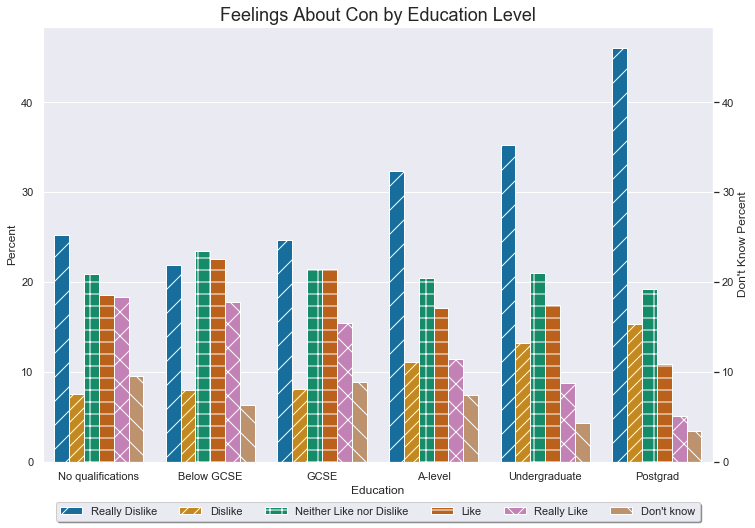

In [456]:
subject = "Con"

map_dict = {'Strongly dislike':'Really Dislike', '1':'Really Dislike', '2':"Dislike", '3':"Dislike", '4':"Neither Like nor Dislike",
 '5':"Neither Like nor Dislike", '6':"Neither Like nor Dislike", '7':"Like", '8':"Like", '9':"Really Like",
       'Strongly like':"Really Like", "Don't know":"Don't know"}

recoded_order = ["Really Dislike","Dislike","Neither Like nor Dislike","Like","Really Like","Don't know"]
df = pd.crosstab(BES_Panel["edlevelW19"],BES_Panel["like"+subject+"W19"].map(map_dict).astype('category').cat.reorder_categories(recoded_order),
                                values=BES_Panel["wt_new_W19_result"],aggfunc=sum,normalize='index')*100
df = df.stack().reset_index()
df.columns = ["Education","Feelings About "+subject,"Percent"]

dk_deflation = 1

df.loc[df["Feelings About "+subject]=="Don't know","Percent"] = df[df["Feelings About "+subject]=="Don't know"]["Percent"]/dk_deflation


plt.figure(figsize=(12,8))
bar = sns.barplot(data=df,x="Education",y="Percent",hue="Feelings About "+subject);

import itertools
num_locations = len(recoded_order)
hatches = itertools.cycle(['/', '//', '+', '-', 'x', '\\', '*', 'o', 'O', '.'])
for i, bar in enumerate(plt.gca().patches):
    if i % num_locations == 0:
        hatch = next(hatches)
    bar.set_hatch(hatch)

secax = plt.gca().secondary_yaxis('right', functions=(lambda x: x*dk_deflation,lambda x: x/dk_deflation));
secax.set_ylabel("Don't Know Percent");
# Put the legend out of the figure
# plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.);
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.08), shadow=True, ncol=6);
plt.title("Feelings About "+subject+" by Education Level",fontsize=18);

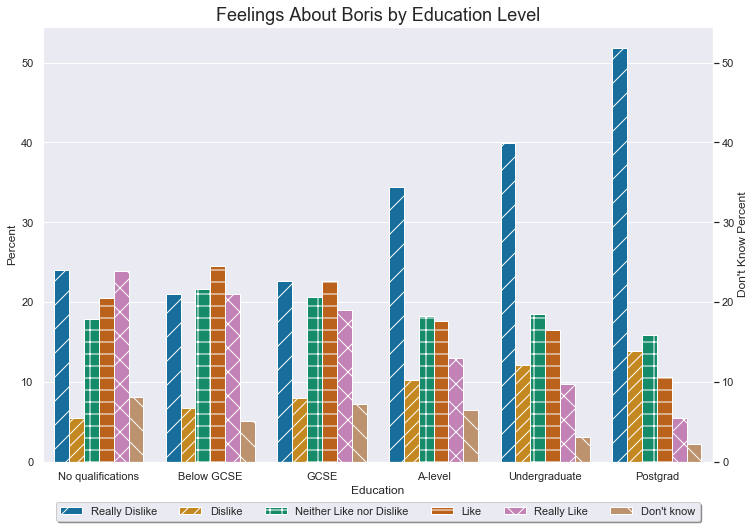

In [457]:
subject = "Boris"

map_dict = {'Strongly dislike':'Really Dislike', '1':'Really Dislike', '2':"Dislike", '3':"Dislike", '4':"Neither Like nor Dislike",
 '5':"Neither Like nor Dislike", '6':"Neither Like nor Dislike", '7':"Like", '8':"Like", '9':"Really Like",
       'Strongly like':"Really Like", "Don't know":"Don't know"}

recoded_order = ["Really Dislike","Dislike","Neither Like nor Dislike","Like","Really Like","Don't know"]
df = pd.crosstab(BES_Panel["edlevelW19"],BES_Panel["like"+subject+"W19"].map(map_dict).astype('category').cat.reorder_categories(recoded_order),
                                values=BES_Panel["wt_new_W19_result"],aggfunc=sum,normalize='index')*100
df = df.stack().reset_index()
df.columns = ["Education","Feelings About "+subject,"Percent"]

dk_deflation = 1

df.loc[df["Feelings About "+subject]=="Don't know","Percent"] = df[df["Feelings About "+subject]=="Don't know"]["Percent"]/dk_deflation


plt.figure(figsize=(12,8))
bar = sns.barplot(data=df,x="Education",y="Percent",hue="Feelings About "+subject);

import itertools
num_locations = len(recoded_order)
hatches = itertools.cycle(['/', '//', '+', '-', 'x', '\\', '*', 'o', 'O', '.'])
for i, bar in enumerate(plt.gca().patches):
    if i % num_locations == 0:
        hatch = next(hatches)
    bar.set_hatch(hatch)

secax = plt.gca().secondary_yaxis('right', functions=(lambda x: x*dk_deflation,lambda x: x/dk_deflation));
secax.set_ylabel("Don't Know Percent");
# Put the legend out of the figure
# plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.);
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.08), shadow=True, ncol=6);
plt.title("Feelings About "+subject+" by Education Level",fontsize=18);

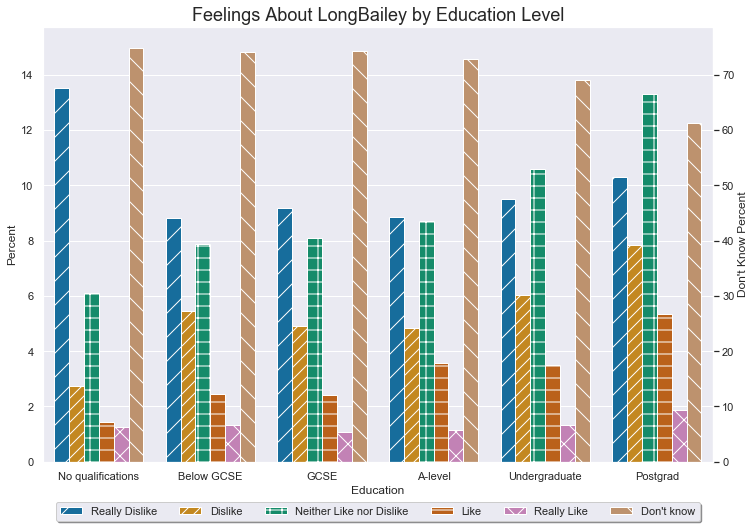

In [460]:
subject = "LongBailey"

map_dict = {'Strongly dislike':'Really Dislike', '1':'Really Dislike', '2':"Dislike", '3':"Dislike", '4':"Neither Like nor Dislike",
 '5':"Neither Like nor Dislike", '6':"Neither Like nor Dislike", '7':"Like", '8':"Like", '9':"Really Like",
       'Strongly like':"Really Like", "Don't know":"Don't know"}

recoded_order = ["Really Dislike","Dislike","Neither Like nor Dislike","Like","Really Like","Don't know"]
df = pd.crosstab(BES_Panel["edlevelW19"],BES_Panel["like"+subject+"W19"].map(map_dict).astype('category').cat.reorder_categories(recoded_order),
                                values=BES_Panel["wt_new_W19_result"],aggfunc=sum,normalize='index')*100
df = df.stack().reset_index()
df.columns = ["Education","Feelings About "+subject,"Percent"]

dk_deflation = 5

df.loc[df["Feelings About "+subject]=="Don't know","Percent"] = df[df["Feelings About "+subject]=="Don't know"]["Percent"]/dk_deflation


plt.figure(figsize=(12,8))
bar = sns.barplot(data=df,x="Education",y="Percent",hue="Feelings About "+subject);

import itertools
num_locations = len(recoded_order)
hatches = itertools.cycle(['/', '//', '+', '-', 'x', '\\', '*', 'o', 'O', '.'])
for i, bar in enumerate(plt.gca().patches):
    if i % num_locations == 0:
        hatch = next(hatches)
    bar.set_hatch(hatch)

secax = plt.gca().secondary_yaxis('right', functions=(lambda x: x*dk_deflation,lambda x: x/dk_deflation));
secax.set_ylabel("Don't Know Percent");
# Put the legend out of the figure
# plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.);
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.08), shadow=True, ncol=6);
plt.title("Feelings About "+subject+" by Education Level",fontsize=18);

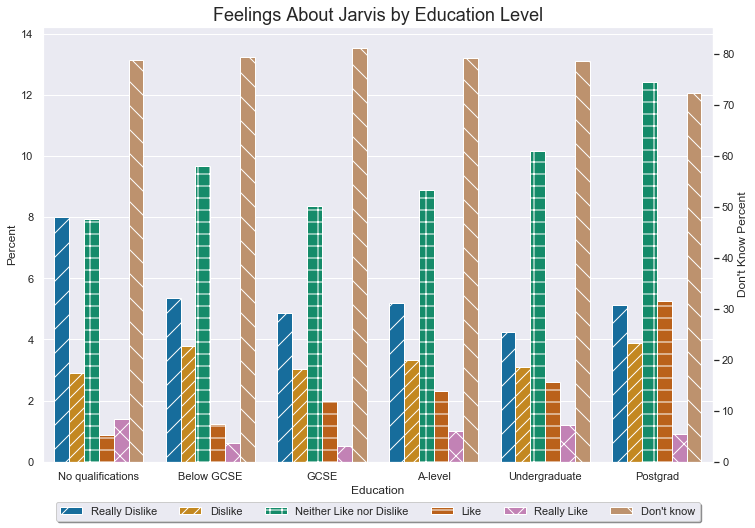

In [480]:
subject = "Jarvis"

map_dict = {'Strongly dislike':'Really Dislike', '1':'Really Dislike', '2':"Dislike", '3':"Dislike", '4':"Neither Like nor Dislike",
 '5':"Neither Like nor Dislike", '6':"Neither Like nor Dislike", '7':"Like", '8':"Like", '9':"Really Like",
       'Strongly like':"Really Like", "Don't know":"Don't know"}

recoded_order = ["Really Dislike","Dislike","Neither Like nor Dislike","Like","Really Like","Don't know"]
df = pd.crosstab(BES_Panel["edlevelW19"],BES_Panel["like"+subject+"W9"].map(map_dict).astype('category').cat.reorder_categories(recoded_order),
                                values=BES_Panel["wt_new_W9"],aggfunc=sum,normalize='index')*100
df = df.stack().reset_index()
df.columns = ["Education","Feelings About "+subject,"Percent"]

dk_deflation = 6

df.loc[df["Feelings About "+subject]=="Don't know","Percent"] = df[df["Feelings About "+subject]=="Don't know"]["Percent"]/dk_deflation


plt.figure(figsize=(12,8))
bar = sns.barplot(data=df,x="Education",y="Percent",hue="Feelings About "+subject);

import itertools
num_locations = len(recoded_order)
hatches = itertools.cycle(['/', '//', '+', '-', 'x', '\\', '*', 'o', 'O', '.'])
for i, bar in enumerate(plt.gca().patches):
    if i % num_locations == 0:
        hatch = next(hatches)
    bar.set_hatch(hatch)

secax = plt.gca().secondary_yaxis('right', functions=(lambda x: x*dk_deflation,lambda x: x/dk_deflation));
secax.set_ylabel("Don't Know Percent");
# Put the legend out of the figure
# plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.);
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.08), shadow=True, ncol=6);
plt.title("Feelings About "+subject+" by Education Level",fontsize=18);

In [437]:
map_dict = {'Strongly dislike':'Really Dislike', '1':'Really Dislike', '2':"Dislike", '3':"Dislike", '4':"Neither Like nor Dislike",
 '5':"Neither Like nor Dislike", '6':"Neither Like nor Dislike", '7':"Like", '8':"Like", '9':"Really Like",
       'Strongly like':"Really Like", "Don't know":np.nan}

recoded_order = ["Really Dislike","Dislike","Neither Like nor Dislike","Like","Really Like"]
df = pd.crosstab(BES_Panel["edlevelW19"],BES_Panel["likeStarmerW19"].map(map_dict).astype('category').cat.reorder_categories(recoded_order),
                                values=BES_Panel["wt_new_W19_result"],aggfunc=sum,normalize='index')*100
df = df.stack().reset_index()
df.columns = ["Education","Feelings About Starmer","Percent"]

plt.figure(figsize=(12,8))
sns.barplot(data=df,x="Education",y="Percent",hue="Feelings About Starmer");
plt.title("Feelings About "+subject+" by Education Level",fontsize=18);

SyntaxError: EOL while scanning string literal (<ipython-input-437-bb90d7f542e6>, line 13)

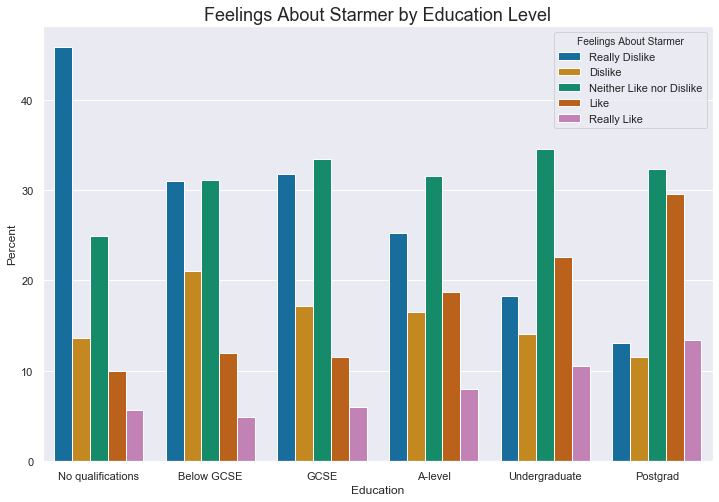

In [10]:
subject = "Starmer"

map_dict = {'Strongly dislike':'Really Dislike', '1':'Really Dislike', '2':"Dislike", '3':"Dislike", '4':"Neither Like nor Dislike",
 '5':"Neither Like nor Dislike", '6':"Neither Like nor Dislike", '7':"Like", '8':"Like", '9':"Really Like",
       'Strongly like':"Really Like", "Don't know":np.nan}

recoded_order = ["Really Dislike","Dislike","Neither Like nor Dislike","Like","Really Like"]
df = pd.crosstab(BES_Panel["edlevelW19"],BES_Panel["like"+subject+"W19"].map(map_dict).astype('category').cat.reorder_categories(recoded_order),
                                values=BES_Panel["wt_new_W19_result"],aggfunc=sum,normalize='index')*100
df = df.stack().reset_index()
df.columns = ["Education","Feelings About Starmer","Percent"]



plt.figure(figsize=(12,8))
sns.barplot(data=df,x="Education",y="Percent",hue="Feelings About "+subject);
plt.title("Feelings About "+subject+" by Education Level",fontsize=18);

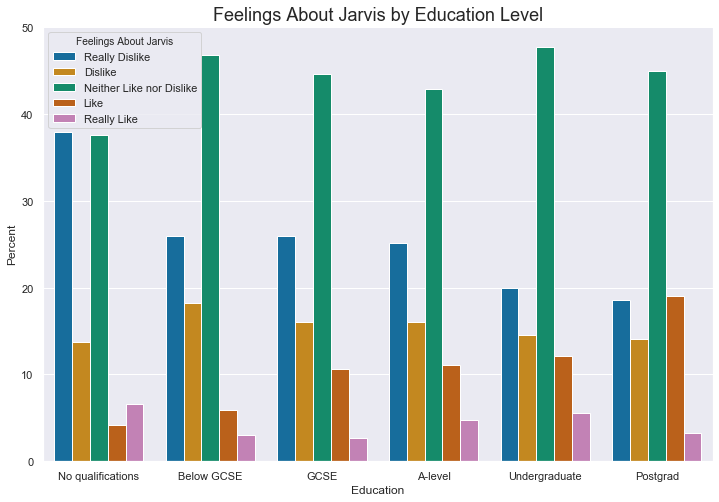

In [477]:
subject = "Jarvis"


map_dict = {'Strongly dislike':'Really Dislike', '1':'Really Dislike', '2':"Dislike", '3':"Dislike", '4':"Neither Like nor Dislike",
 '5':"Neither Like nor Dislike", '6':"Neither Like nor Dislike", '7':"Like", '8':"Like", '9':"Really Like",
       'Strongly like':"Really Like", "Don't know":np.nan}

recoded_order = ["Really Dislike","Dislike","Neither Like nor Dislike","Like","Really Like"]
df = pd.crosstab(BES_Panel["edlevelW19"],BES_Panel["like"+subject+"W9"].map(map_dict).astype('category').cat.reorder_categories(recoded_order),
                                values=BES_Panel["wt_new_W9"],aggfunc=sum,normalize='index')*100
df = df.stack().reset_index()
df.columns = ["Education","Feelings About "+subject,"Percent"]

plt.figure(figsize=(12,8))
sns.barplot(data=df,x="Education",y="Percent",hue="Feelings About "+subject);
plt.title("Feelings About "+subject+" by Education Level",fontsize=18);

In [387]:
BES_Panel["likeStarmerW19"].map(map_dict).astype('category').value_counts()

Neither Like nor Dislike    5408
Really Dislike              4200
Like                        3412
Dislike                     2607
Really Like                 1797
Name: likeStarmerW19, dtype: int64

In [461]:
BES_Panel["likeStarmerW19"].value_counts()

Don't know          14753
Strongly dislike     3166
5                    2704
7                    1836
8                    1576
6                    1572
3                    1318
2                    1289
4                    1132
1                    1034
Strongly like        1032
9                     765
Name: likeStarmerW19, dtype: int64

In [474]:
BES_Panel["likeJarvisW9"].value_counts()

Don't know          21780
5                    2106
Strongly dislike     1234
4                     870
6                     756
3                     751
7                     709
2                     607
1                     429
8                     388
Strongly like         247
9                     159
Name: likeJarvisW9, dtype: int64

In [475]:
search(BES_Panel,"wt_new")

wt_new_W10           30237
wt_new_W11           30956
wt_new_W14           31063
wt_new_W15           30842
wt_new_W16           37959
wt_new_W1_W16         2427
wt_new_W18           37825
wt_new_W6W7          21081
wt_new_W2W6          23163
wt_new_W2W6W7        17076
wt_new_W9_W13        12562
wt_new_W12           34394
wt_new_W1_W11         6473
wt_new_W1_W12         5833
wt_new_W1_W13         5301
wt_new_W6_W11         9373
wt_new_W6_W12         8398
wt_new_W6_W13         7622
wt_new_W11_W13       21520
wt_new_W13W16        14647
wt_new_W13_result    31135
wt_new_W6W16          9587
wt_new_W2W16          8388
wt_new_W17           34366
wt_new_W13W17        15744
wt_new_W6W13W19       8743
wt_new_W9W19         13604
wt_new_W13_W19        5861
wt_new_W13W19        15811
wt_new_W16W19        21840
wt_new_W17W18W19     19000
wt_new_W19_result    32177
wt_new_W9            30036
wt_new_W8            33502
wt_new_W7            30895
wt_new_W6            30073
wt_new_W13W14        20393
w

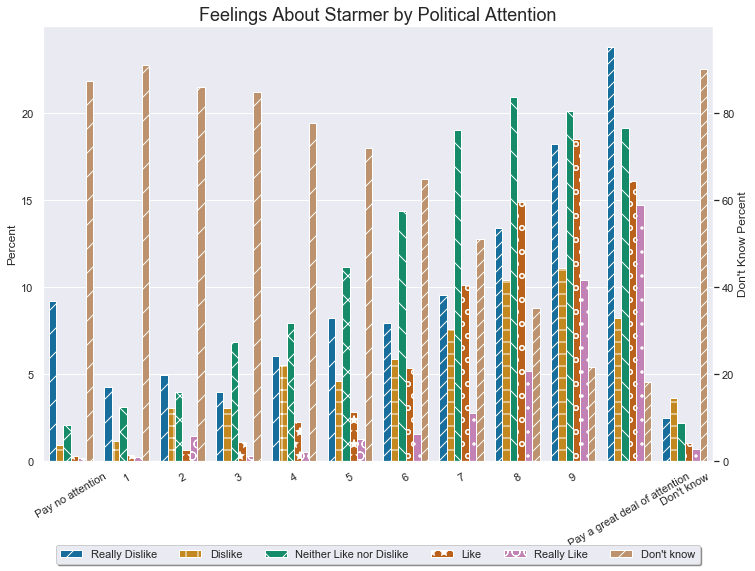

In [19]:
subject = "Starmer"

map_dict = {'Strongly dislike':'Really Dislike', '1':'Really Dislike', '2':"Dislike", '3':"Dislike", '4':"Neither Like nor Dislike",
 '5':"Neither Like nor Dislike", '6':"Neither Like nor Dislike", '7':"Like", '8':"Like", '9':"Really Like",
       'Strongly like':"Really Like", "Don't know":"Don't know"}

recoded_order = ["Really Dislike","Dislike","Neither Like nor Dislike","Like","Really Like","Don't know"]
df = pd.crosstab(BES_Panel["polAttentionW19"],BES_Panel["like"+subject+"W19"].map(map_dict).astype('category').cat.reorder_categories(recoded_order),
                                values=BES_Panel["wt_new_W19_result"],aggfunc=sum,normalize='index')*100
df = df.stack().reset_index()
df.columns = ["Political Attention","Feelings About Starmer","Percent"]

dk_deflation = 4

df.loc[df["Feelings About "+subject]=="Don't know","Percent"] = df[df["Feelings About "+subject]=="Don't know"]["Percent"]/dk_deflation


plt.figure(figsize=(12,8))
bar = sns.barplot(data=df,x="Political Attention",y="Percent",hue="Feelings About "+subject);

import itertools
num_locations = len(recoded_order)
hatches = itertools.cycle(['/', '//', '+', '-', 'x', '\\', '*', 'o', 'O', '.'])
for i, bar in enumerate(plt.gca().patches):
    if i % num_locations == 0:
        hatch = next(hatches)
    bar.set_hatch(hatch)

secax = plt.gca().secondary_yaxis('right', functions=(lambda x: x*dk_deflation,lambda x: x/dk_deflation));
secax.set_ylabel("Don't Know Percent");
# Put the legend out of the figure
# plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.);
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.18), shadow=True, ncol=6);
plt.title("Feelings About "+subject+" by Political Attention",fontsize=18);
plt.xticks(rotation=30);

In [7]:
BES_Panel["polAttentionW19"]

0          2
1          9
2          1
3          8
4          4
        ... 
97153    NaN
97154    NaN
97155    NaN
97156    NaN
97157    NaN
Name: polAttentionW19, Length: 97158, dtype: category
Categories (12, object): [Pay no attention < 1 < 2 < 3 ... 8 < 9 < Pay a great deal of attention < Don't know]

In [10]:
df

,Age,wts,Politician,Preference
0,60.0,0.913611,likeLabW19__Strongly like,3.0
1,60.0,0.913611,likeConW19__Strongly like,3.0
2,60.0,0.913611,Starmer_dk,100.0
3,60.0,0.913611,Corbyn_dk,100.0
4,60.0,0.913611,Lab_dk,0.0
...,...,...,...,...
302469,NaN,0.597109,Starmer_dk,0.0
302470,NaN,0.597109,Corbyn_dk,0.0
302471,NaN,0.597109,Lab_dk,0.0
302472,NaN,0.597109,Boris_dk,0.0


In [12]:
def weighted_mean(x, **kws):
    val, weight = map(np.asarray, zip(*x))
    val, weight = val[~np.isnan(val)],weight[~np.isnan(val)]
#     raise Exception
    return (val * weight).sum() / weight.sum()

Wall time: 1min 28s


Text(0.5, 1.0, 'Mean Sentiment About Politicians By Authoritarianism (Post 2019GE)')

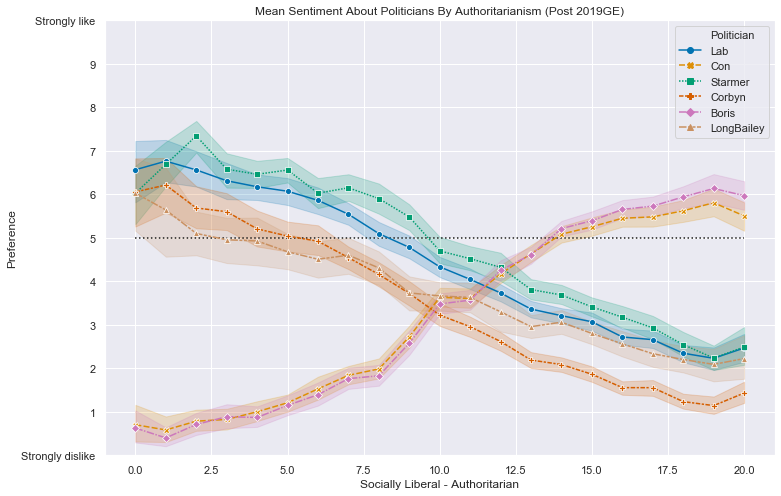

In [22]:
%%time
pol_list = ["Starmer","Corbyn","Lab","Boris","Con","LongBailey"]
# ["Starmer","Corbyn","Phillips","Swinson","Rayner","LongBailey","Boris"]
pol_var_list = ['like'+x+'W19__Strongly like' for x in pol_list]

df = BES_reduced_with_na[["al_scaleW17__Authoritarian"]+pol_var_list].astype('float32')
df["wts"] = BES_Panel[ "wt_new_W19_result" ]
pol_dict = {x:'like'+x+'W19' for x in pol_list}
for col in pol_dict.keys():
    df[col+"_dk"] = (BES_Panel[pol_dict[col]]=="Don't know").astype('float32')*100
    df[col+"_dk"][BES_Panel[pol_dict[col]].isnull()]=np.nan

df = df.set_index(["al_scaleW17__Authoritarian","wts"]).stack().reset_index()
df.columns = ["al_scaleW17__Authoritarian","wts","Politician","Preference"]

replace_dict = dict(zip(pol_var_list,pol_list))

df["Politician"] = df["Politician"].replace(replace_dict)
# df = df[df["al_scaleW17__Authoritarian"]<=80]

df["Preference"] = list(zip(df["Preference"],df["wts"]))

# for col in ['like'+x+'W19'+"_dk" for x in pol_list]:
#     df[col+"_dk"] = list(zip(df[col],df["wts"]))

# df["al_scaleW17__Authoritarian"] = (df["al_scaleW17__Authoritarian"]/2).apply(lambda x: np.ceil(x)*2)

plt.figure(figsize=(12,8))
sns.lineplot(data=df[ df["Politician"].apply(lambda x: x in pol_list) ],style="Politician",markers=True,
             x="al_scaleW17__Authoritarian",y="Preference",hue="Politician",n_boot=1000,estimator=weighted_mean,
             );

plt.ylim([0,10]);
plt.yticks(list(range(0,11)),BES_Panel["likeStarmerW19"].cat.categories[0:11]);
plt.hlines(5, 0, 20, linestyles ='dotted');
plt.xlabel("Socially Liberal - Authoritarian");
plt.title("Mean Sentiment About Politicians By Authoritarianism (Post 2019GE)");

In [14]:
search(BES_reduced_with_na,"al_scale")

al_scaleW1W2W3W4W5__Authoritarian    37890
al_scaleW6__Authoritarian            27288
al_scaleW7W8W9__Authoritarian        35873
al_scaleW10W11W12__Authoritarian     30088
al_scaleW13__Authoritarian           27253
al_scaleW14W15__Authoritarian        31629
al_scaleW16__Authoritarian           32671
al_scaleW17__Authoritarian           29773
dtype: int64

In [41]:
search(BES_Panel,"polAttention")

polAttentionW1        30565
polAttentionW2        30259
polAttentionW3        28296
polAttentionW4        31548
polAttentionW6        30258
polAttentionW7        30895
polAttentionW8        33502
polAttentionW10       30237
polAttentionW11       30956
polAttentionpdlW12    34390
polAttentionW13       31136
polAttentionW14       31063
polAttentionW15       30842
polAttentionW16       37959
polAttentionW17       34366
polAttentionW19       32177
dtype: int64

In [40]:
BES_Panel["polAttention"].cat.categories

KeyError: 'polAttention'

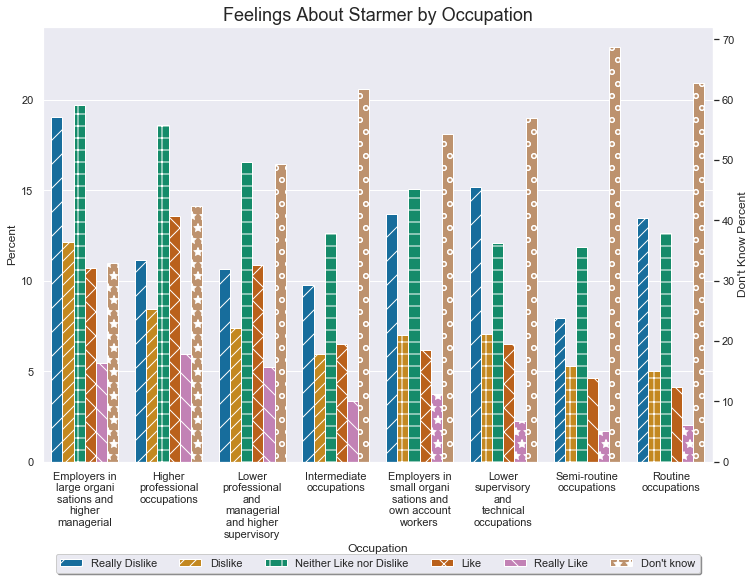

In [39]:
subject="Starmer"

map_dict = {'Strongly dislike':'Really Dislike', '1':'Really Dislike', '2':"Dislike", '3':"Dislike", '4':"Neither Like nor Dislike",
 '5':"Neither Like nor Dislike", '6':"Neither Like nor Dislike", '7':"Like", '8':"Like", '9':"Really Like",
       'Strongly like':"Really Like", "Don't know":"Don't know"}

recoded_order = ["Really Dislike","Dislike","Neither Like nor Dislike","Like","Really Like","Don't know"]
df = pd.crosstab(BES_Panel["ns_sec_analyticW19"],BES_Panel["likeStarmerW19"].map(map_dict).astype('category').cat.reorder_categories(recoded_order),
                                values=BES_Panel["wt_new_W19_result"],aggfunc=sum,normalize='index')*100
df = df.stack().reset_index()
df.columns = ["Occupation","Feelings About Starmer","Percent"]

df.loc[df["Feelings About Starmer"]=="Don't know","Percent"] = df[df["Feelings About Starmer"]=="Don't know"]["Percent"]/3


plt.figure(figsize=(12,8))
bar = sns.barplot(data=df,x="Occupation",y="Percent",hue="Feelings About Starmer");

import itertools
num_locations = len(recoded_order)
hatches = itertools.cycle(['/', '//', '+', '-', 'x', '\\', '*', 'o', 'O', '.'])
for i, bar in enumerate(plt.gca().patches):
    if i % num_locations == 0:
        hatch = next(hatches)
    bar.set_hatch(hatch)

secax = plt.gca().secondary_yaxis('right', functions=(lambda x: x*3,lambda x: x/3));
secax.set_ylabel("Don't Know Percent");
# Put the legend out of the figure
# plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.);
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), shadow=True, ncol=6);
plt.title("Feelings About "+subject+" by Occupation",fontsize=18);
from textwrap import wrap

plt.xticks(range(0,len(BES_Panel["ns_sec_analyticW19"].cat.categories)),
           ["\n".join(wrap(x,12)) for x in BES_Panel["ns_sec_analyticW19"].cat.categories]);

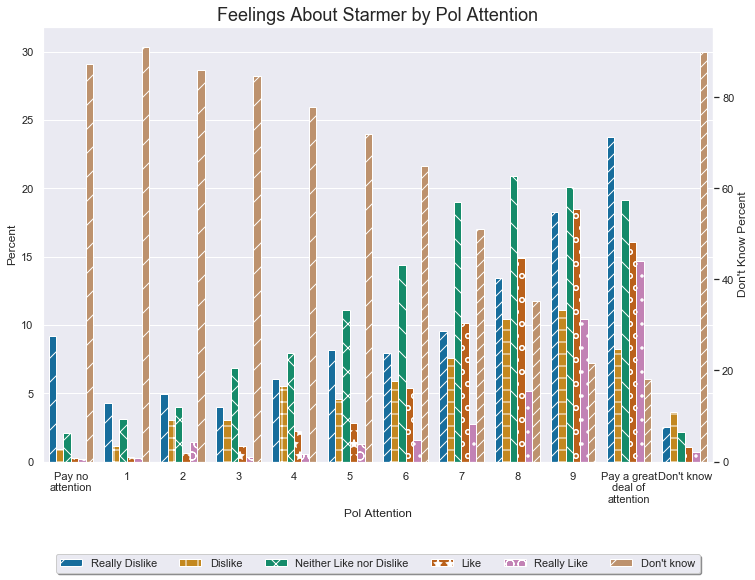

In [45]:
subject="Starmer"

map_dict = {'Strongly dislike':'Really Dislike', '1':'Really Dislike', '2':"Dislike", '3':"Dislike", '4':"Neither Like nor Dislike",
 '5':"Neither Like nor Dislike", '6':"Neither Like nor Dislike", '7':"Like", '8':"Like", '9':"Really Like",
       'Strongly like':"Really Like", "Don't know":"Don't know"}

recoded_order = ["Really Dislike","Dislike","Neither Like nor Dislike","Like","Really Like","Don't know"]
df = pd.crosstab(BES_Panel["polAttentionW19"],BES_Panel["likeStarmerW19"].map(map_dict).astype('category').cat.reorder_categories(recoded_order),
                                values=BES_Panel["wt_new_W19_result"],aggfunc=sum,normalize='index')*100
df = df.stack().reset_index()
df.columns = ["Pol Attention","Feelings About Starmer","Percent"]

df.loc[df["Feelings About Starmer"]=="Don't know","Percent"] = df[df["Feelings About Starmer"]=="Don't know"]["Percent"]/3


plt.figure(figsize=(12,8))
bar = sns.barplot(data=df,x="Pol Attention",y="Percent",hue="Feelings About Starmer");

import itertools
num_locations = len(recoded_order)
hatches = itertools.cycle(['/', '//', '+', '-', 'x', '\\', '*', 'o', 'O', '.'])
for i, bar in enumerate(plt.gca().patches):
    if i % num_locations == 0:
        hatch = next(hatches)
    bar.set_hatch(hatch)

secax = plt.gca().secondary_yaxis('right', functions=(lambda x: x*3,lambda x: x/3));
secax.set_ylabel("Don't Know Percent");
# Put the legend out of the figure
# plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.);
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), shadow=True, ncol=6);
plt.title("Feelings About "+subject+" by Pol Attention",fontsize=18);
from textwrap import wrap

plt.xticks(range(0,len(BES_Panel["polAttentionW19"].cat.categories)),
           ["\n".join(wrap(x,12)) for x in BES_Panel["polAttentionW19"].cat.categories]);

In [ ]:
%%time
pol_list = ["Starmer","Corbyn","Lab","Boris","Con","LongBailey"]
# ["Starmer","Corbyn","Phillips","Swinson","Rayner","LongBailey","Boris"]
pol_var_list = ['like'+x+'W19__Strongly like' for x in pol_list]

df = BES_reduced_with_na[["al_scaleW17__Authoritarian"]+pol_var_list].astype('float32')
df["wts"] = BES_Panel[ "wt_new_W19_result" ]
pol_dict = {x:'like'+x+'W19' for x in pol_list}
for col in pol_dict.keys():
    df[col+"_dk"] = (BES_Panel[pol_dict[col]]=="Don't know").astype('float32')*100
    df[col+"_dk"][BES_Panel[pol_dict[col]].isnull()]=np.nan

df = df.set_index(["al_scaleW17__Authoritarian","wts"]).stack().reset_index()
df.columns = ["al_scaleW17__Authoritarian","wts","Politician","Preference"]

replace_dict = dict(zip(pol_var_list,pol_list))

df["Politician"] = df["Politician"].replace(replace_dict)
# df = df[df["al_scaleW17__Authoritarian"]<=80]

df["Preference"] = list(zip(df["Preference"],df["wts"]))

# for col in ['like'+x+'W19'+"_dk" for x in pol_list]:
#     df[col+"_dk"] = list(zip(df[col],df["wts"]))

# df["al_scaleW17__Authoritarian"] = (df["al_scaleW17__Authoritarian"]/2).apply(lambda x: np.ceil(x)*2)

plt.figure(figsize=(12,8))
sns.lineplot(data=df[ df["Politician"].apply(lambda x: x in pol_list) ],style="Politician",markers=True,
             x="al_scaleW17__Authoritarian",y="Preference",hue="Politician",n_boot=1000,estimator=weighted_mean,
             );

plt.ylim([0,10]);
plt.yticks(list(range(0,11)),BES_Panel["likeStarmerW19"].cat.categories[0:11]);
plt.hlines(5, 0, 20, linestyles ='dotted');
plt.xlabel("Socially Liberal - Authoritarian");
plt.title("Mean Sentiment About Politicians By Authoritarianism (Post 2019GE)");



In [48]:
search(BES_reduced_with_na,"EUIntegrationSelf")

eesEUIntegrationSelfW1__Unification should be pushed further    12675
EUIntegrationSelfW1__Protect our independence                   13591
eesEUIntegrationSelfW2__Unification should be pushed further    12232
EUIntegrationSelfW2__Protect our independence                   13178
eesEUIntegrationSelfW3__Unification should be pushed further    11503
EUIntegrationSelfW3__Protect our independence                   12311
eesEUIntegrationSelfW4__Unification should be pushed further    12870
EUIntegrationSelfW4__Protect our independence                   13961
eesEUIntegrationSelfW6__Unification should be pushed further    12587
EUIntegrationSelfW6__Protect our independence                   13585
EUIntegrationSelfW7__Protect our independence                   28388
EUIntegrationSelfW8__Protect our independence                   31336
EUIntegrationSelfW9__Protect our independence                   28621
EUIntegrationSelfW10__Protect our independence                  28030
EUIntegrationSelfW11

In [ ]:
# likeStarmer_vs_likeLab

Wall time: 3min 17s


Text(0.5, 0, 'Some people feel that Britain should do all it can to unite fully with the European Union.\nOther people feel that Britain should do all it can to protect its independence from the\nEuropean Union. Where would you place **yourself** on this scale?')

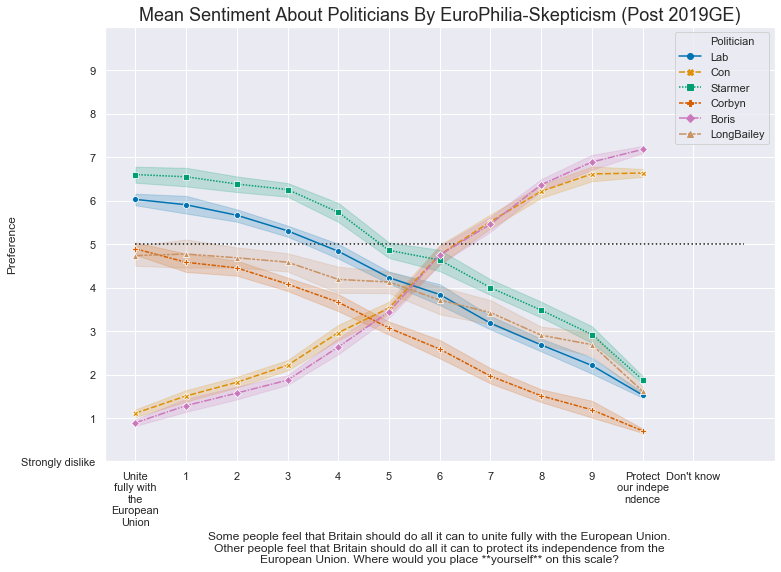

In [59]:
%%time

x_var = "EUIntegrationSelfW19__Protect our independence"

pol_list = ["Starmer","Corbyn","Lab","Boris","Con","LongBailey"]
# ["Starmer","Corbyn","Phillips","Swinson","Rayner","LongBailey","Boris"]
pol_var_list = ['like'+x+'W19__Strongly like' for x in pol_list]

df = BES_reduced_with_na[[x_var]+pol_var_list].astype('float32')
df["wts"] = BES_Panel[ "wt_new_W19_result" ]
pol_dict = {x:'like'+x+'W19' for x in pol_list}
for col in pol_dict.keys():
    df[col+"_dk"] = (BES_Panel[pol_dict[col]]=="Don't know").astype('float32')*100
    df[col+"_dk"][BES_Panel[pol_dict[col]].isnull()]=np.nan

df = df.set_index([x_var,"wts"]).stack().reset_index()
df.columns = [x_var,"wts","Politician","Preference"]

replace_dict = dict(zip(pol_var_list,pol_list))

df["Politician"] = df["Politician"].replace(replace_dict)
# df = df[df["al_scaleW17__Authoritarian"]<=80]

df["Preference"] = list(zip(df["Preference"],df["wts"]))

# for col in ['like'+x+'W19'+"_dk" for x in pol_list]:
#     df[col+"_dk"] = list(zip(df[col],df["wts"]))

# df["al_scaleW17__Authoritarian"] = (df["al_scaleW17__Authoritarian"]/2).apply(lambda x: np.ceil(x)*2)

plt.figure(figsize=(12,8))
sns.lineplot(data=df[ df["Politician"].apply(lambda x: x in pol_list) ],style="Politician",markers=True,
             x=x_var,y="Preference",hue="Politician",n_boot=1000,estimator=weighted_mean,
             );

plt.ylim([0,10]);
plt.yticks(list(range(0,10)),BES_Panel["likeStarmerW19"].cat.categories[0:11]);
plt.hlines(5, 0, len(BES_Panel[x_var.split("_")[0]].cat.categories)-2, linestyles ='dotted');

plt.title("Mean Sentiment About Politicians/Parties By EuroPhilia-Skepticism (Post 2019GE)",fontsize=18);
from textwrap import wrap
plt.xticks(range(0,len(BES_Panel[x_var.split("_")[0]].cat.categories)),
           ["\n".join(wrap(x,10)) for x in BES_Panel[x_var.split("_")[0]].cat.categories]);
ques = "Some people feel that Britain should do all it can to unite fully with the European Union. Other people feel that Britain should do all it can to protect its independence from the European Union. Where would you place **yourself** on this scale?"

plt.xlabel("\n".join(wrap(ques,90)));

Wall time: 3min 31s


Text(0.5, 0, 'Some people feel that Britain should do all it can to unite fully with the European Union.\nOther people feel that Britain should do all it can to protect its independence from the\nEuropean Union. Where would you place **yourself** on this scale?')

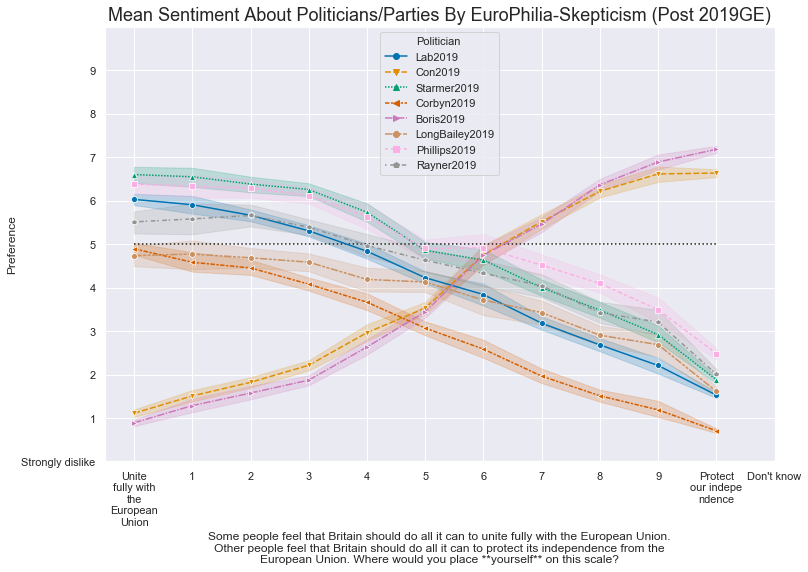

In [102]:
%%time
import itertools as it
x_var = "EUIntegrationSelfW19__Protect our independence"
filled_markers = it.cycle(['o', 'v', '^', '<', '>', '8', 's', 'p', '*', 'h', 'H', 'D', 'd', 'P', 'X'])
dash_styles = it.cycle(["",
               (4, 1.5),
               (1, 1),
               (3, 1, 1.5, 1),
               (5, 1, 1, 1),
               (5, 1, 2, 1, 2, 1),
               (2, 2, 3, 1.5),
               (1, 2.5, 3, 1.2)])

pol_list = ["Starmer","Corbyn","Lab","Boris","Con","LongBailey","Miliband","Phillips","Rayner","May"]
# ["Starmer","Corbyn","Phillips","Swinson","Rayner","LongBailey","Boris"]

pol_var_list_dict = {'like'+x+'W19__Strongly like':x+"2019" for x in pol_list if ('like'+x+'W19__Strongly like') in BES_reduced_with_na.columns}
# pol_var_list_dict.update( {'like'+x+'W13__Strongly like':x+"2017" for x in pol_list if ('like'+x+'W13__Strongly like') in BES_reduced_with_na.columns} )
pol_var_list = list( pol_var_list_dict.keys() )

df = BES_reduced_with_na[[x_var]+pol_var_list].astype('float32')
df["wts"] = BES_Panel[ "wt_new_W19_result" ]
# pol_dict = {x:'like'+x+'W19' for x in pol_list}
# for col in pol_dict.keys():
#     df[col+"_dk"] = (BES_Panel[pol_dict[col]]=="Don't know").astype('float32')*100
#     df[col+"_dk"][BES_Panel[pol_dict[col]].isnull()]=np.nan

df = df.set_index([x_var,"wts"]).stack().reset_index()
df.columns = [x_var,"wts","Politician","Preference"]

replace_dict = pol_var_list_dict
# dict(zip(pol_var_list,pol_list))

df["Politician"] = df["Politician"].replace(replace_dict)
# df = df[df["al_scaleW17__Authoritarian"]<=80]

df["Preference"] = list(zip(df["Preference"],df["wts"]))

# for col in ['like'+x+'W19'+"_dk" for x in pol_list]:
#     df[col+"_dk"] = list(zip(df[col],df["wts"]))

# df["al_scaleW17__Authoritarian"] = (df["al_scaleW17__Authoritarian"]/2).apply(lambda x: np.ceil(x)*2)

plt.figure(figsize=(12,8))
sns.lineplot(data=df[ df["Politician"].apply(lambda x: x in pol_var_list_dict.values()) ],style="Politician",markers=filled_markers,
             x=x_var,y="Preference",hue="Politician",n_boot=1000,estimator=weighted_mean,dashes=dash_styles,
             );

plt.ylim([0,10]);
plt.yticks(list(range(0,10)),BES_Panel["likeStarmerW19"].cat.categories[0:11]);
plt.hlines(5, 0, len(BES_Panel[x_var.split("_")[0]].cat.categories)-2, linestyles ='dotted');

plt.title("Mean Sentiment About Politicians/Parties By EuroPhilia-Skepticism (Post 2019GE)",fontsize=18);
from textwrap import wrap
plt.xticks(range(0,len(BES_Panel[x_var.split("_")[0]].cat.categories)),
           ["\n".join(wrap(x,10)) for x in BES_Panel[x_var.split("_")[0]].cat.categories]);
ques = "Some people feel that Britain should do all it can to unite fully with the European Union. Other people feel that Britain should do all it can to protect its independence from the European Union. Where would you place **yourself** on this scale?"

plt.xlabel("\n".join(wrap(ques,90)));

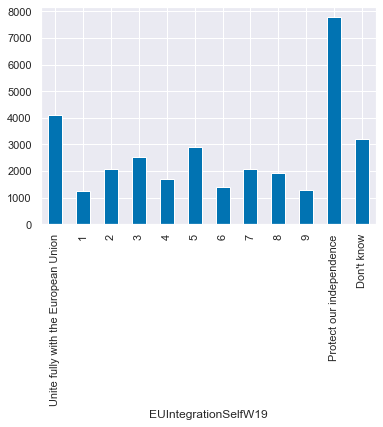

In [100]:
weighted_value_counts(BES_Panel["EUIntegrationSelfW19"], BES_Panel["wt_new_W19_result"]).sort_index()["weighted_sample_size"].plot(kind='bar');

Wall time: 4min 24s


Text(0.5, 0, 'Some people feel that Britain should do all it can to unite fully with the European Union.\nOther people feel that Britain should do all it can to protect its independence from the\nEuropean Union. Where would you place **yourself** on this scale?')

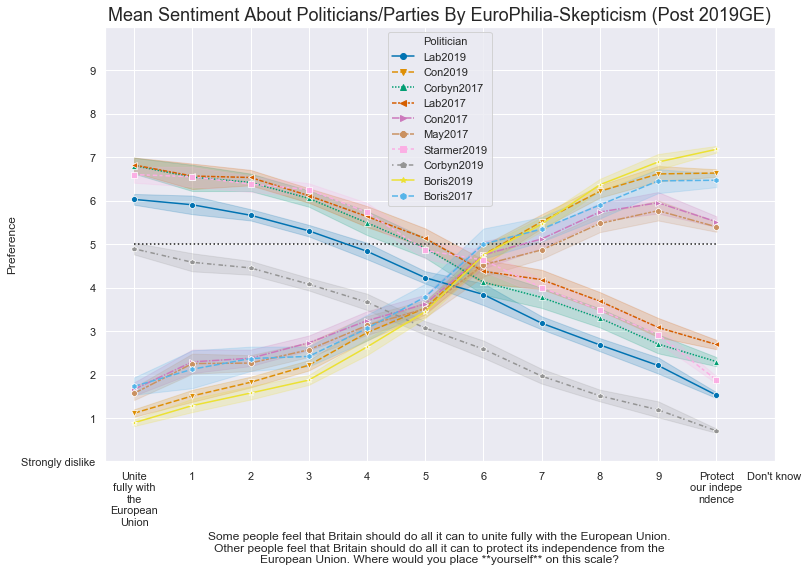

In [103]:
%%time
import itertools as it
x_var = "EUIntegrationSelfW19__Protect our independence"
filled_markers = it.cycle(['o', 'v', '^', '<', '>', '8', 's', 'p', '*', 'h', 'H', 'D', 'd', 'P', 'X'])
dash_styles = it.cycle(["",
               (4, 1.5),
               (1, 1),
               (3, 1, 1.5, 1),
               (5, 1, 1, 1),
               (5, 1, 2, 1, 2, 1),
               (2, 2, 3, 1.5),
               (1, 2.5, 3, 1.2)])

pol_list = ["Starmer","Corbyn","Lab","Boris","Con","May"]
# ["Starmer","Corbyn","Phillips","Swinson","Rayner","LongBailey","Boris"]

pol_var_list_dict = {'like'+x+'W19__Strongly like':x+"2019" for x in pol_list if ('like'+x+'W19__Strongly like') in BES_reduced_with_na.columns}
pol_var_list_dict.update( {'like'+x+'W13__Strongly like':x+"2017" for x in pol_list if ('like'+x+'W13__Strongly like') in BES_reduced_with_na.columns} )
pol_var_list = list( pol_var_list_dict.keys() )

df = BES_reduced_with_na[[x_var]+pol_var_list].astype('float32')
df["wts"] = BES_Panel[ "wt_new_W19_result" ]
# pol_dict = {x:'like'+x+'W19' for x in pol_list}
# for col in pol_dict.keys():
#     df[col+"_dk"] = (BES_Panel[pol_dict[col]]=="Don't know").astype('float32')*100
#     df[col+"_dk"][BES_Panel[pol_dict[col]].isnull()]=np.nan

df = df.set_index([x_var,"wts"]).stack().reset_index()
df.columns = [x_var,"wts","Politician","Preference"]

replace_dict = pol_var_list_dict
# dict(zip(pol_var_list,pol_list))

df["Politician"] = df["Politician"].replace(replace_dict)
# df = df[df["al_scaleW17__Authoritarian"]<=80]

df["Preference"] = list(zip(df["Preference"],df["wts"]))

# for col in ['like'+x+'W19'+"_dk" for x in pol_list]:
#     df[col+"_dk"] = list(zip(df[col],df["wts"]))

# df["al_scaleW17__Authoritarian"] = (df["al_scaleW17__Authoritarian"]/2).apply(lambda x: np.ceil(x)*2)

plt.figure(figsize=(12,8))
sns.lineplot(data=df[ df["Politician"].apply(lambda x: x in pol_var_list_dict.values()) ],style="Politician",markers=filled_markers,
             x=x_var,y="Preference",hue="Politician",n_boot=1000,estimator=weighted_mean,dashes=dash_styles,
             );

plt.ylim([0,10]);
plt.yticks(list(range(0,10)),BES_Panel["likeStarmerW19"].cat.categories[0:11]);
plt.hlines(5, 0, len(BES_Panel[x_var.split("_")[0]].cat.categories)-2, linestyles ='dotted');

plt.title("Mean Sentiment About Politicians/Parties By EuroPhilia-Skepticism (Post 2019GE)",fontsize=18);
from textwrap import wrap
plt.xticks(range(0,len(BES_Panel[x_var.split("_")[0]].cat.categories)),
           ["\n".join(wrap(x,10)) for x in BES_Panel[x_var.split("_")[0]].cat.categories]);
ques = "Some people feel that Britain should do all it can to unite fully with the European Union. Other people feel that Britain should do all it can to protect its independence from the European Union. Where would you place **yourself** on this scale?"

plt.xlabel("\n".join(wrap(ques,90)));

In [81]:
x_var = "EUIntegrationSelfW19__Protect our independence"

pol_list = ["Starmer","Corbyn","Lab","Boris","Con","LongBailey"]
# ["Starmer","Corbyn","Phillips","Swinson","Rayner","LongBailey","Boris"]

pol_var_list_dict = {'like'+x+'W19__Strongly like':x+"2019" for x in pol_list if ('like'+x+'W19__Strongly like') in BES_reduced_with_na.columns}
pol_var_list_dict.update( {'like'+x+'W1__Strongly like':x+"2019" for x in pol_list if ('like'+x+'W1__Strongly like') in BES_reduced_with_na.columns} )
pol_var_list = list( pol_var_list_dict.keys() )
pol_var_list

['likeStarmerW19__Strongly like',
 'likeCorbynW19__Strongly like',
 'likeLabW19__Strongly like',
 'likeBorisW19__Strongly like',
 'likeConW19__Strongly like',
 'likeLongBaileyW19__Strongly like',
 'likeLabW1__Strongly like',
 'likeConW1__Strongly like']

In [82]:
pol_var_list_dict

{'likeStarmerW19__Strongly like': 'Starmer2019',
 'likeCorbynW19__Strongly like': 'Corbyn2019',
 'likeLabW19__Strongly like': 'Lab2019',
 'likeBorisW19__Strongly like': 'Boris2019',
 'likeConW19__Strongly like': 'Con2019',
 'likeLongBaileyW19__Strongly like': 'LongBailey2019',
 'likeLabW1__Strongly like': 'Lab2019',
 'likeConW1__Strongly like': 'Con2019'}

In [66]:
x_var = "EUIntegrationSelfW19__Protect our independence"

pol_list = ["Starmer","Corbyn","Lab","Boris","Con","LongBailey"]

In [70]:
pol_var_list_dict = {'like'+x+'W19__Strongly like':x+"2019" for 'like'+x+'W19__Strongly like' in pol_list if x in BES_reduced_with_na.columns}
pol_var_list_dict.update( {'like'+x+'W1__Strongly like':x+"2019" for 'like'+x+'W1__Strongly like' in pol_list if x in BES_reduced_with_na.columns} )
pol_var_list_dict = list( pol_var_list_dict.keys() )

df = BES_reduced_with_na[[x_var]+pol_var_list].astype('float32')
df["wts"] = BES_Panel[ "wt_new_W19_result" ]

SyntaxError: can't assign to operator (<ipython-input-70-b3e4264709b2>, line 1)

In [71]:
{'like'+x+'W1__Strongly like':x+"2019" for 'like'+x+'W1__Strongly like' in pol_list if x in BES_reduced_with_na.columns}

SyntaxError: can't assign to operator (<ipython-input-71-c2ba24b1cdb0>, line 1)

In [77]:
{'like'+x+'W19__Strongly like':x+"2019" for x in pol_list if ('like'+x+'W19__Strongly like') in BES_reduced_with_na.columns}

{'likeStarmerW19__Strongly like': 'Starmer2019',
 'likeCorbynW19__Strongly like': 'Corbyn2019',
 'likeLabW19__Strongly like': 'Lab2019',
 'likeBorisW19__Strongly like': 'Boris2019',
 'likeConW19__Strongly like': 'Con2019',
 'likeLongBaileyW19__Strongly like': 'LongBailey2019'}

In [111]:
weighted_value_counts(BES_Panel[BES_Panel["EUIntegrationSelfW19"]=="Protect our independence"]["generalElectionVoteW1"],
                      BES_Panel["wt_new_W19_result"],normalize=True,perc=True)

,weighted_sample_percentage,raw_sample_size
generalElectionVoteW1,,
Plaid Cymru,0.01,5.0
Green Party,0.04,18.0
Other,0.07,34.0
Liberal Democrat,0.09,39.0
British National Party (BNP),0.10,34.0
Scottish National Party (SNP),0.12,58.0
I would not vote,0.37,94.0
Don't know,0.80,306.0
Labour,0.86,362.0


In [125]:
BES_Panel["EUIntegrationSelfW19"].notnull().sum()/((BES_Panel["EUIntegrationSelfW19"]=="Protect our independence") & BES_Panel["pastvote_ge_2019W19"].notnull()).sum()

4.119446933811291

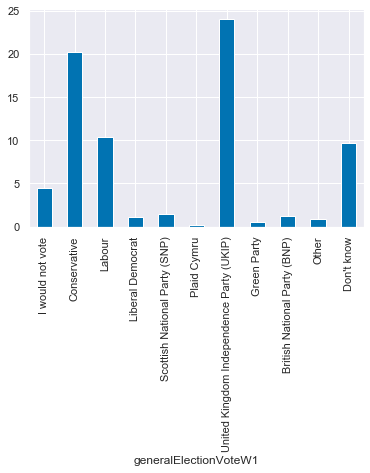

In [115]:
(weighted_value_counts(BES_Panel[BES_Panel["EUIntegrationSelfW19"]=="Protect our independence"]["generalElectionVoteW1"],
                      BES_Panel["wt_new_W19_result"],normalize=True,perc=True).sort_index()["weighted_sample_percentage"]*12.114834337349398).plot(kind='bar');

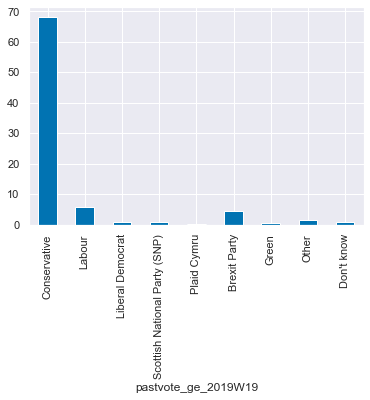

In [122]:
(weighted_value_counts(BES_Panel[BES_Panel["EUIntegrationSelfW19"]=="Protect our independence"]["pastvote_ge_2019W19"],
                      BES_Panel["wt_new_W19_result"],normalize=True,perc=True).sort_index()["weighted_sample_percentage"]*4.119446933811291).plot(kind='bar');

In [124]:
(weighted_value_counts(BES_Panel[BES_Panel["EUIntegrationSelfW19"]=="Protect our independence"]["pastvote_ge_2019W19"],
                      BES_Panel["wt_new_W19_result"],normalize=True,perc=True).sort_index()["weighted_sample_percentage"]*4.119446933811291).sum()

82.80088462645548

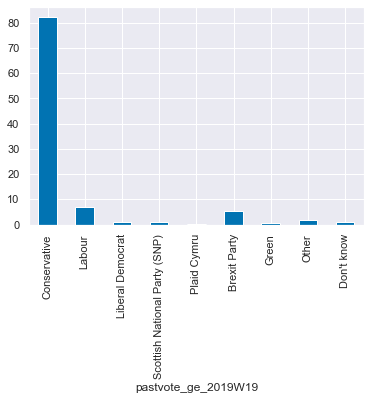

In [134]:
((weighted_value_counts(BES_Panel[BES_Panel["EUIntegrationSelfW19"]=="Protect our independence"]["pastvote_ge_2019W19"],
                      BES_Panel["wt_new_W19_result"],normalize=True,perc=True).sort_index()["weighted_sample_percentage"]*100)/(weighted_value_counts(BES_Panel[BES_Panel["EUIntegrationSelfW19"]=="Protect our independence"]["pastvote_ge_2019W19"],
                      BES_Panel["wt_new_W19_result"],normalize=True,perc=True).sort_index()["weighted_sample_percentage"]).sum()).plot(kind='bar');

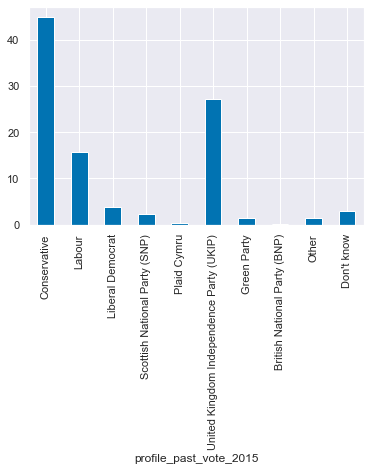

In [133]:
((weighted_value_counts(BES_Panel[BES_Panel["EUIntegrationSelfW19"]=="Protect our independence"]["profile_past_vote_2015"],
                      BES_Panel["wt_new_W19_result"],normalize=True,perc=True).sort_index()["weighted_sample_percentage"]*100)/(weighted_value_counts(BES_Panel[BES_Panel["EUIntegrationSelfW19"]=="Protect our independence"]["profile_past_vote_2015"],
                      BES_Panel["wt_new_W19_result"],normalize=True,perc=True).sort_index()["weighted_sample_percentage"]).sum()).plot(kind='bar');

In [128]:
search(BES_Panel,"profile_past")

profile_past_vote_2005    56631
profile_past_vote_2010    65581
profile_past_vote_2017    60451
profile_past_vote_2015    70577
dtype: int64

In [130]:
BES_Panel["EUIntegrationSelfW19"]

0                      Don't know
1        Protect our independence
2        Protect our independence
3                               4
4        Protect our independence
                   ...           
97153                         NaN
97154                         NaN
97155                         NaN
97156                         NaN
97157                         NaN
Name: EUIntegrationSelfW19, Length: 97158, dtype: category
Categories (12, object): [Unite fully with the European Union < 1 < 2 < 3 ... 8 < 9 < Protect our independence < Don't know]

In [131]:
(weighted_value_counts(BES_Panel[BES_Panel["EUIntegrationSelfW19"]=="Unite fully with the European Union"]["profile_past_vote_2015"],
                      BES_Panel["wt_new_W19_result"],normalize=True,perc=True).sort_index()["weighted_sample_percentage"]*100)/(weighted_value_counts(BES_Panel[BES_Panel["EUIntegrationSelfW19"]=="Unite fully with the European Union"]["profile_past_vote_2015"],
                      BES_Panel["wt_new_W19_result"],normalize=True,perc=True).sort_index()["weighted_sample_percentage"]).sum()

profile_past_vote_2015
Conservative                                13.827433
Labour                                      50.110621
Liberal Democrat                            12.278761
Scottish National Party (SNP)                7.079646
Plaid Cymru                                  0.774336
United Kingdom Independence Party (UKIP)     1.438053
Green Party                                  9.845132
British National Party (BNP)                 0.000000
Other                                        1.659292
Don't know                                   2.986726
Name: weighted_sample_percentage, dtype: float64

In [132]:
(weighted_value_counts(BES_Panel[BES_Panel["EUIntegrationSelfW19"]=="Unite fully with the European Union"]["pastvote_ge_2019W19"],
                      BES_Panel["wt_new_W19_result"],normalize=True,perc=True).sort_index()["weighted_sample_percentage"]*100)/(weighted_value_counts(BES_Panel[BES_Panel["EUIntegrationSelfW19"]=="Unite fully with the European Union"]["pastvote_ge_2019W19"],
                      BES_Panel["wt_new_W19_result"],normalize=True,perc=True).sort_index()["weighted_sample_percentage"]).sum()

pastvote_ge_2019W19
Conservative                      4.0
Labour                           60.7
Liberal Democrat                 21.4
Scottish National Party (SNP)     8.7
Plaid Cymru                       0.7
Brexit Party                      0.0
Green                             2.9
Other                             0.6
Don't know                        1.0
Name: weighted_sample_percentage, dtype: float64

In [138]:
search(BES_Panel, "past")

headHouseholdPastW1       30568
headHouseholdPastW2        2402
headHouseholdPastW3        2601
headHouseholdPastW4        4521
partyMemberPastW6          3376
headHouseholdPastW7        7653
partyMemberPastW8          2519
headHouseholdPastW9       26133
partyMemberPastW10         2462
headHouseholdPastW10      26821
partyMemberPastW11         2952
headHouseholdPastW11      27163
euRefpastVoteW11          27999
partyMemberPastW12         3237
euRefpastVoteW12          31173
partyMemberPastW13          114
headHouseholdPastW13      27415
euRefpastVoteW13          28288
partyMemberPastW14         2817
euRefpastVoteW14           3822
partyMemberPastW15         2916
euRefpastVoteW15          27007
euRefpastVoteW17           2643
pastvote_EURefW17         34352
pastvote_eup_2019W18      27133
pastvote_ge_2019W19       28284
pastvote_eup_2019W19      23186
headHouseholdPast         63607
profile_past_vote_2005    56631
profile_past_vote_2010    65581
profile_past_vote_2017    60451
profile_

In [263]:
Con2019 = BES_Panel["pastvote_ge_2019W19"]=="Conservative"
Lab2019 = BES_Panel["pastvote_ge_2019W19"]=="Labour"
LD2019 = BES_Panel["pastvote_ge_2019W19"]=="Liberal Democrat"
BXP2019 = BES_Panel["pastvote_ge_2019W19"]=="Brexit Party"

NotConLab2019 = BES_Panel["pastvote_ge_2019W19"].apply(lambda x: x not in ["Labour","Conservative"]).fillna(False)

In [262]:
BES_Panel["pastvote_ge_2019W19"].cat.categories

Index(['Conservative', 'Labour', 'Liberal Democrat',
       'Scottish National Party (SNP)', 'Plaid Cymru', 'Brexit Party', 'Green',
       'Other', 'Don't know'],
      dtype='object')

In [254]:
BES_Panel["pastvote_ge_2019W19"]

0        Brexit Party
1        Conservative
2        Conservative
3                 NaN
4        Conservative
             ...     
97153             NaN
97154             NaN
97155             NaN
97156             NaN
97157             NaN
Name: pastvote_ge_2019W19, Length: 97158, dtype: category
Categories (9, object): [Conservative < Labour < Liberal Democrat < Scottish National Party (SNP) ... Brexit Party < Green < Other < Don't know]

In [142]:
search(BES_reduced_with_na,"likeStarmer")

likeStarmerW19__Strongly like    17424
dtype: int64

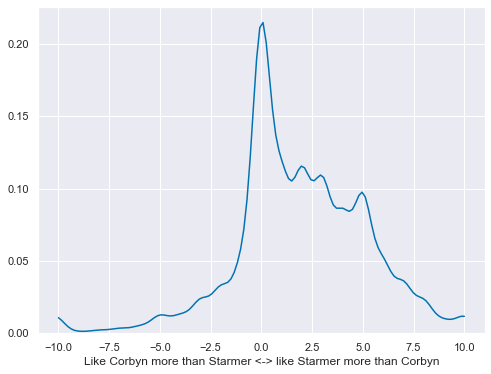

In [148]:
plt.figure(figsize=(8,6));
sns.kdeplot(BES_reduced_with_na["likeStarmerW19__Strongly like"]-BES_reduced_with_na["likeCorbynW19__Strongly like"],
           cut=0);
# plt.xticks("");
plt.xlabel("Like Corbyn more than Starmer <-> like Starmer more than Corbyn");

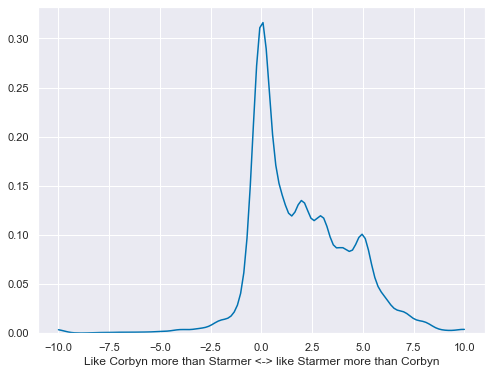

In [149]:
plt.figure(figsize=(8,6));
sns.kdeplot((BES_reduced_with_na["likeStarmerW19__Strongly like"]-BES_reduced_with_na["likeCorbynW19__Strongly like"])[Con2019],
           cut=0);
# plt.xticks("");
plt.xlabel("Like Corbyn more than Starmer <-> like Starmer more than Corbyn");

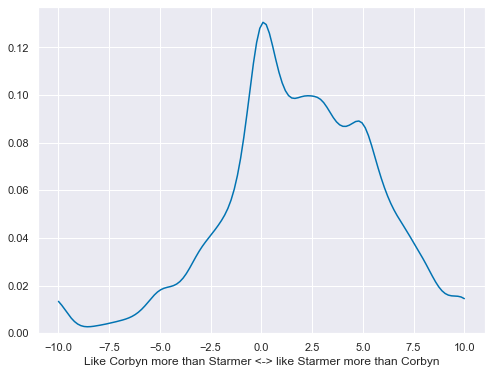

In [150]:
plt.figure(figsize=(8,6));
sns.kdeplot((BES_reduced_with_na["likeStarmerW19__Strongly like"]-BES_reduced_with_na["likeCorbynW19__Strongly like"])[~Con2019],
           cut=0);
# plt.xticks("");
plt.xlabel("Like Corbyn more than Starmer <-> like Starmer more than Corbyn");

In [151]:
search(BES_Panel,"reasonForVote")

reasonForVoteW6     27838
reasonForVoteW13    28297
reasonForVoteW19    28901
dtype: int64

In [155]:
BES_Panel["reasonForVoteW19"][Con2019].value_counts()

I thought it was the best party                                                          6761
I always vote that way                                                                   2206
Other                                                                                    1388
I thought that party had the best candidate                                              1309
I really preferred another party but it had no chance of winning in this constituency     646
None of these                                                                             259
Don't know                                                                                 61
Name: reasonForVoteW19, dtype: int64

In [157]:
UnenthusiasticVoter = BES_Panel["reasonForVoteW19"].apply(lambda x: x in ["Other",
                                                    "I really preferred another party but it had no chance of winning in this constituency",
                                                    "None of these"])

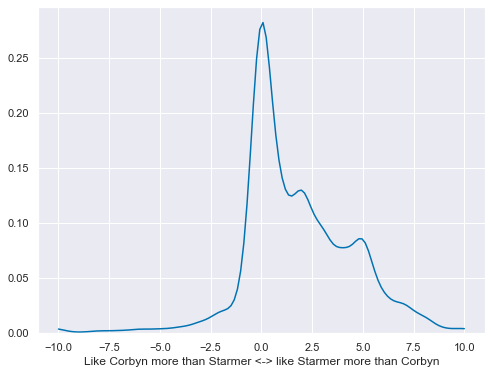

In [164]:
plt.figure(figsize=(8,6));
sns.kdeplot((BES_reduced_with_na["likeStarmerW19__Strongly like"]-BES_reduced_with_na["likeCorbynW19__Strongly like"])[Con2019&UnenthusiasticVoter],
           cut=0,bw=.5);
# plt.xticks("");
plt.xlabel("Like Corbyn more than Starmer <-> like Starmer more than Corbyn");

In [163]:
(BES_reduced_with_na["likeStarmerW19__Strongly like"]-BES_reduced_with_na["likeCorbynW19__Strongly like"])[Con2019&UnenthusiasticVoter].value_counts().sort_index()

-10      1
-9       1
-8       3
-7       3
-6       5
-5       5
-4       7
-3      13
-2      26
-1      32
 0     439
 1     148
 2     175
 3     121
 4      93
 5     121
 6      42
 7      35
 8      20
 9       5
 10      6
dtype: Int64

In [174]:
(BES_reduced_with_na["likeLDW17__Strongly like"]-BES_reduced_with_na["likeConW17__Strongly like"])[Con2019].value_counts().sort_index()

-10     796
-9      446
-8      905
-7     1047
-6      882
-5     1077
-4      822
-3      778
-2      694
-1      459
 0      462
 1      121
 2       81
 3       51
 4       28
 5       27
 6        7
 7        4
 8        3
 9        1
 10       1
dtype: Int64

In [175]:
likeLDeqormorethanCon = (BES_reduced_with_na["likeLDW19__Strongly like"]-BES_reduced_with_na["likeConW19__Strongly like"])>=0

In [178]:
likeLDeqormorethanCon.fillna(False)

0         True
1        False
2        False
3         True
4        False
         ...  
97153    False
97154    False
97155    False
97156    False
97157    False
Length: 97158, dtype: boolean

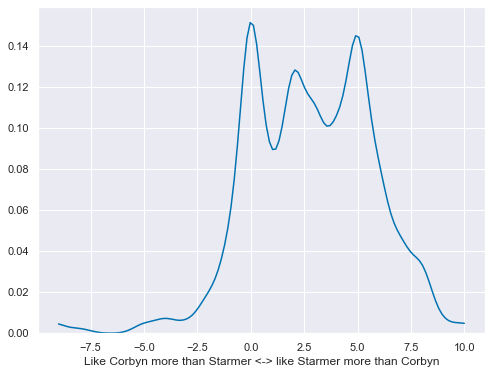

In [179]:
plt.figure(figsize=(8,6));
sns.kdeplot((BES_reduced_with_na["likeStarmerW19__Strongly like"]-BES_reduced_with_na["likeCorbynW19__Strongly like"])[Con2019&likeLDeqormorethanCon.fillna(False)],
           cut=0,bw=.5);
# plt.xticks("");
plt.xlabel("Like Corbyn more than Starmer <-> like Starmer more than Corbyn");

In [184]:
Con2019.sum()

12666

In [182]:
(Con2019&likeLDeqormorethanCon).sum()

840

In [202]:
search(BES_Panel,"wt_new")

wt_new_W10           30237
wt_new_W11           30956
wt_new_W14           31063
wt_new_W15           30842
wt_new_W16           37959
wt_new_W1_W16         2427
wt_new_W18           37825
wt_new_W6W7          21081
wt_new_W2W6          23163
wt_new_W2W6W7        17076
wt_new_W9_W13        12562
wt_new_W12           34394
wt_new_W1_W11         6473
wt_new_W1_W12         5833
wt_new_W1_W13         5301
wt_new_W6_W11         9373
wt_new_W6_W12         8398
wt_new_W6_W13         7622
wt_new_W11_W13       21520
wt_new_W13W16        14647
wt_new_W13_result    31135
wt_new_W6W16          9587
wt_new_W2W16          8388
wt_new_W17           34366
wt_new_W13W17        15744
wt_new_W6W13W19       8743
wt_new_W9W19         13604
wt_new_W13_W19        5861
wt_new_W13W19        15811
wt_new_W16W19        21840
wt_new_W17W18W19     19000
wt_new_W19_result    32177
wt_new_W9            30036
wt_new_W8            33502
wt_new_W7            30895
wt_new_W6            30073
wt_new_W13W14        20393
w

In [186]:
(BES_reduced_with_na["likeBorisW18__Strongly like"]-BES_reduced_with_na["likeCorbynW18__Strongly like"])

0        <NA>
1        <NA>
2        <NA>
3          -6
4          10
         ... 
97153    <NA>
97154    <NA>
97155    <NA>
97156    <NA>
97157    <NA>
Length: 97158, dtype: Int8

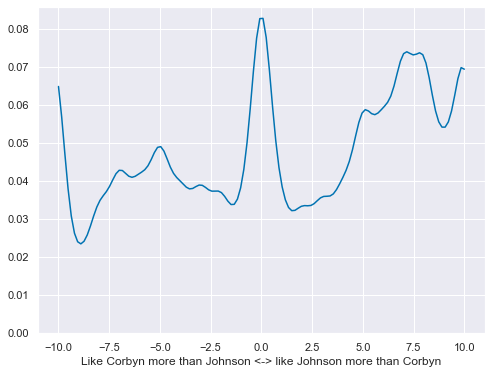

In [187]:
plt.figure(figsize=(8,6));
sns.kdeplot((BES_reduced_with_na["likeBorisW18__Strongly like"]-BES_reduced_with_na["likeCorbynW18__Strongly like"]),
           cut=0,bw=.5);
# plt.xticks("");
plt.xlabel("Like Corbyn more than Johnson <-> like Johnson more than Corbyn");

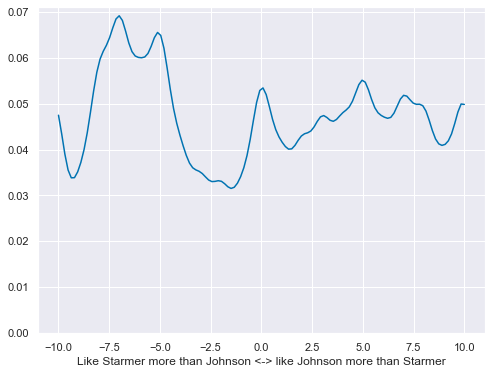

In [188]:
plt.figure(figsize=(8,6));
sns.kdeplot((BES_reduced_with_na["likeBorisW19__Strongly like"]-BES_reduced_with_na["likeStarmerW19__Strongly like"]),
           cut=0,bw=.5);
# plt.xticks("");
plt.xlabel("Like Starmer more than Johnson <-> like Johnson more than Starmer");

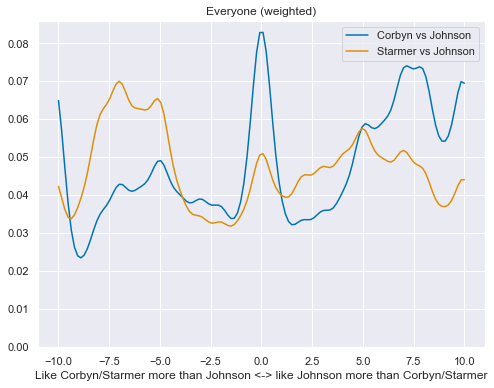

In [208]:
df = (BES_reduced_with_na["likeBorisW18__Strongly like"]-BES_reduced_with_na["likeCorbynW18__Strongly like"])
mask = df.notnull()
indices = lazy_weighted_indices(BES_Panel["wt_new_W18"][mask])
plt.figure(figsize=(8,6));
ax = plt.gca()
sns.kdeplot(df,
           cut=0,bw=.5,label="Corbyn vs Johnson",ax=ax);
df = (BES_reduced_with_na["likeBorisW18__Strongly like"]-BES_reduced_with_na["likeStarmerW19__Strongly like"])
mask = df.notnull()
indices = lazy_weighted_indices(BES_Panel["wt_new_W19_result"][mask])
sns.kdeplot(df,
           cut=0,bw=.5,label="Starmer vs Johnson",ax=ax);

plt.title("Electorate (weighted)")
plt.xlabel("Like Corbyn/Starmer more than Johnson <-> like Johnson more than Corbyn/Starmer");

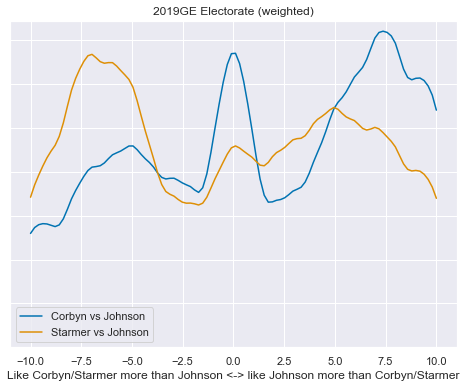

In [250]:
df = (BES_reduced_with_na["likeBorisW18__Strongly like"]-BES_reduced_with_na["likeCorbynW18__Strongly like"])
mask = df.notnull()
indices = lazy_weighted_indices(BES_Panel["wt_new_W18"][mask])
plt.figure(figsize=(8,6));
ax = plt.gca()
sns.kdeplot(df[mask],
            cut=0,bw=2,kernel='triw',
            label="Corbyn vs Johnson",ax=ax);
df = (BES_reduced_with_na["likeBorisW18__Strongly like"]-BES_reduced_with_na["likeStarmerW19__Strongly like"])
mask = df.notnull()
indices = lazy_weighted_indices(BES_Panel["wt_new_W19_result"][mask])
sns.kdeplot(df[mask],
            cut=0,bw=2,kernel='triw',
            label="Starmer vs Johnson",ax=ax);

plt.gca().set_yticklabels([]);
plt.title("2019GE Electorate (weighted)");
plt.xlabel("Like Corbyn/Starmer more than Johnson <-> like Johnson more than Corbyn/Starmer");

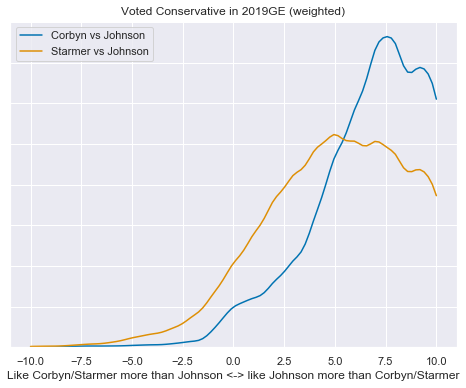

In [251]:
df = (BES_reduced_with_na["likeBorisW18__Strongly like"]-BES_reduced_with_na["likeCorbynW18__Strongly like"])
mask = df.notnull()&Con2019
indices = lazy_weighted_indices(BES_Panel["wt_new_W18"][mask])
plt.figure(figsize=(8,6));
ax = plt.gca()
sns.kdeplot(df[mask],
            cut=0,bw=2,kernel='triw',
            label="Corbyn vs Johnson",ax=ax);
df = (BES_reduced_with_na["likeBorisW18__Strongly like"]-BES_reduced_with_na["likeStarmerW19__Strongly like"])
mask = df.notnull()&Con2019
indices = lazy_weighted_indices(BES_Panel["wt_new_W19_result"][mask])
sns.kdeplot(df[mask],
            cut=0,bw=2,kernel='triw',
            label="Starmer vs Johnson",ax=ax);

plt.gca().set_yticklabels([]);
plt.title("Voted Conservative in 2019GE (weighted)");
plt.xlabel("Like Corbyn/Starmer more than Johnson <-> like Johnson more than Corbyn/Starmer");

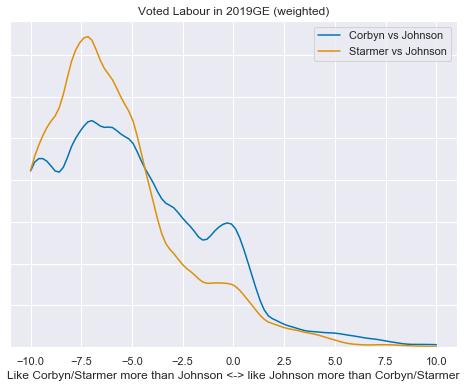

In [253]:
df = (BES_reduced_with_na["likeBorisW18__Strongly like"]-BES_reduced_with_na["likeCorbynW18__Strongly like"])
mask = df.notnull()&Lab2019
indices = lazy_weighted_indices(BES_Panel["wt_new_W18"][mask])
plt.figure(figsize=(8,6));
ax = plt.gca()
sns.kdeplot(df[mask],
            cut=0,bw=2,kernel='triw',
            label="Corbyn vs Johnson",ax=ax);
df = (BES_reduced_with_na["likeBorisW18__Strongly like"]-BES_reduced_with_na["likeStarmerW19__Strongly like"])
mask = df.notnull()&Lab2019
indices = lazy_weighted_indices(BES_Panel["wt_new_W19_result"][mask])
sns.kdeplot(df[mask],
            cut=0,bw=2,kernel='triw',
            label="Starmer vs Johnson",ax=ax);

plt.gca().set_yticklabels([]);
plt.title("Voted Labour in 2019GE (weighted)");
plt.xlabel("Like Corbyn/Starmer more than Johnson <-> like Johnson more than Corbyn/Starmer");

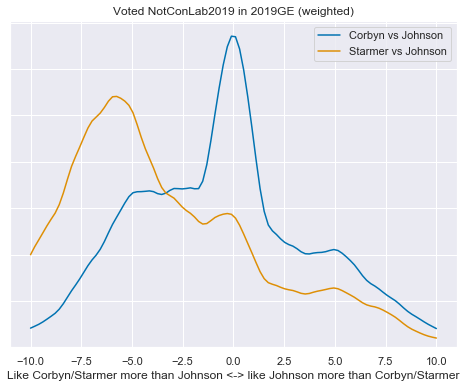

In [259]:
df = (BES_reduced_with_na["likeBorisW18__Strongly like"]-BES_reduced_with_na["likeCorbynW18__Strongly like"])
mask = df.notnull()&NotConLab2019
indices = lazy_weighted_indices(BES_Panel["wt_new_W18"][mask])
plt.figure(figsize=(8,6));
ax = plt.gca()
sns.kdeplot(df[mask],
            cut=0,bw=2,kernel='triw',
            label="Corbyn vs Johnson",ax=ax);
df = (BES_reduced_with_na["likeBorisW18__Strongly like"]-BES_reduced_with_na["likeStarmerW19__Strongly like"])
mask = df.notnull()&NotConLab2019
indices = lazy_weighted_indices(BES_Panel["wt_new_W19_result"][mask])
sns.kdeplot(df[mask],
            cut=0,bw=2,kernel='triw',
            label="Starmer vs Johnson",ax=ax);

plt.gca().set_yticklabels([]);
plt.title("Voted NotConLab2019 in 2019GE (weighted)");
plt.xlabel("Like Corbyn/Starmer more than Johnson <-> like Johnson more than Corbyn/Starmer");

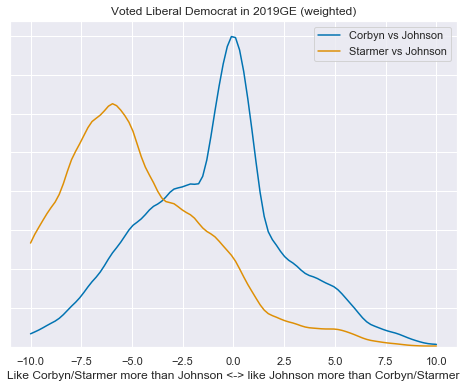

In [260]:
df = (BES_reduced_with_na["likeBorisW18__Strongly like"]-BES_reduced_with_na["likeCorbynW18__Strongly like"])
mask = df.notnull()&LD2019
indices = lazy_weighted_indices(BES_Panel["wt_new_W18"][mask])
plt.figure(figsize=(8,6));
ax = plt.gca()
sns.kdeplot(df[mask],
            cut=0,bw=2,kernel='triw',
            label="Corbyn vs Johnson",ax=ax);
df = (BES_reduced_with_na["likeBorisW18__Strongly like"]-BES_reduced_with_na["likeStarmerW19__Strongly like"])
mask = df.notnull()&LD2019
indices = lazy_weighted_indices(BES_Panel["wt_new_W19_result"][mask])
sns.kdeplot(df[mask],
            cut=0,bw=2,kernel='triw',
            label="Starmer vs Johnson",ax=ax);

plt.gca().set_yticklabels([]);
plt.title("Voted Liberal Democrat in 2019GE (weighted)");
plt.xlabel("Like Corbyn/Starmer more than Johnson <-> like Johnson more than Corbyn/Starmer");

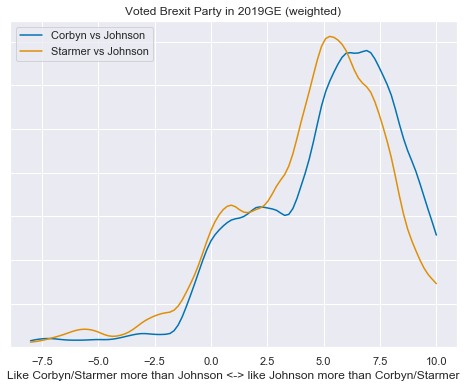

In [264]:
df = (BES_reduced_with_na["likeBorisW18__Strongly like"]-BES_reduced_with_na["likeCorbynW18__Strongly like"])
mask = df.notnull()&BXP2019
indices = lazy_weighted_indices(BES_Panel["wt_new_W18"][mask])
plt.figure(figsize=(8,6));
ax = plt.gca()
sns.kdeplot(df[mask],
            cut=0,bw=2,kernel='triw',
            label="Corbyn vs Johnson",ax=ax);
df = (BES_reduced_with_na["likeBorisW18__Strongly like"]-BES_reduced_with_na["likeStarmerW19__Strongly like"])
mask = df.notnull()&BXP2019
indices = lazy_weighted_indices(BES_Panel["wt_new_W19_result"][mask])
sns.kdeplot(df[mask],
            cut=0,bw=2,kernel='triw',
            label="Starmer vs Johnson",ax=ax);

plt.gca().set_yticklabels([]);
plt.title("Voted Brexit Party in 2019GE (weighted)");
plt.xlabel("Like Corbyn/Starmer more than Johnson <-> like Johnson more than Corbyn/Starmer");

In [ ]:
# kernel{‘gau’ | ‘cos’ | ‘biw’ | ‘epa’ | ‘tri’ | ‘triw’ }, optional
seaborn.kdeplot(data, data2=None, shade=False, vertical=False, kernel='gau', bw='scott', gridsize=100, cut=3, clip=None, legend=True, cumulative=False, shade_lowest=True, cbar=False, cbar_ax=None, cbar_kws=None, ax=None, **kwargs)

In [222]:
df[mask].value_counts().sort_index()

-10       1
-9        1
-8        5
-7        7
-6        5
-5        9
-4       14
-3       12
-2       37
-1       33
 0      278
 1      195
 2      348
 3      428
 4      577
 5     1072
 6     1097
 7     1614
 8     1674
 9     1109
 10    1845
dtype: Int64

In [217]:
(BES_reduced_with_na["likeBorisW18__Strongly like"]-BES_reduced_with_na["likeCorbynW18__Strongly like"])[Con2019].value_counts()

 10    1845
 8     1674
 7     1614
 9     1109
 6     1097
 5     1072
 4      577
 3      428
 2      348
 0      278
 1      195
-2       37
-1       33
-4       14
-3       12
-5        9
-7        7
-6        5
-8        5
-10       1
-9        1
dtype: Int64